# Assignment 5

**Submission deadlines:**
- get at least 4 points by Tuesday, 8.06 
- remaining points: last lab session of the semester

**Points:** Aim to get 12 out of 16 possible points.


## Submission instructions
The class is held remotely. To submit your solutions please show the notebook over the video call. Make sure you know all the questions and answers, and that the notebook contains results (before presentation do `Runtime -> Restart and run all`)

We provide a starter code, however, you are not required to use it as long as you properly solve the tasks.

As always, please submit corrections using GitHub's Pull Requests to https://github.com/janchorowski/dl_uwr.

# Problem 1: Generating 2 Moons data
Consider the 2D moons dataset generated in the starter code below. 

Train the following models: VAE, GAN, RealNVP. 

For each model visualize how the latent space is transformed into data points. Train a model with 2D latent space. Then whenever applicable:
1. Plot the data points along with a grid, then plot latent encodings of the data and the grid.
2. Generate latent encodings and a grid in latent space. Then sample data points based on the generated latent space and grid. Plot them in the data space.

Hint: for better visual mapping between original and latent representations of the data, use color on the scatterplots.

## Tasks:
1. [4p] Variational Autoencoder (VAE)

  Please use the following probability distributions:
    
  $$
    \begin{split}
    p(z) &= \mathcal{N}(z; \mu=0, \sigma^2=1)  \\
    p(x | z) &= \mathcal{N}(x; \mu=x_{\mu}(z), \sigma^2=x_{\sigma^2})
    \end{split}
  $$

  where: $x_{\mu}(z)$ is computed by a small neural network and $x_{\sigma^2}$ is a learned parameter.

  **Answer these questions:**
  
  1. Write down the formula for the reconstruction loss. The variance appears in two terms, what is their function?

  2. The reconstruction loss may fall below zero. How is this possible? 

  Compare the operation of the VAE for 2 Moons with a few widths. How is the loss dependent on the width? Why?

2. [3p] Generative Adversarial Network (GAN)

  Please use either a standard normal distribution for the latent space or a uniform distribution.

  **Answer these questions:**
  - Is the GAN generating all possible samples? Is it concentrating more on some regions of the data space?

3. [3p] Normalizing Flow (Real NVP model).

  The goal of Normalizing Flows is to learn invertible transformation between complex data distribution and some simple one, i.e. multivariate isotropic Gaussian. Since the latter is continuous, and our dataset is finite (hence in fact forms a discrete distribution, because you can memorize all observed values), we need to perform *dequantization*, that is add random noise to data at every iteration to train the model on an infinite stream of data. This is especially important in Problem 2 when RealNVP is applied to the MNIST data.

    **Answer these questions:**
  - Scale the input data by 0.01. Why is the negative log-likelihood negative?
  - For a few 2 moon widths compare the negative log-likelihood of the data with the values obtained with the VAE and present results in a table. How do they compare? Please note, that GAN's do not return likelihood computation.


# Problem 2: Generating MNIST

Next, choose one of the generative models (VAE, RealNVP, or GAN) and do the following using the MNIST dataset:

##Tasks
1. [2p] Train the model. Visualize generated samples (and test/train data reconstructions if you chose VAE).

Please properly define $p(x|z)$: when using a VAE, you can binarize the data and predict binary variables. For RealNVP, you can normalize the data to the 0-1 range, and add uniform noise $[0,1/255]$ to dequantize intensity values. GAN does not assume an output probability distribution and you may use raw data.

2. [1p] Linearly interpolate between two points in the latent space. Generate images from them and intermediate points. 

3. [1p] Try a different interpolation method, i.e. instead of going in a straight line from one point to another, follow the spherical curve of prior Gaussian distribution.

4. [2p] It is sometimes desirable to make use of available labels to gain control over classes of generated samples. Create a conditional generative model of your choice by injecting one-hot embeddings into the proper component(s). An example is [Conditional GAN](https://arxiv.org/abs/1411.1784), and its idea is applicable to other methods.


# Starter code

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

import torch
import torch.nn as nn
import torch.optim as optim
from torch.distributions import MultivariateNormal, Uniform
from torch.utils.data import DataLoader, Dataset
from torchvision.transforms import Compose
import os
import time

from IPython.display import clear_output
from tqdm.auto import tqdm

import torch.nn.functional as F
import torchvision.datasets

device = "cuda"

## Data

In [ ]:
def generate_moons(width=1.0):
    moon1 = [
        [r * np.cos(a) - 2.5, r * np.sin(a) - 1.0]
        for r in np.arange(5 - width, 5 + width, 0.1 * width)
        for a in np.arange(0, np.pi, 0.01)
    ]
    moon2 = [
        [r * np.cos(a) + 2.5, r * np.sin(a) + 1.0]
        for r in np.arange(5 - width, 5 + width, 0.1 * width)
        for a in np.arange(np.pi, 2 * np.pi, 0.01)
    ]
    points = torch.tensor(moon1 + moon2)
    points += torch.rand(points.shape) * width
    return points.float()

In [ ]:
class InMemDataLoader(object):
    __initialized = False
    def __init__(self, tensors, batch_size=1, shuffle=False, sampler=None,
                 batch_sampler=None, drop_last=False):
        """A torch dataloader that fetches data from memory."""
        tensors = [torch.tensor(tensor) for tensor in tensors]
        dataset = torch.utils.data.TensorDataset(*tensors)
        self.dataset = dataset
        self.batch_size = batch_size
        self.drop_last = drop_last
        
        if batch_sampler is not None:
            if batch_size > 1 or shuffle or sampler is not None or drop_last:
                raise ValueError('batch_sampler option is mutually exclusive '
                                 'with batch_size, shuffle, sampler, and '
                                 'drop_last')
            self.batch_size = None
            self.drop_last = None

        if sampler is not None and shuffle:
            raise ValueError('sampler option is mutually exclusive with '
                             'shuffle')
            
        if batch_sampler is None:
            if sampler is None:
                if shuffle:
                    sampler = torch.utils.data.RandomSampler(dataset)
                else:
                    sampler = torch.utils.data.SequentialSampler(dataset)
            batch_sampler = torch.utils.data.BatchSampler(sampler, batch_size, drop_last)

        self.sampler = sampler
        self.batch_sampler = batch_sampler
        self.__initialized = True
    
    def __setattr__(self, attr, val):
        if self.__initialized and attr in ('batch_size', 'sampler', 'drop_last'):
            raise ValueError('{} attribute should not be set after {} is '
                             'initialized'.format(attr, self.__class__.__name__))

        super(InMemDataLoader, self).__setattr__(attr, val)

    def __iter__(self):
        for batch_indices in self.batch_sampler:
            yield self.dataset[batch_indices]

    def __len__(self):
        return len(self.batch_sampler)
    
    def to(self, device):
        self.dataset.tensors = tuple(t.to(device) for t in self.dataset.tensors)
        return self

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  


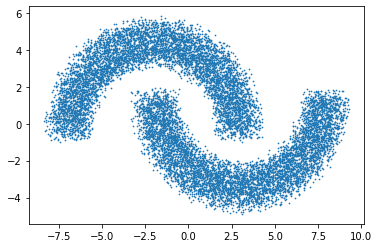

In [ ]:
moons = generate_moons(width=1.0)
moons_dl = InMemDataLoader([moons], batch_size=2048, shuffle=True)
moons_dl.to(device)
plt.scatter(moons[:, 0], moons[:, 1], s=0.5)

In [ ]:
def get_grid(data):
    """Generate a dataset of points that lie on grid and span the given data range."""

    xmin, xmax = np.floor(data.min(0)), np.ceil(data.max(0))
    xg, yg = np.meshgrid(
        np.arange(xmin[0], xmax[0] + 1, 1), np.arange(xmin[1], xmax[1] + 1, 1)
    )
    mxg = np.hstack(
        (
            np.hstack((xg, np.zeros((xg.shape[0], 1)) + np.nan)).ravel(),
            np.hstack((xg.T, np.zeros((xg.shape[1], 1)) + np.nan)).ravel(),
        )
    )
    myg = np.hstack(
        (
            np.hstack((yg, np.zeros((yg.shape[0], 1)) + np.nan)).ravel(),
            np.hstack((yg.T, np.zeros((yg.shape[1], 1)) + np.nan)).ravel(),
        )
    )
    grid = np.vstack((mxg, myg)).T
    return grid

## VAE

In [ ]:
class VAE(nn.Module):
    def __init__(self, in_dim=2, hid_dim=128, z_dim=2):
        super(VAE, self).__init__()
        self.in_dim = in_dim
        self.hid_dim = hid_dim
        self.z_dim = z_dim

        self.encoder = nn.Sequential(
            nn.Linear(in_dim, hid_dim),
            nn.ReLU(),
            nn.Linear(hid_dim, hid_dim),
            nn.ReLU(),
            nn.Linear(hid_dim, 2 * z_dim),
        )

        self.decoder = nn.Sequential(
            nn.Linear(z_dim, hid_dim),
            nn.ReLU(),
            nn.Linear(hid_dim, hid_dim),
            nn.ReLU(),
            nn.Linear(hid_dim, in_dim),
        )

        self.x_log_var = torch.nn.Parameter(torch.zeros(in_dim))

    def forward(self, x):
        sampled_z, z_mu, z_log_var = self.encode(x)
        x_mu, x_log_var = self.decode(sampled_z)
        return x_mu, x_log_var, z_mu, z_log_var

    def encode(self, x):
        # Implement encoding procedure.
        # First, get z_mu and z_log_var from the encoder.
        # Second, compute z samples using the reparametrization trick.
        # TODO
        z_mu_log_var = self.encoder(x)
        z_mu, z_log_var = torch.chunk(z_mu_log_var, 2, dim=1)

        scale = torch.exp(0.5*z_log_var)
        eps = torch.normal(0, 1, size=z_mu.shape).to(device)
        # eps = torch.rand_like(scale)
        sampled_z = z_mu + eps * scale

        return sampled_z, z_mu, z_log_var

    def decode(self, sampled_z):
        x_mu = self.decoder(sampled_z)
        return x_mu, self.x_log_var

In [ ]:
def gaussian_negative_log_likelihood(x, mu, log_var):
    """Compute N(x; mu=mu, sigma^2=exp(log_var)^2)."""

    dist = torch.distributions.Normal(loc=mu.ravel(), scale=log_var.exp().sqrt().ravel().repeat(x.shape[0]))
    return dist.log_prob(x.ravel()).reshape(mu.shape).sum(axis=1)


    # dist = torch.distributions.Normal(mu, log_var.exp().repeat(x.shape[0],1))
    # return -dist.log_prob(x).sum(axis=1)

    # a = (x - mu) ** 2  
    # log_p = (log_var + a / log_var.exp()).sum(-1)
    # log_p = -0.5 * ( np.log(2 * np.pi) + log_p )
    # return log_p


def kullback_leibler_divergence_between_two_gaussians(mu1, log_var1, mu2, log_var2):
    return (
        log_var2 - log_var1 + (log_var1.exp() + (mu1 - mu2) ** 2) / (log_var2.exp()) - 1
    ) / 2


def kullback_leibler_divergence_between_standard_and_normal(mu, log_var):     
    return (log_var.exp() + mu ** 2 - 1 -log_var) / 2


def reconstruction_loss(predicted_x_mu, predicted_x_log_var, real_x):
    """Return the negtive log-likelihood reconstruction loss:
        1/N \sum_i=1^N -\log N(x_i ; predicted_x_mu, I * exp(predicted_x_log_var)^2)
    """
    return -gaussian_negative_log_likelihood(real_x, predicted_x_mu, predicted_x_log_var).mean()
    # return gaussian_negative_log_likelihood(real_x, predicted_x_mu, predicted_x_log_var).sum()


def kl_loss(z_mu, z_log_var):
    """Compute Kullback–Leibler divergence between N(z_mu, exp(z_log_var)^2) and N(0,1).

    """
    # return kullback_leibler_divergence_between_two_gaussians(z_mu, z_log_var, torch.zeros_like(z_mu), torch.ones_like(z_log_var)).mean()
    # return kullback_leibler_divergence_between_two_gaussians(z_mu, z_log_var, torch.zeros_like(z_mu), torch.ones_like(z_log_var)).max()
    return torch.mean(torch.sum(kullback_leibler_divergence_between_standard_and_normal(z_mu, z_log_var),
                                dim = 1))
    # return kullback_leibler_divergence_between_two_gaussians(z_mu, z_log_var, torch.zeros_like(z_mu), torch.ones_like(z_log_var)).sum()
    # return torch.mean(torch.sum(kullback_leibler_divergence_between_two_gaussians(z_mu, z_log_var, torch.zeros_like(z_mu), torch.ones_like(z_log_var)),
    #                             dim = 1))

In [ ]:
hid_dim = 64
z_dim = 2
lr = 0.0003

vae = VAE(hid_dim=hid_dim, z_dim=z_dim).to(device)
optimizer = optim.Adam(vae.parameters(), lr=lr)

Epoch: 0 loss: 15.1570 recon_loss: 15.0003 kl_loss: 0.1567 avg mean: 0.0716 avg std: 0.9479


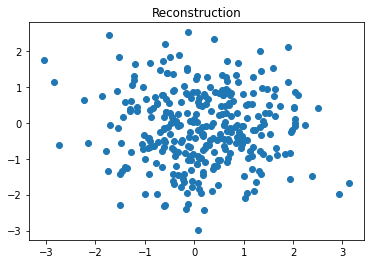

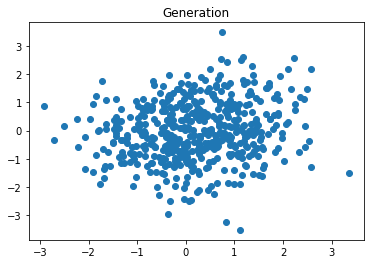

Epoch: 200 loss: 5.0056 recon_loss: 2.8081 kl_loss: 2.1975 avg mean: -0.0138 avg std: 0.3507


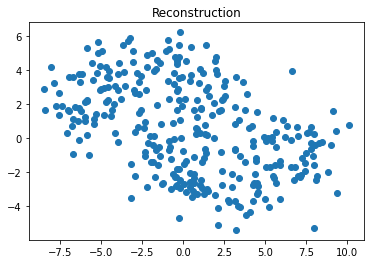

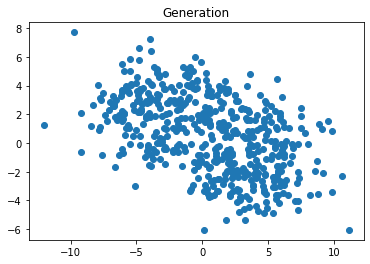

Epoch: 400 loss: 4.9300 recon_loss: 2.7262 kl_loss: 2.2037 avg mean: 0.0242 avg std: 0.3483


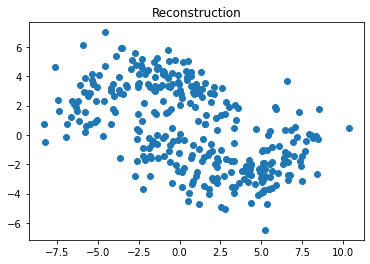

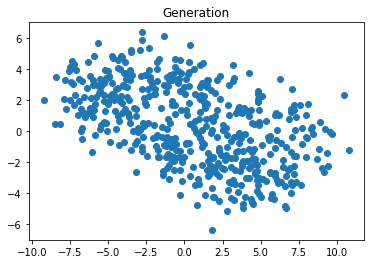

Epoch: 600 loss: 4.8984 recon_loss: 2.6224 kl_loss: 2.2760 avg mean: -0.0537 avg std: 0.3437


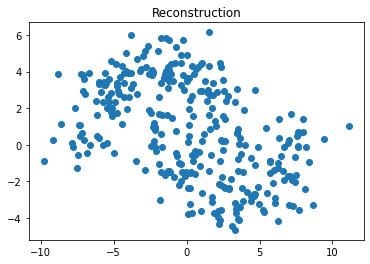

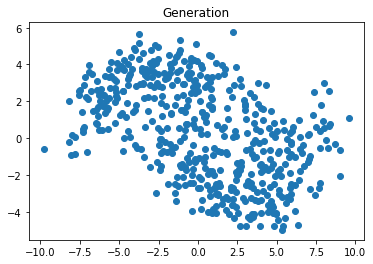

Epoch: 800 loss: 4.8690 recon_loss: 2.4944 kl_loss: 2.3746 avg mean: 0.0032 avg std: 0.3285


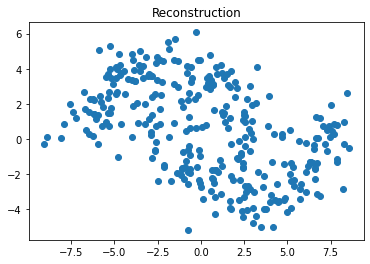

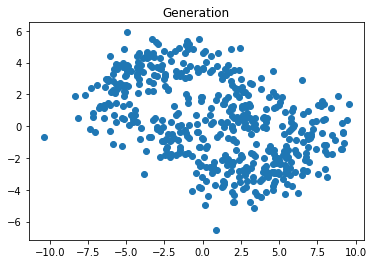

Epoch: 1000 loss: 4.8343 recon_loss: 2.2698 kl_loss: 2.5645 avg mean: -0.0062 avg std: 0.2960


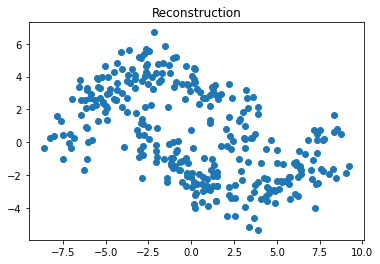

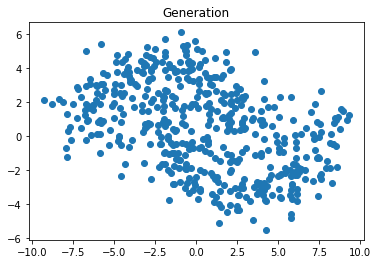

Epoch: 1200 loss: 4.8007 recon_loss: 2.0207 kl_loss: 2.7799 avg mean: -0.0530 avg std: 0.2786


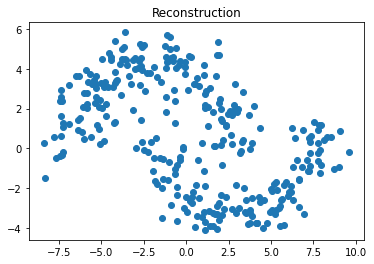

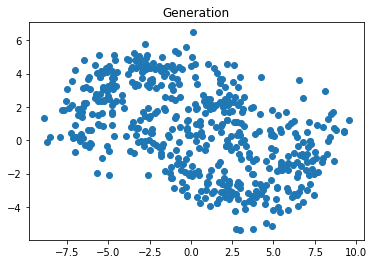

Epoch: 1400 loss: 4.7695 recon_loss: 1.7968 kl_loss: 2.9727 avg mean: -0.0184 avg std: 0.2436


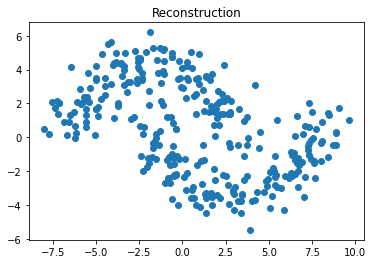

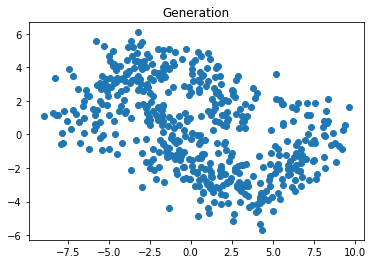

Epoch: 1600 loss: 4.7522 recon_loss: 1.5558 kl_loss: 3.1963 avg mean: -0.0276 avg std: 0.2149


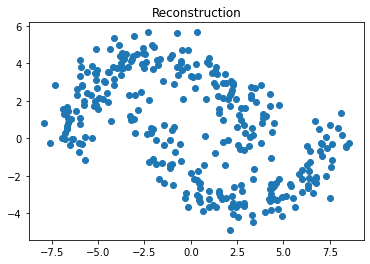

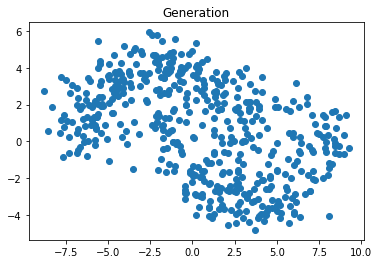

Epoch: 1800 loss: 4.7128 recon_loss: 1.2868 kl_loss: 3.4260 avg mean: 0.0468 avg std: 0.2033


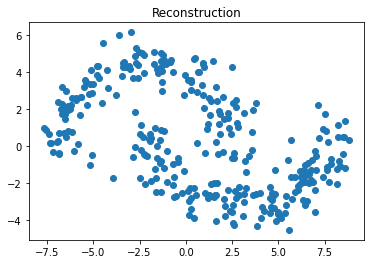

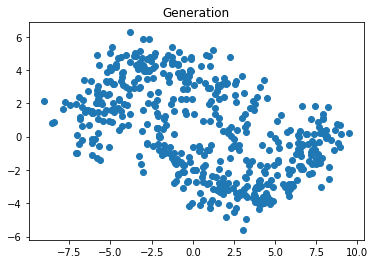

Epoch: 2000 loss: 4.6947 recon_loss: 1.1066 kl_loss: 3.5882 avg mean: -0.0123 avg std: 0.1839


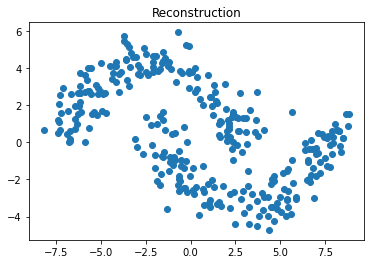

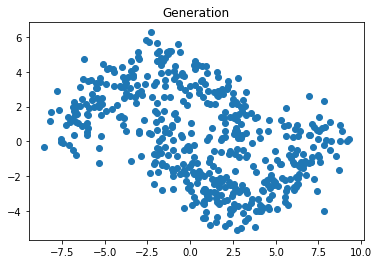

Epoch: 2200 loss: 4.6868 recon_loss: 0.8530 kl_loss: 3.8339 avg mean: 0.0075 avg std: 0.1630


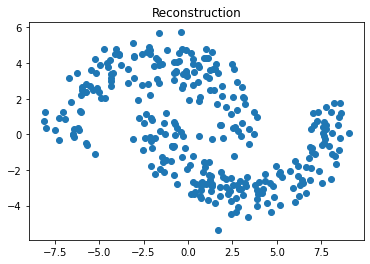

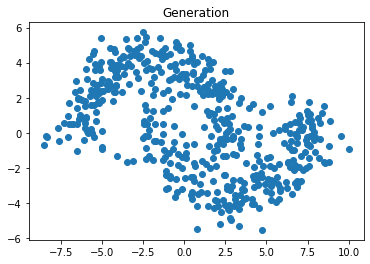

Epoch: 2400 loss: 4.6591 recon_loss: 0.7111 kl_loss: 3.9480 avg mean: -0.0681 avg std: 0.1619


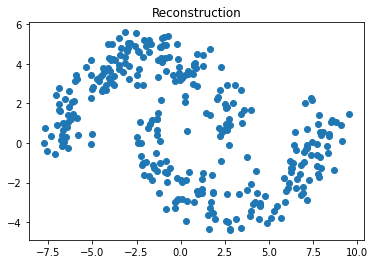

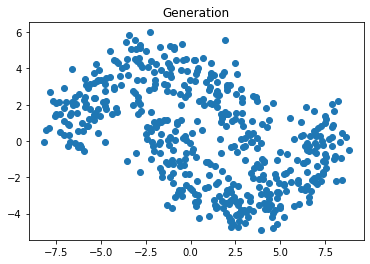

Epoch: 2600 loss: 4.6442 recon_loss: 0.5317 kl_loss: 4.1125 avg mean: 0.0027 avg std: 0.1474


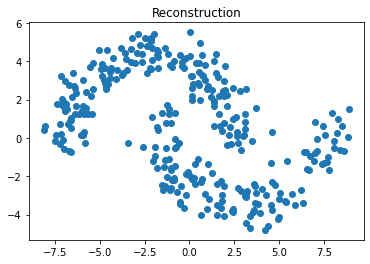

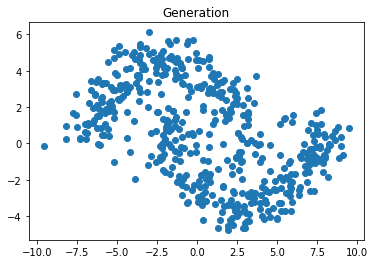

Epoch: 2800 loss: 4.6422 recon_loss: 0.3948 kl_loss: 4.2474 avg mean: -0.0115 avg std: 0.1401


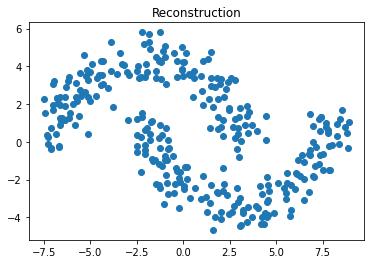

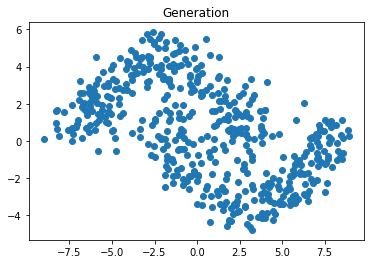

Epoch: 3000 loss: 4.6436 recon_loss: 0.2479 kl_loss: 4.3957 avg mean: -0.0158 avg std: 0.1300


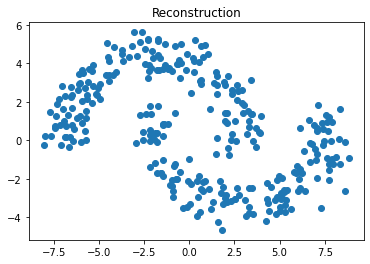

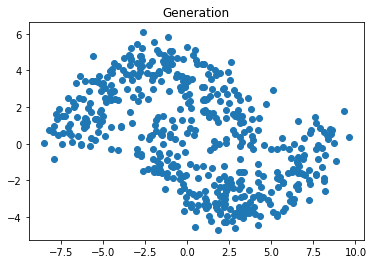

Epoch: 3200 loss: 4.6482 recon_loss: 0.1846 kl_loss: 4.4636 avg mean: 0.0038 avg std: 0.1255


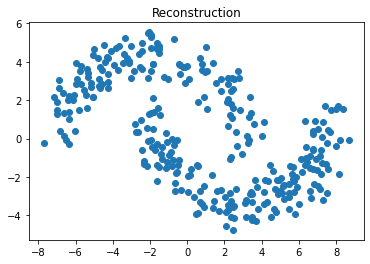

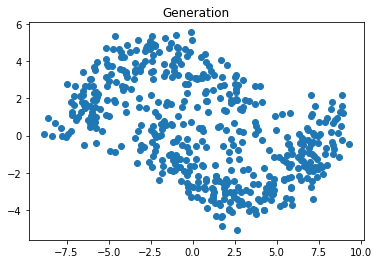

Epoch: 3400 loss: 4.6449 recon_loss: 0.0371 kl_loss: 4.6079 avg mean: 0.0058 avg std: 0.1169


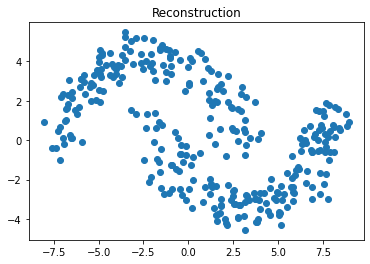

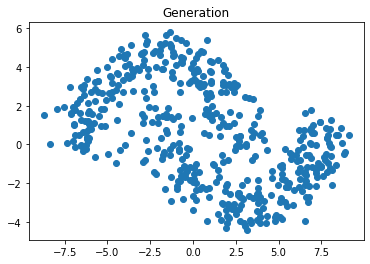

Epoch: 3600 loss: 4.5999 recon_loss: -0.0257 kl_loss: 4.6256 avg mean: -0.0456 avg std: 0.1188


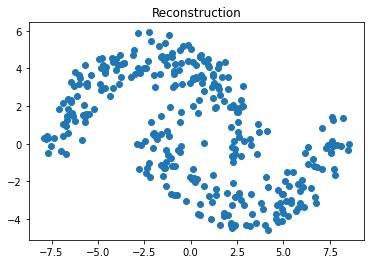

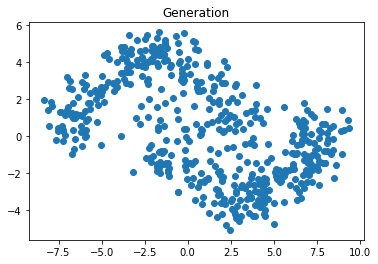

Epoch: 3800 loss: 4.5934 recon_loss: -0.1016 kl_loss: 4.6950 avg mean: 0.0050 avg std: 0.1141


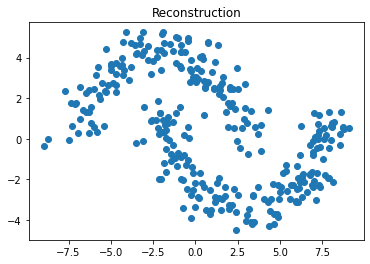

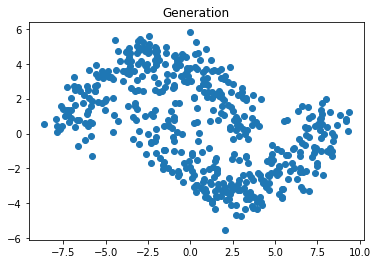

Epoch: 4000 loss: 4.6193 recon_loss: -0.1351 kl_loss: 4.7544 avg mean: -0.0304 avg std: 0.1110


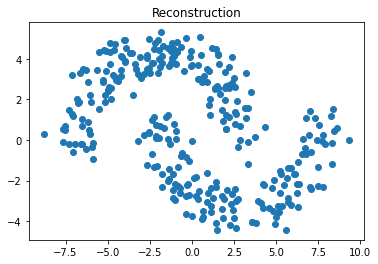

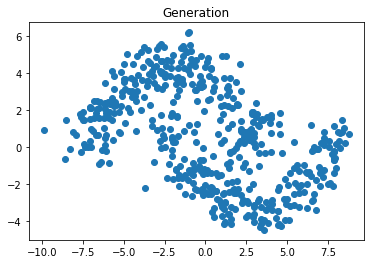

Epoch: 4200 loss: 4.6054 recon_loss: -0.1915 kl_loss: 4.7969 avg mean: 0.0057 avg std: 0.1132


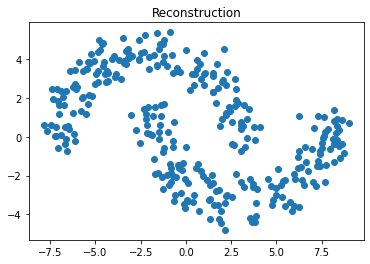

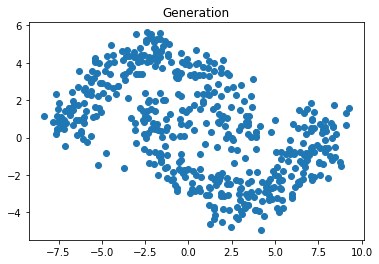

Epoch: 4400 loss: 4.6081 recon_loss: -0.2377 kl_loss: 4.8458 avg mean: 0.0154 avg std: 0.1095


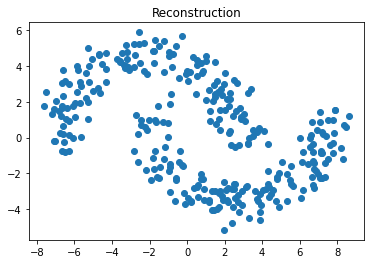

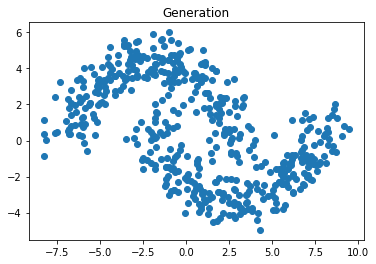

Epoch: 4600 loss: 4.6120 recon_loss: -0.2954 kl_loss: 4.9074 avg mean: -0.0276 avg std: 0.1064


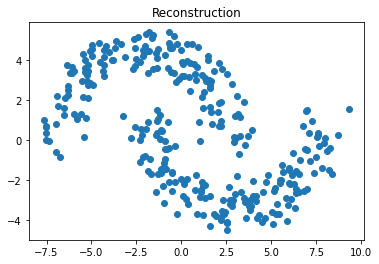

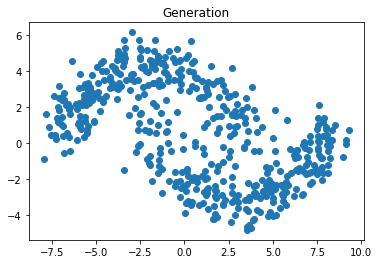

Epoch: 4800 loss: 4.5981 recon_loss: -0.3352 kl_loss: 4.9333 avg mean: 0.0001 avg std: 0.1029


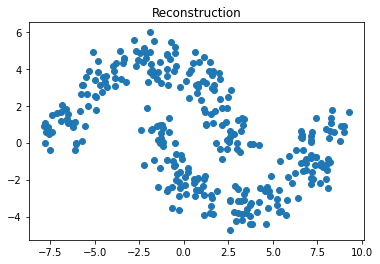

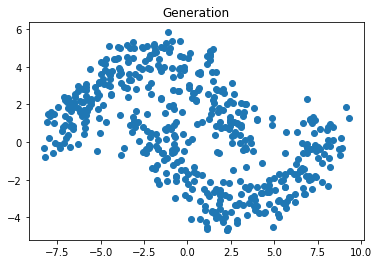

Epoch: 5000 loss: 4.6093 recon_loss: -0.3459 kl_loss: 4.9552 avg mean: -0.0325 avg std: 0.1015


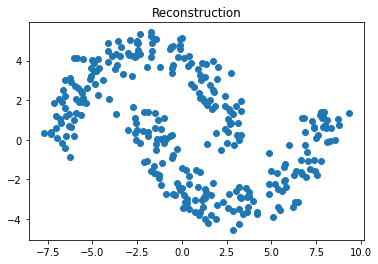

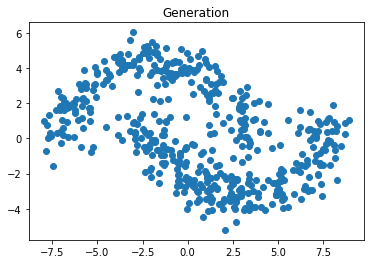

Epoch: 5200 loss: 4.5847 recon_loss: -0.3801 kl_loss: 4.9648 avg mean: 0.0621 avg std: 0.1022


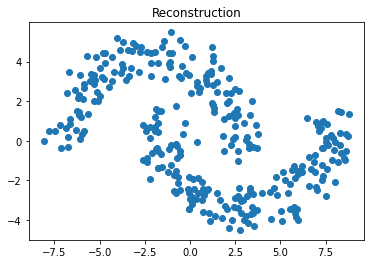

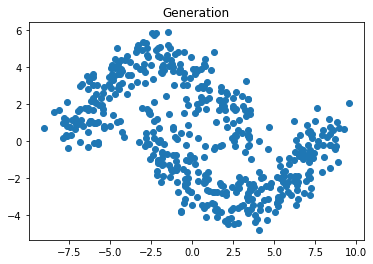

Epoch: 5400 loss: 4.5809 recon_loss: -0.4262 kl_loss: 5.0072 avg mean: -0.0335 avg std: 0.1035


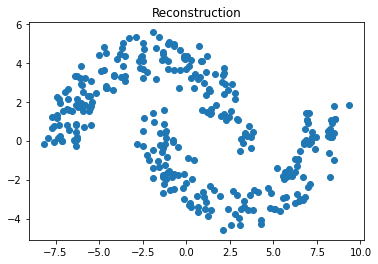

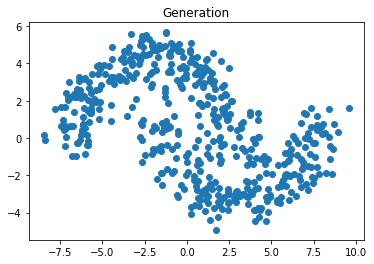

Epoch: 5600 loss: 4.5827 recon_loss: -0.4447 kl_loss: 5.0274 avg mean: 0.0309 avg std: 0.0993


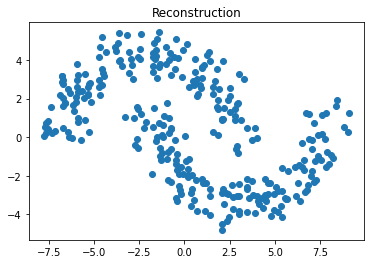

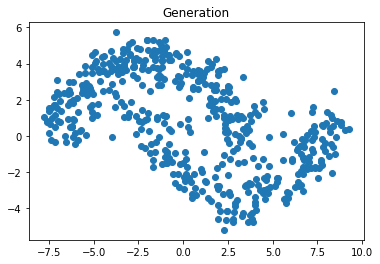

Epoch: 5800 loss: 4.5887 recon_loss: -0.4563 kl_loss: 5.0450 avg mean: 0.0061 avg std: 0.0997


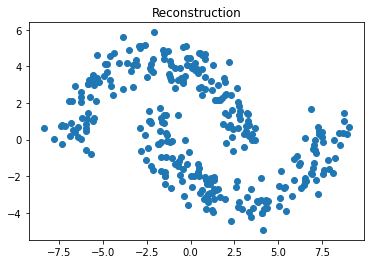

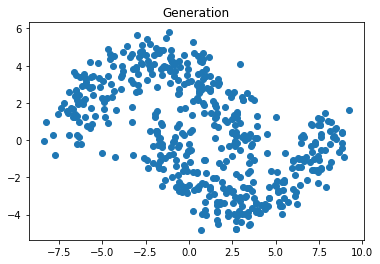

Epoch: 6000 loss: 4.5705 recon_loss: -0.4777 kl_loss: 5.0482 avg mean: 0.0321 avg std: 0.1016


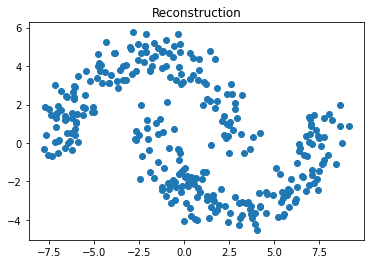

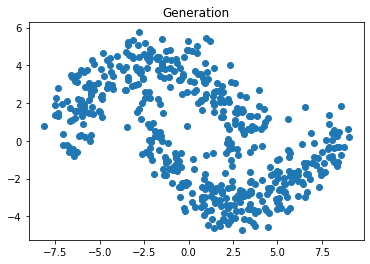

Epoch: 6200 loss: 4.5560 recon_loss: -0.5383 kl_loss: 5.0943 avg mean: -0.0368 avg std: 0.1038


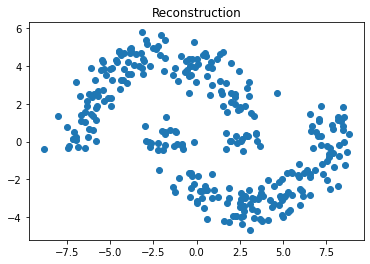

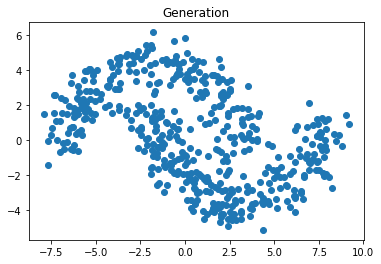

Epoch: 6400 loss: 4.5671 recon_loss: -0.5250 kl_loss: 5.0921 avg mean: -0.0178 avg std: 0.0959


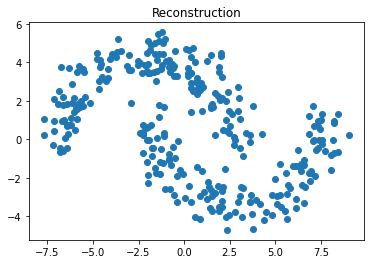

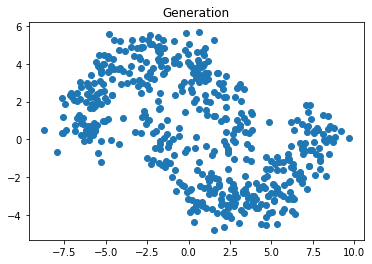

Epoch: 6600 loss: 4.5525 recon_loss: -0.5454 kl_loss: 5.0979 avg mean: -0.0183 avg std: 0.0992


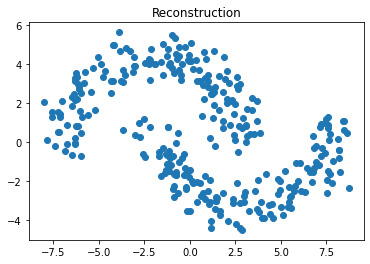

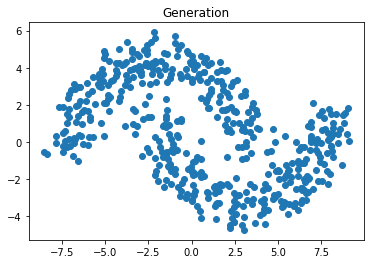

Epoch: 6800 loss: 4.5730 recon_loss: -0.5406 kl_loss: 5.1135 avg mean: -0.0134 avg std: 0.0979


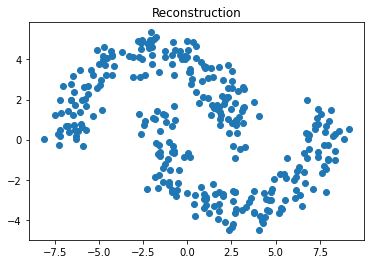

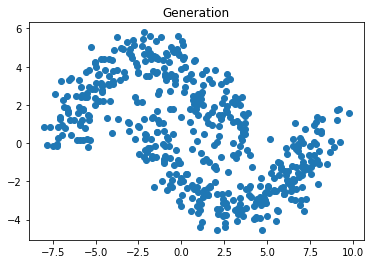

Epoch: 7000 loss: 4.5717 recon_loss: -0.5730 kl_loss: 5.1447 avg mean: -0.0494 avg std: 0.0932


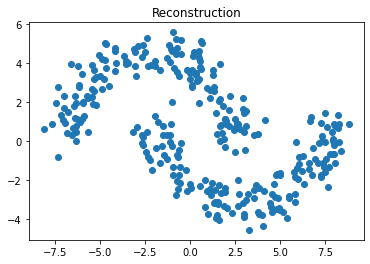

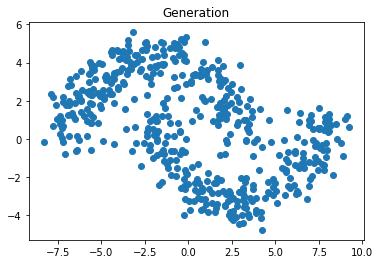

Epoch: 7200 loss: 4.5702 recon_loss: -0.6012 kl_loss: 5.1713 avg mean: -0.0166 avg std: 0.0935


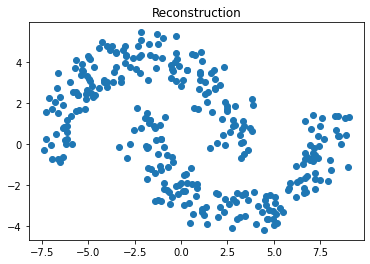

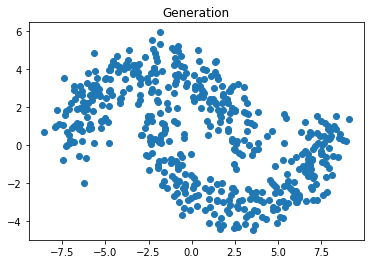

Epoch: 7400 loss: 4.5720 recon_loss: -0.5845 kl_loss: 5.1565 avg mean: 0.0508 avg std: 0.0950


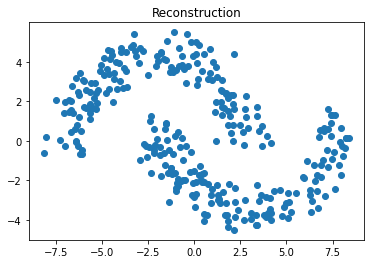

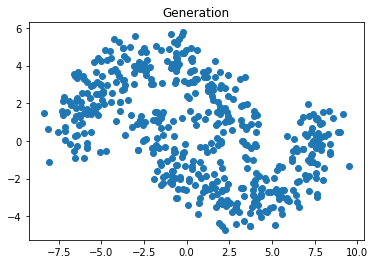

In [ ]:
# Please note: the model should converge faster!
for i in range(7500):
    # print(i)
    recon_loss_acc = 0.0
    kl_acc = 0.0
    vae.train()
    for x, in moons_dl:
        x = x.float().to(device)

        x_mu, x_log_var, z_mu, z_log_var = vae(x)

        optimizer.zero_grad()
        # print(x_mu.shape, x_log_var.shape, z_mu.shape, z_log_var.shape)
        recon_loss = reconstruction_loss(x_mu, x_log_var, x)
        kl = kl_loss(z_mu, z_log_var)
        loss = recon_loss + kl
        loss.backward()
        optimizer.step()

        recon_loss_acc += recon_loss.item() * len(x)
        kl_acc += kl.item() * len(x)

    if i % 200 == 0:
        print(
            f"Epoch: {i} loss: {(recon_loss_acc + kl_acc) / len(moons) :.4f} recon_loss: {recon_loss_acc / len(moons) :.4f} kl_loss: {kl_acc / len(moons) :.4f} avg mean: {z_mu.detach().mean() :.4f} avg std: {torch.exp(z_log_var.detach() / 2).mean() :.4f}"
        )
        vae.eval()
        with torch.no_grad():
            # Reconstruct data
            x_recon = torch.randn(x.shape).to(device) * torch.exp(x_log_var / 2) + x_mu
            x_recon = x_recon.cpu()

            plt.scatter(x_recon[:, 0], x_recon[:, 1])
            plt.title("Reconstruction")
            plt.show()

            # Generate new data
            z = torch.randn(500, z_dim).to(device)
            x_gen_mu, x_gen_log_var = vae.decode(z)
            x_gen = (
                torch.randn(z.shape[0], 2).to(device) * torch.exp(x_gen_log_var / 2)
                + x_gen_mu
            )
            x_gen = x_gen.cpu()

            plt.scatter(x_gen[:, 0], x_gen[:, 1])
            plt.title("Generation")
            plt.show()

Text(0.5, 1.0, 'Data in latent space')

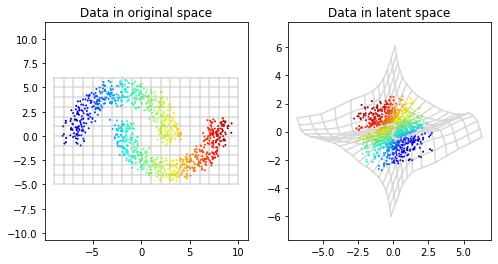

In [ ]:
data = np.array(moons)[np.random.permutation(moons.shape[0])[:1000]]
grid = get_grid(data)

data_colors = (data[:, 0] - min(data[:, 0])) / (max(data[:, 0]) - min(data[:, 0]))
data_colors = plt.cm.jet(data_colors)

plt.figure(figsize=(8, 4))
plt.subplot(1, 2, 1)

plt.plot(grid[:, 0], grid[:, 1], color="gray", alpha=0.3)
plt.scatter(data[:, 0], data[:, 1], color=data_colors, s=1.0)
_ = plt.axis("equal")
plt.title("Data in original space")

vae.eval()

plt.subplot(1, 2, 2)

# TODO: compute the latent encoding of the data nd the grid

sampled_z_grid, z_mu_grid, z_log_var_grid = vae.encode(torch.from_numpy(grid).float().to(device))
enc_grid = z_mu_grid.detach().cpu().numpy()
sampled_z_data, z_mu_data, z_log_var_data = vae.encode(torch.from_numpy(data).float().to(device))
enc_data = z_mu_data.detach().cpu().numpy()
# x_mu_grid, x_log_var_grid, z_mu_grid, z_log_var_grid = vae(torch.from_numpy(grid).float().to(device))
# enc_grid = x_mu_grid.detach().cpu().numpy()
# x_mu_data, x_log_var_data, z_mu_data, z_log_var_data = vae(torch.from_numpy(data).float().to(device))
# enc_data = x_mu_data.detach().cpu().numpy()


plt.plot(enc_grid[:, 0], enc_grid[:, 1], color="gray", alpha=0.3)
plt.scatter(enc_data[:, 0], enc_data[:, 1], color=data_colors, s=1.0)
_ = plt.axis("equal")
plt.title("Data in latent space")

Text(0.5, 1.0, 'Generated data in original space')

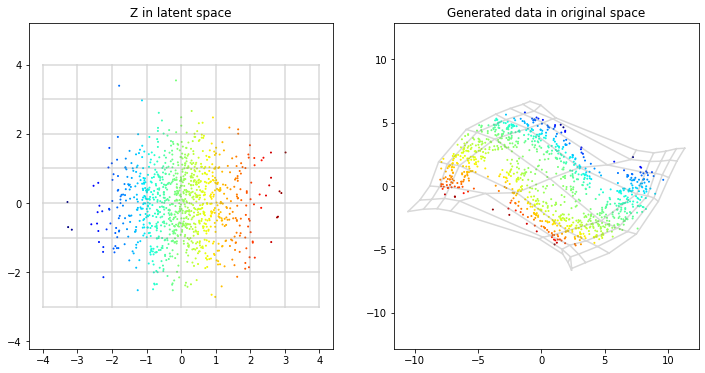

In [ ]:
latent_samples = torch.randn(1000, z_dim)

latent_colors = (latent_samples[:, 0] - min(latent_samples[:, 0])) / (
    max(latent_samples[:, 0]) - min(latent_samples[:, 0])
)
latent_colors = plt.cm.jet(latent_colors.numpy())

latent_grid = get_grid(latent_samples.numpy())

vae.eval()

# TODO: compute the projection into data space of the latent saples and the grid
mu_x_gen, log_var_x_gen = vae.decode(latent_samples.to(device))
x_gen = mu_x_gen.detach().cpu().numpy()
mu_grid_gen, log_var_grid_gen = vae.decode(torch.from_numpy(latent_grid).float().to(device))
grid_gen = mu_grid_gen.detach().cpu().numpy()

plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(latent_grid[:, 0], latent_grid[:, 1], color="gray", alpha=0.3)
plt.scatter(latent_samples[:, 0], latent_samples[:, 1], color=latent_colors, s=1)
_ = plt.axis("equal")
plt.title("Z in latent space")

plt.subplot(1, 2, 2)

plt.plot(grid_gen[:, 0], grid_gen[:, 1], color="gray", alpha=0.3)
plt.scatter(x_gen[:, 0], x_gen[:, 1], color=latent_colors, s=1)
_ = plt.axis("equal")
plt.title("Generated data in original space")

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  


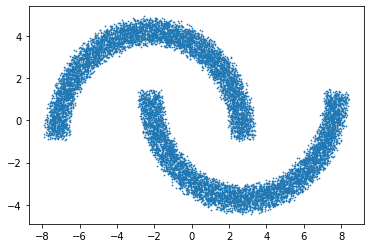

In [ ]:
moons = generate_moons(width=0.5)
moons_dl = InMemDataLoader([moons], batch_size=2048, shuffle=True)
moons_dl.to(device)
plt.scatter(moons[:, 0], moons[:, 1], s=0.5)

In [ ]:
hid_dim = 64
z_dim = 2
lr = 0.0003

vae = VAE(hid_dim=hid_dim, z_dim=z_dim).to(device)
optimizer = optim.Adam(vae.parameters(), lr=lr)

Epoch: 0 loss: 14.8755 recon_loss: 14.7807 kl_loss: 0.0948 avg mean: -0.1373 avg std: 0.9720


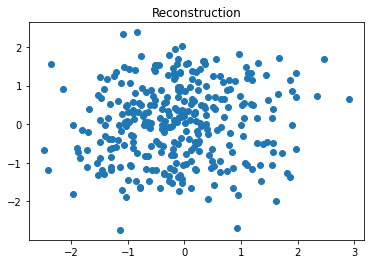

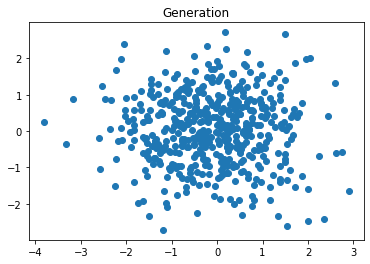

Epoch: 200 loss: 4.8986 recon_loss: 2.7540 kl_loss: 2.1446 avg mean: -0.0192 avg std: 0.3600


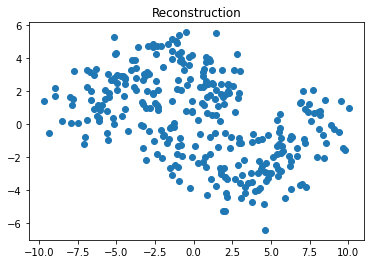

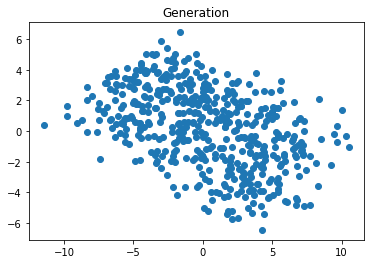

Epoch: 400 loss: 4.7727 recon_loss: 2.5447 kl_loss: 2.2280 avg mean: 0.0628 avg std: 0.3652


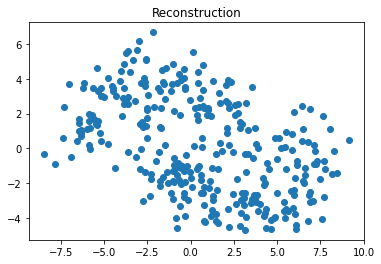

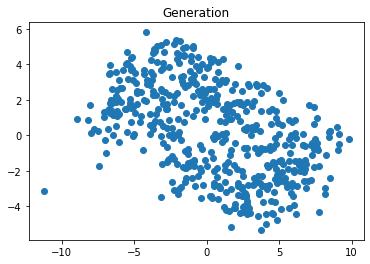

Epoch: 600 loss: 4.6689 recon_loss: 2.3307 kl_loss: 2.3382 avg mean: 0.0083 avg std: 0.3712


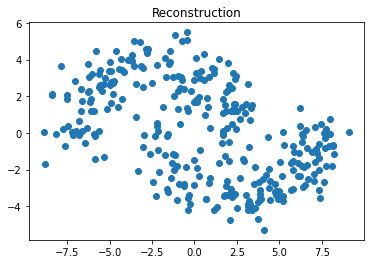

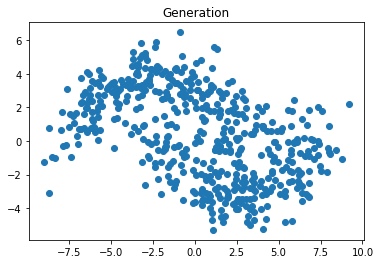

Epoch: 800 loss: 4.5705 recon_loss: 1.9856 kl_loss: 2.5849 avg mean: 0.0450 avg std: 0.3412


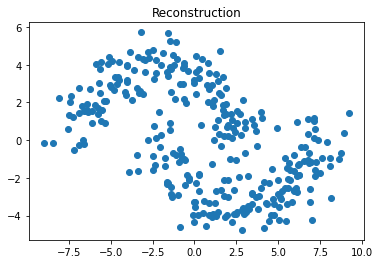

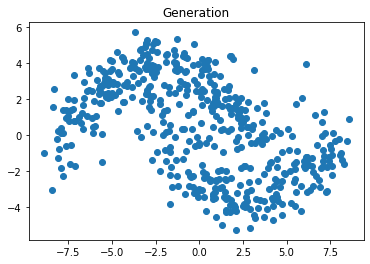

Epoch: 1000 loss: 4.4588 recon_loss: 1.7004 kl_loss: 2.7584 avg mean: -0.0366 avg std: 0.3330


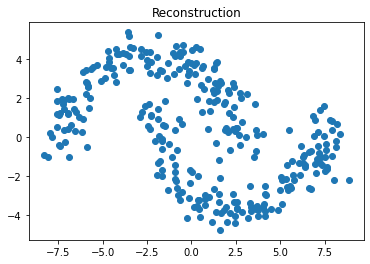

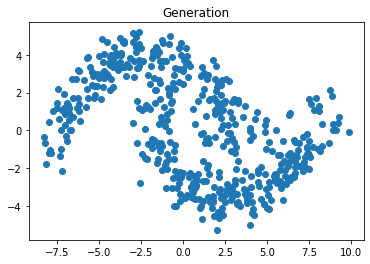

Epoch: 1200 loss: 4.3394 recon_loss: 1.3699 kl_loss: 2.9695 avg mean: -0.0288 avg std: 0.3187


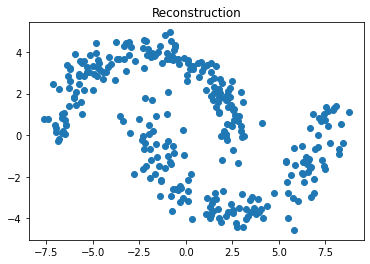

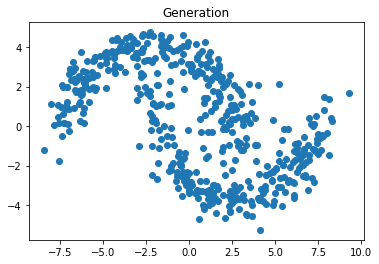

Epoch: 1400 loss: 4.2621 recon_loss: 1.0588 kl_loss: 3.2034 avg mean: 0.0303 avg std: 0.2997


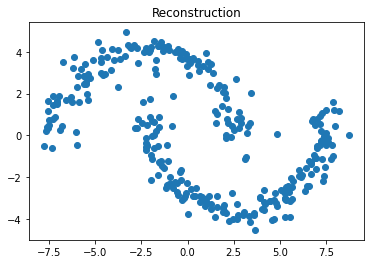

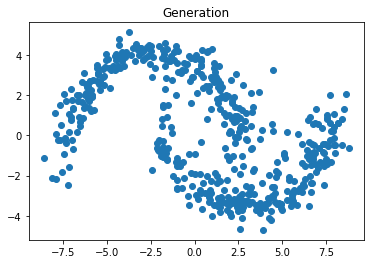

Epoch: 1600 loss: 4.2091 recon_loss: 0.8793 kl_loss: 3.3298 avg mean: -0.0561 avg std: 0.3141


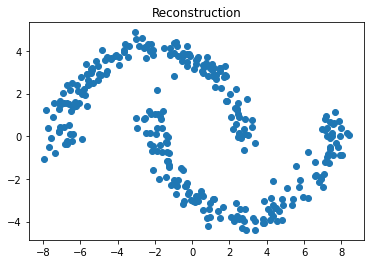

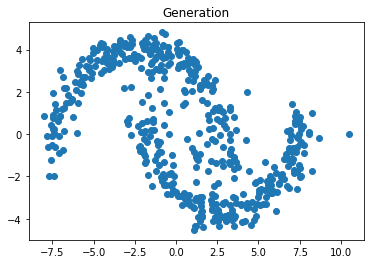

Epoch: 1800 loss: 4.1949 recon_loss: 0.7331 kl_loss: 3.4618 avg mean: 0.0447 avg std: 0.2867


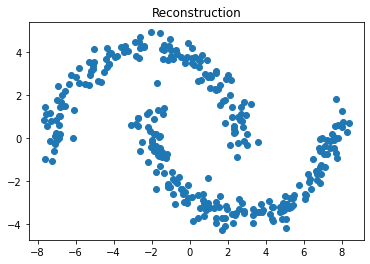

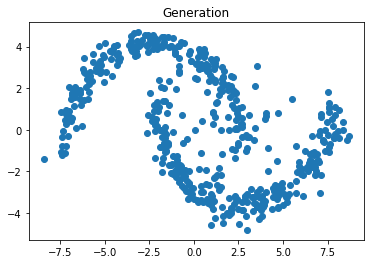

Epoch: 2000 loss: 4.1678 recon_loss: 0.6454 kl_loss: 3.5224 avg mean: 0.0247 avg std: 0.2819


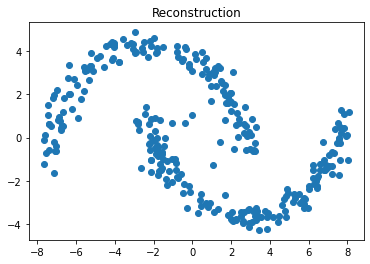

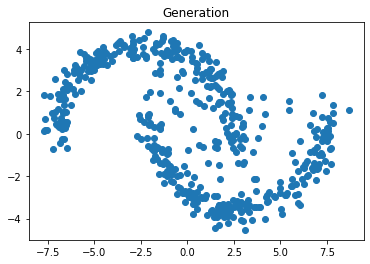

Epoch: 2200 loss: 4.1544 recon_loss: 0.6250 kl_loss: 3.5294 avg mean: -0.0036 avg std: 0.2947


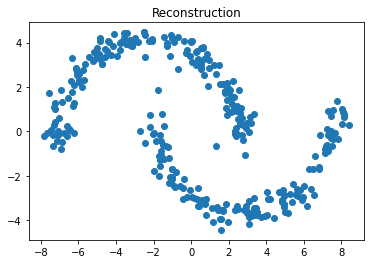

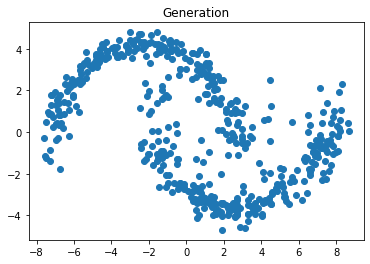

Epoch: 2400 loss: 4.1719 recon_loss: 0.6220 kl_loss: 3.5499 avg mean: 0.0309 avg std: 0.2888


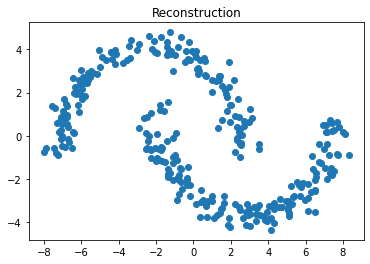

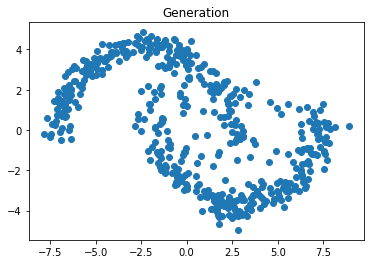

Epoch: 2600 loss: 4.1477 recon_loss: 0.5563 kl_loss: 3.5914 avg mean: 0.0453 avg std: 0.2929


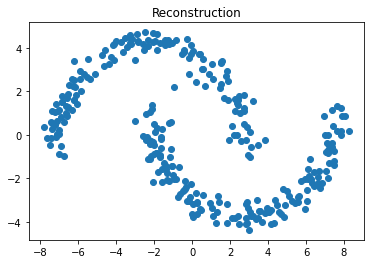

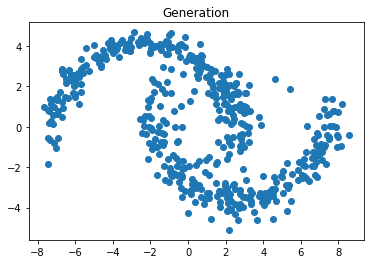

Epoch: 2800 loss: 4.1331 recon_loss: 0.5188 kl_loss: 3.6143 avg mean: 0.0335 avg std: 0.2782


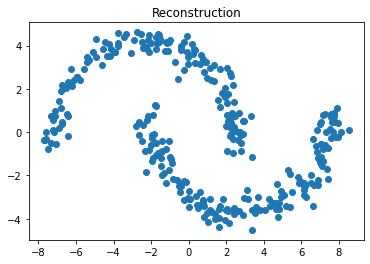

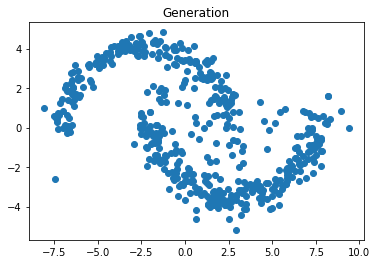

Epoch: 3000 loss: 4.1462 recon_loss: 0.4897 kl_loss: 3.6565 avg mean: 0.0092 avg std: 0.2907


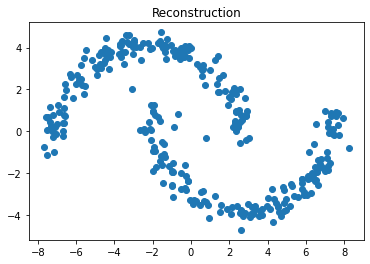

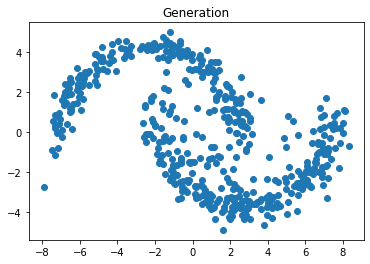

Epoch: 3200 loss: 4.1230 recon_loss: 0.4957 kl_loss: 3.6274 avg mean: 0.0354 avg std: 0.2929


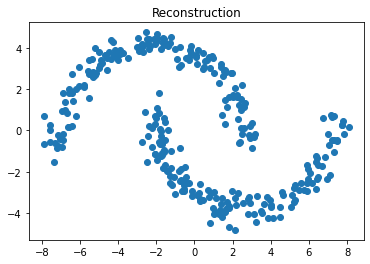

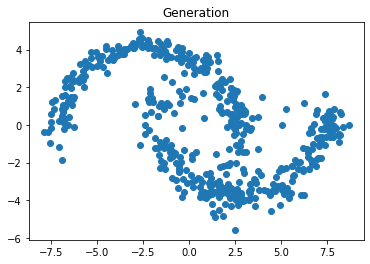

Epoch: 3400 loss: 4.1499 recon_loss: 0.4852 kl_loss: 3.6646 avg mean: 0.0486 avg std: 0.2793


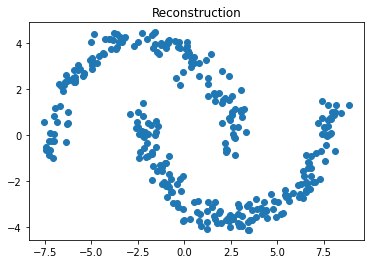

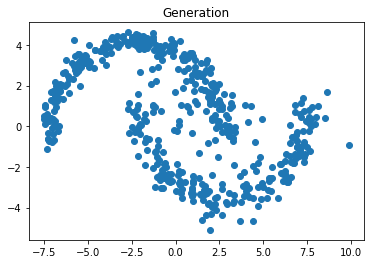

Epoch: 3600 loss: 4.1135 recon_loss: 0.3820 kl_loss: 3.7315 avg mean: 0.0066 avg std: 0.2915


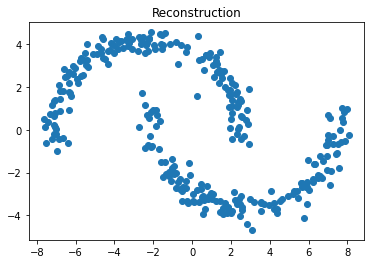

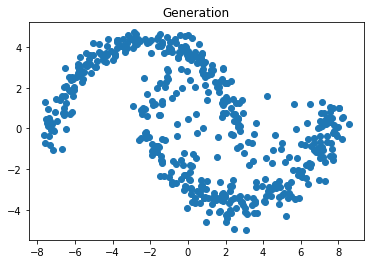

Epoch: 3800 loss: 4.0965 recon_loss: 0.4201 kl_loss: 3.6764 avg mean: 0.0449 avg std: 0.2774


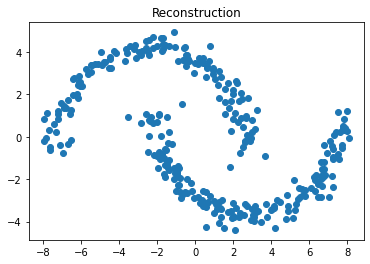

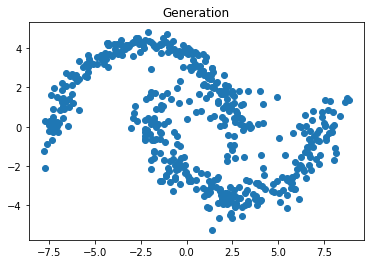

Epoch: 4000 loss: 4.1313 recon_loss: 0.4374 kl_loss: 3.6939 avg mean: -0.0508 avg std: 0.2892


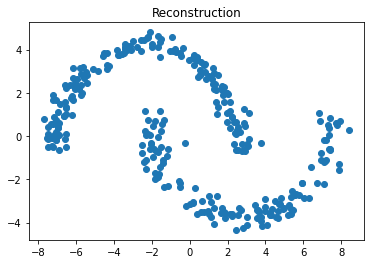

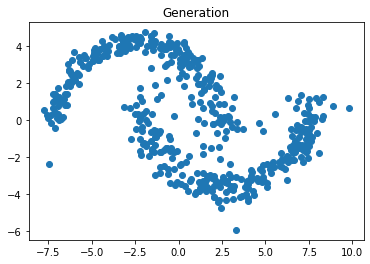

Epoch: 4200 loss: 4.0881 recon_loss: 0.3541 kl_loss: 3.7340 avg mean: -0.0427 avg std: 0.2979


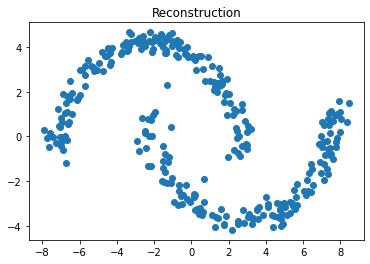

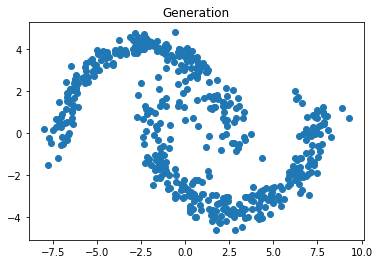

Epoch: 4400 loss: 4.1210 recon_loss: 0.3681 kl_loss: 3.7529 avg mean: -0.0180 avg std: 0.2807


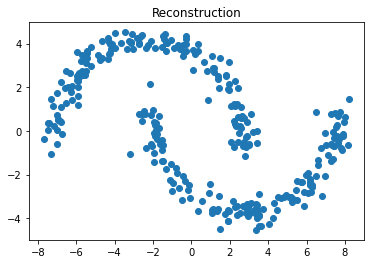

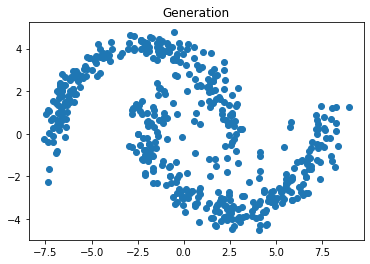

Epoch: 4600 loss: 4.0960 recon_loss: 0.3048 kl_loss: 3.7913 avg mean: 0.0182 avg std: 0.2839


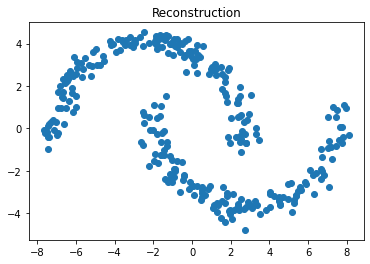

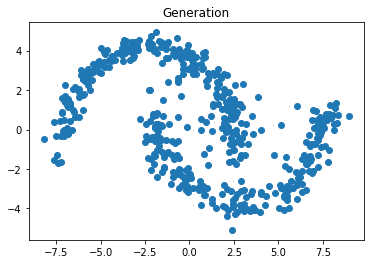

Epoch: 4800 loss: 4.0906 recon_loss: 0.2717 kl_loss: 3.8189 avg mean: 0.0077 avg std: 0.2726


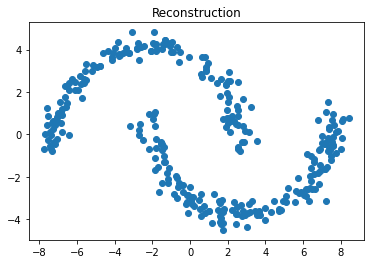

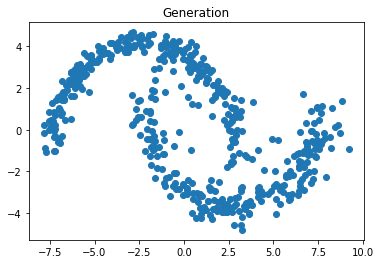

Epoch: 5000 loss: 4.0870 recon_loss: 0.2405 kl_loss: 3.8465 avg mean: 0.0217 avg std: 0.2705


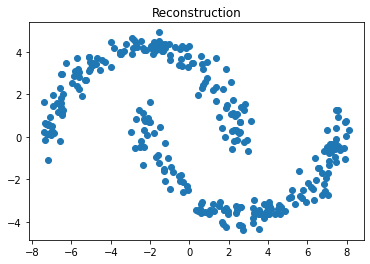

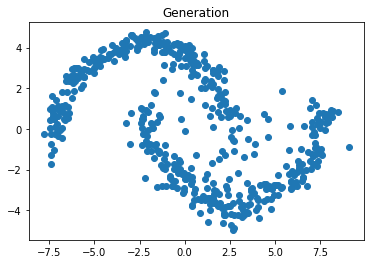

Epoch: 5200 loss: 4.0632 recon_loss: 0.1359 kl_loss: 3.9273 avg mean: 0.0084 avg std: 0.2472


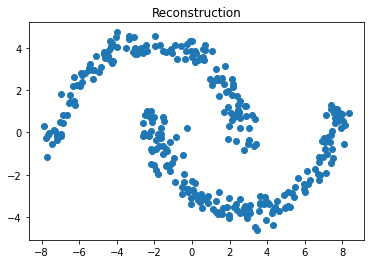

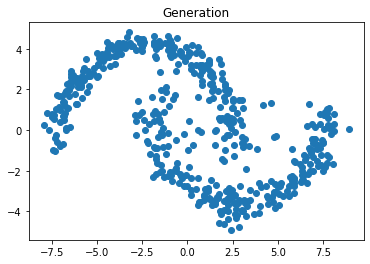

Epoch: 5400 loss: 4.0634 recon_loss: 0.0623 kl_loss: 4.0010 avg mean: -0.0353 avg std: 0.2485


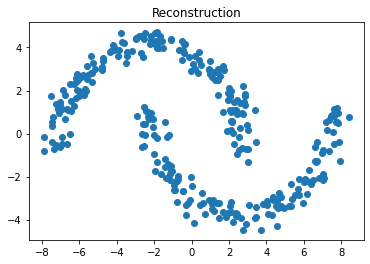

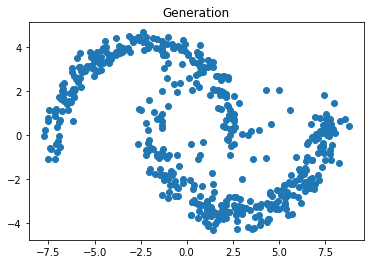

Epoch: 5600 loss: 4.0449 recon_loss: 0.0005 kl_loss: 4.0444 avg mean: 0.0260 avg std: 0.2340


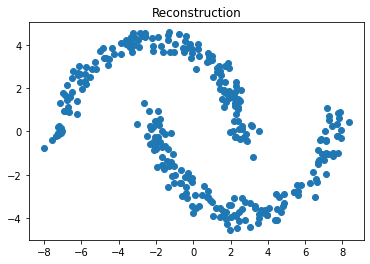

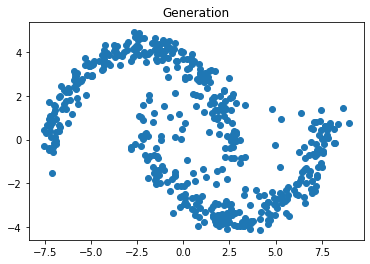

Epoch: 5800 loss: 4.0481 recon_loss: -0.1022 kl_loss: 4.1503 avg mean: -0.0533 avg std: 0.2367


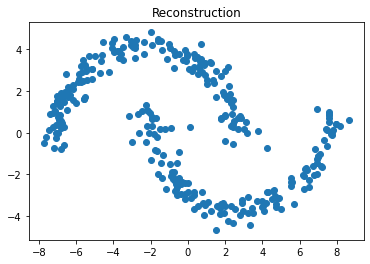

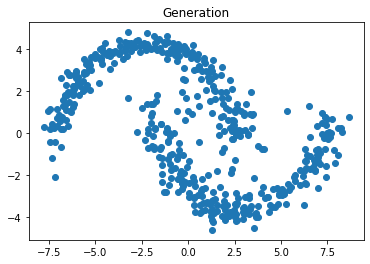

Epoch: 6000 loss: 4.0266 recon_loss: -0.1914 kl_loss: 4.2180 avg mean: 0.0141 avg std: 0.2157


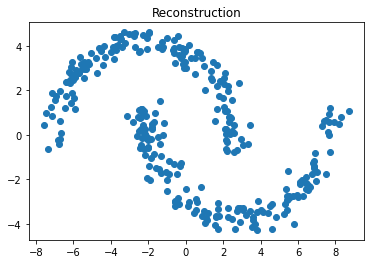

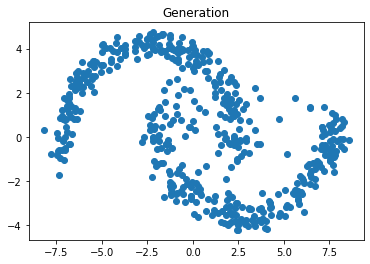

Epoch: 6200 loss: 4.0126 recon_loss: -0.3242 kl_loss: 4.3369 avg mean: -0.0400 avg std: 0.2142


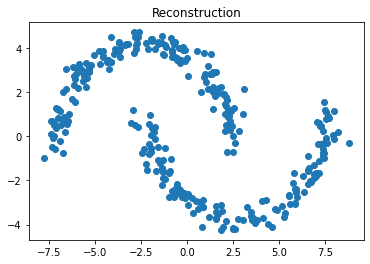

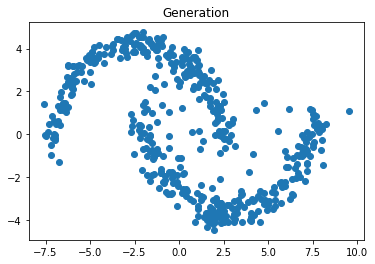

Epoch: 6400 loss: 4.0385 recon_loss: -0.3458 kl_loss: 4.3843 avg mean: 0.0276 avg std: 0.2091


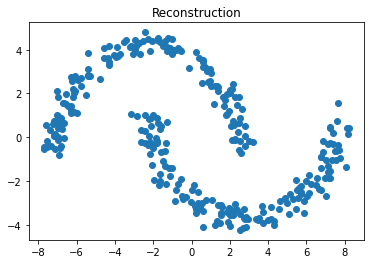

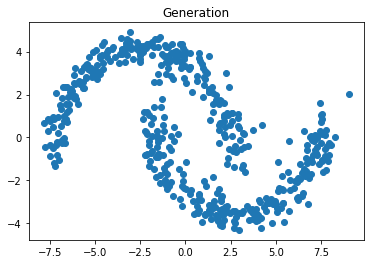

Epoch: 6600 loss: 4.0338 recon_loss: -0.3838 kl_loss: 4.4177 avg mean: 0.0244 avg std: 0.1952


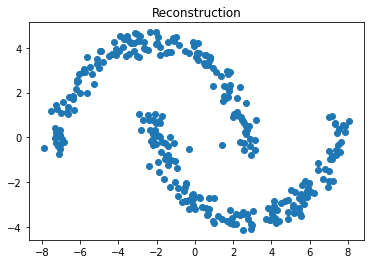

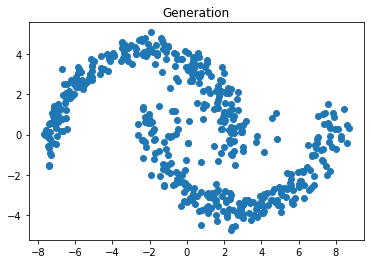

Epoch: 6800 loss: 3.9904 recon_loss: -0.5638 kl_loss: 4.5542 avg mean: -0.0016 avg std: 0.1994


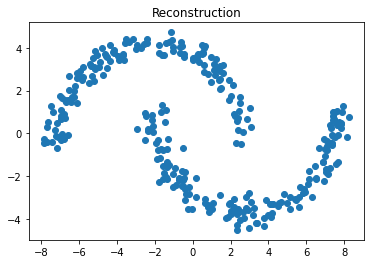

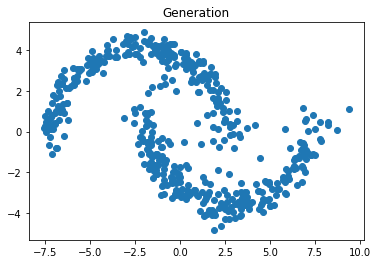

Epoch: 7000 loss: 3.9976 recon_loss: -0.5794 kl_loss: 4.5769 avg mean: 0.0093 avg std: 0.1894


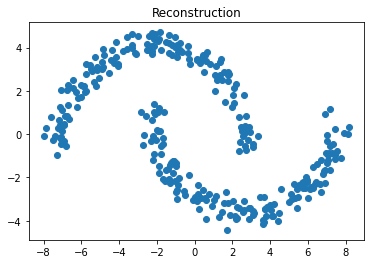

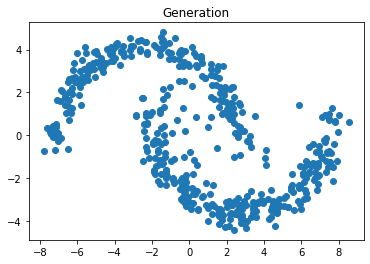

Epoch: 7200 loss: 4.0112 recon_loss: -0.5734 kl_loss: 4.5846 avg mean: 0.0398 avg std: 0.1900


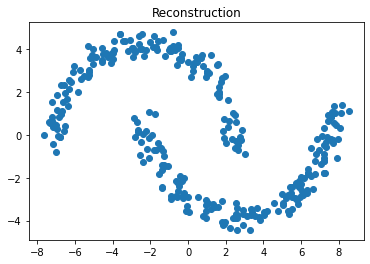

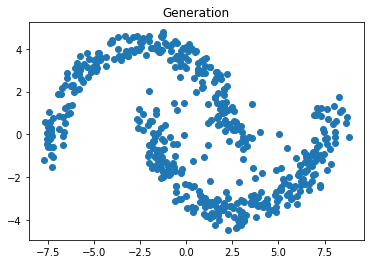

Epoch: 7400 loss: 4.0102 recon_loss: -0.6264 kl_loss: 4.6367 avg mean: 0.0143 avg std: 0.1838


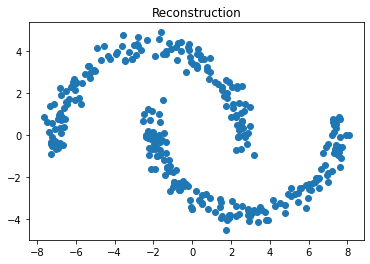

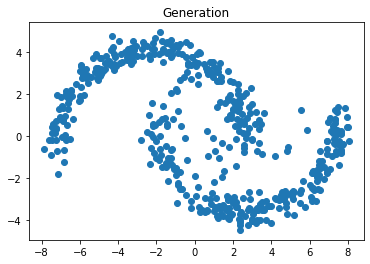

In [ ]:
# Please note: the model should converge faster!
for i in range(7500):
    # print(i)
    recon_loss_acc = 0.0
    kl_acc = 0.0
    vae.train()
    for x, in moons_dl:
        x = x.float().to(device)

        x_mu, x_log_var, z_mu, z_log_var = vae(x)

        optimizer.zero_grad()
        # print(x_mu.shape, x_log_var.shape, z_mu.shape, z_log_var.shape)
        recon_loss = reconstruction_loss(x_mu, x_log_var, x)
        kl = kl_loss(z_mu, z_log_var)
        loss = recon_loss + kl
        loss.backward()
        optimizer.step()

        recon_loss_acc += recon_loss.item() * len(x)
        kl_acc += kl.item() * len(x)

    if i % 200 == 0:
        print(
            f"Epoch: {i} loss: {(recon_loss_acc + kl_acc) / len(moons) :.4f} recon_loss: {recon_loss_acc / len(moons) :.4f} kl_loss: {kl_acc / len(moons) :.4f} avg mean: {z_mu.detach().mean() :.4f} avg std: {torch.exp(z_log_var.detach() / 2).mean() :.4f}"
        )
        vae.eval()
        with torch.no_grad():
            # Reconstruct data
            x_recon = torch.randn(x.shape).to(device) * torch.exp(x_log_var / 2) + x_mu
            x_recon = x_recon.cpu()

            plt.scatter(x_recon[:, 0], x_recon[:, 1])
            plt.title("Reconstruction")
            plt.show()

            # Generate new data
            z = torch.randn(500, z_dim).to(device)
            x_gen_mu, x_gen_log_var = vae.decode(z)
            x_gen = (
                torch.randn(z.shape[0], 2).to(device) * torch.exp(x_gen_log_var / 2)
                + x_gen_mu
            )
            x_gen = x_gen.cpu()

            plt.scatter(x_gen[:, 0], x_gen[:, 1])
            plt.title("Generation")
            plt.show()

Text(0.5, 1.0, 'Data in latent space')

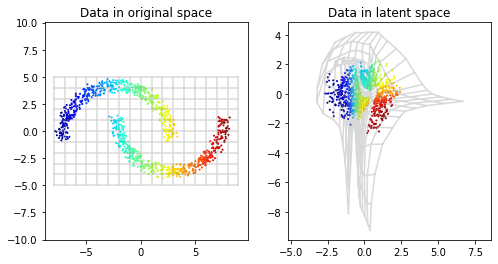

In [ ]:
data = np.array(moons)[np.random.permutation(moons.shape[0])[:1000]]
grid = get_grid(data)

data_colors = (data[:, 0] - min(data[:, 0])) / (max(data[:, 0]) - min(data[:, 0]))
data_colors = plt.cm.jet(data_colors)

plt.figure(figsize=(8, 4))
plt.subplot(1, 2, 1)

plt.plot(grid[:, 0], grid[:, 1], color="gray", alpha=0.3)
plt.scatter(data[:, 0], data[:, 1], color=data_colors, s=1.0)
_ = plt.axis("equal")
plt.title("Data in original space")

vae.eval()

plt.subplot(1, 2, 2)

# TODO: compute the latent encoding of the data nd the grid

sampled_z_grid, z_mu_grid, z_log_var_grid = vae.encode(torch.from_numpy(grid).float().to(device))
enc_grid = z_mu_grid.detach().cpu().numpy()
sampled_z_data, z_mu_data, z_log_var_data = vae.encode(torch.from_numpy(data).float().to(device))
enc_data = z_mu_data.detach().cpu().numpy()

plt.plot(enc_grid[:, 0], enc_grid[:, 1], color="gray", alpha=0.3)
plt.scatter(enc_data[:, 0], enc_data[:, 1], color=data_colors, s=1.0)
_ = plt.axis("equal")
plt.title("Data in latent space")

Text(0.5, 1.0, 'Generated data in original space')

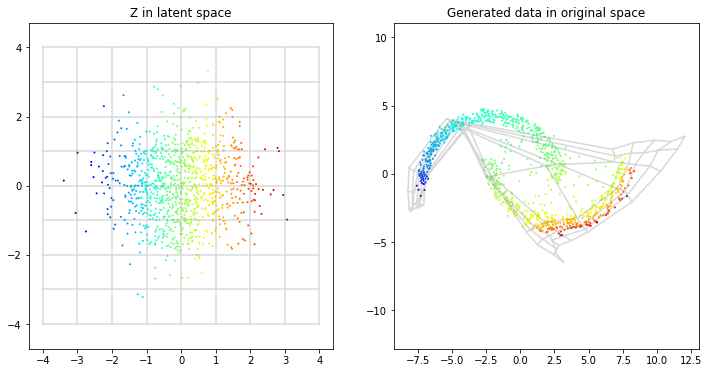

In [ ]:
latent_samples = torch.randn(1000, z_dim)

latent_colors = (latent_samples[:, 0] - min(latent_samples[:, 0])) / (
    max(latent_samples[:, 0]) - min(latent_samples[:, 0])
)
latent_colors = plt.cm.jet(latent_colors.numpy())

latent_grid = get_grid(latent_samples.numpy())

vae.eval()

# TODO: compute the projection into data space of the latent saples and the grid
mu_x_gen, log_var_x_gen = vae.decode(latent_samples.to(device))
x_gen = mu_x_gen.detach().cpu().numpy()
mu_grid_gen, log_var_grid_gen = vae.decode(torch.from_numpy(latent_grid).float().to(device))
grid_gen = mu_grid_gen.detach().cpu().numpy()

plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(latent_grid[:, 0], latent_grid[:, 1], color="gray", alpha=0.3)
plt.scatter(latent_samples[:, 0], latent_samples[:, 1], color=latent_colors, s=1)
_ = plt.axis("equal")
plt.title("Z in latent space")

plt.subplot(1, 2, 2)

plt.plot(grid_gen[:, 0], grid_gen[:, 1], color="gray", alpha=0.3)
plt.scatter(x_gen[:, 0], x_gen[:, 1], color=latent_colors, s=1)
_ = plt.axis("equal")
plt.title("Generated data in original space")

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  


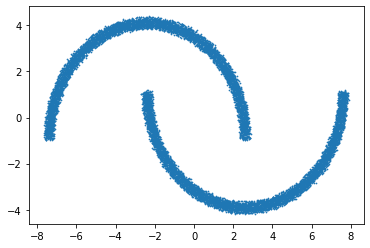

In [ ]:
moons = generate_moons(width=0.2)
moons_dl = InMemDataLoader([moons], batch_size=2048, shuffle=True)
moons_dl.to(device)
plt.scatter(moons[:, 0], moons[:, 1], s=0.5)

In [ ]:
hid_dim = 64
z_dim = 2
lr = 0.0003

vae = VAE(hid_dim=hid_dim, z_dim=z_dim).to(device)
optimizer = optim.Adam(vae.parameters(), lr=lr)

Epoch: 0 loss: 15.1453 recon_loss: 14.8619 kl_loss: 0.2834 avg mean: 0.0879 avg std: 1.1330


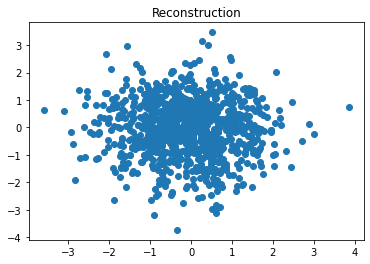

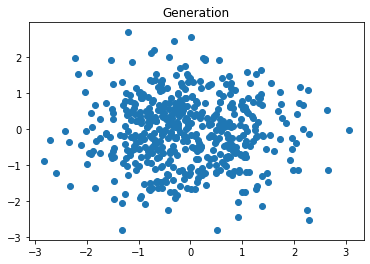

Epoch: 200 loss: 4.8852 recon_loss: 2.7298 kl_loss: 2.1554 avg mean: -0.0084 avg std: 0.3665


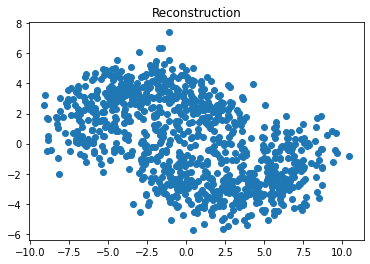

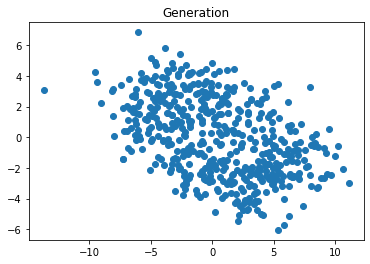

Epoch: 400 loss: 4.7211 recon_loss: 2.5410 kl_loss: 2.1801 avg mean: -0.0117 avg std: 0.4067


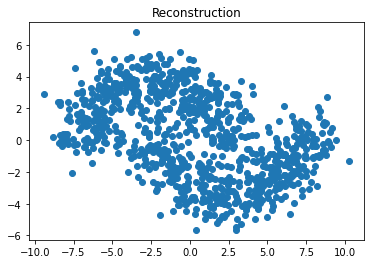

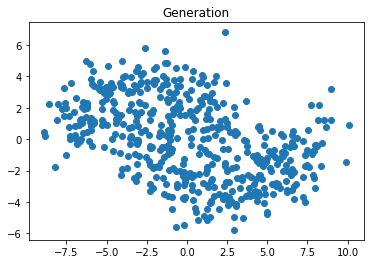

Epoch: 600 loss: 4.5019 recon_loss: 2.1880 kl_loss: 2.3139 avg mean: -0.0049 avg std: 0.4499


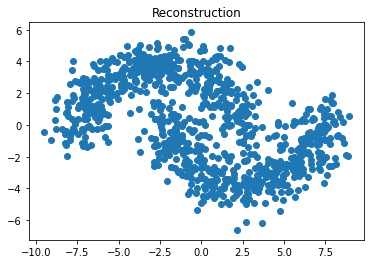

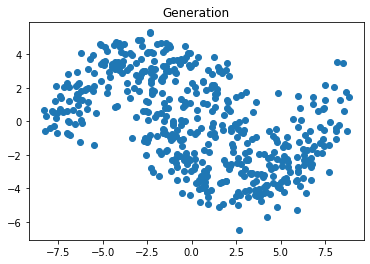

Epoch: 800 loss: 4.3136 recon_loss: 1.7957 kl_loss: 2.5179 avg mean: 0.0214 avg std: 0.4392


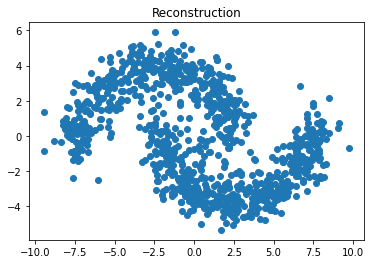

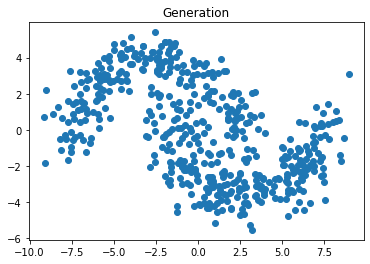

Epoch: 1000 loss: 4.1309 recon_loss: 1.3985 kl_loss: 2.7325 avg mean: 0.0026 avg std: 0.4375


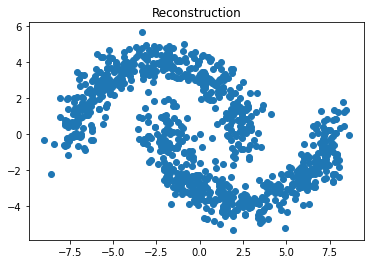

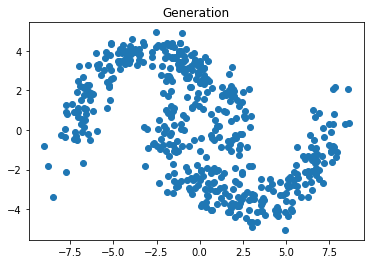

Epoch: 1200 loss: 3.9525 recon_loss: 1.0037 kl_loss: 2.9488 avg mean: 0.0503 avg std: 0.4308


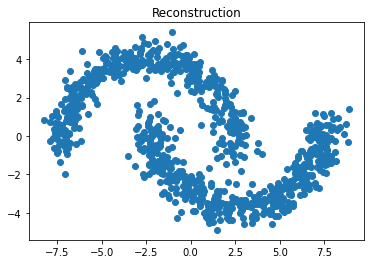

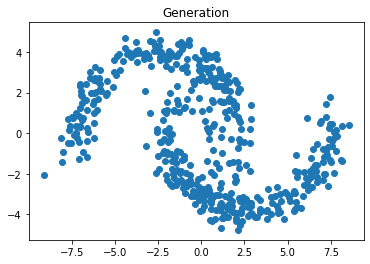

Epoch: 1400 loss: 3.7538 recon_loss: 0.5913 kl_loss: 3.1625 avg mean: -0.0203 avg std: 0.4310


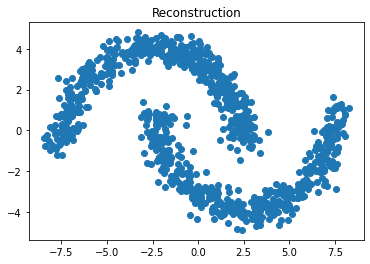

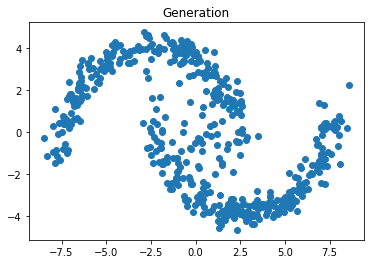

Epoch: 1600 loss: 3.6079 recon_loss: 0.2450 kl_loss: 3.3629 avg mean: 0.0016 avg std: 0.4272


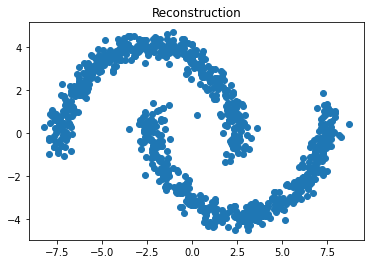

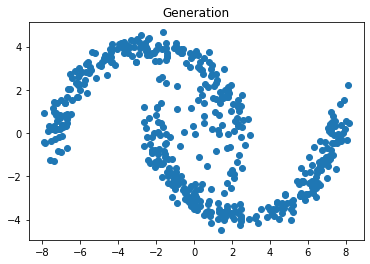

Epoch: 1800 loss: 3.4358 recon_loss: -0.1394 kl_loss: 3.5752 avg mean: -0.0136 avg std: 0.4211


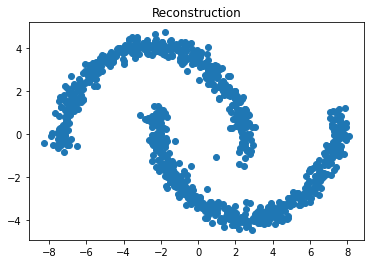

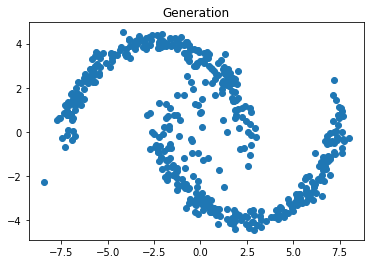

Epoch: 2000 loss: 3.3297 recon_loss: -0.4155 kl_loss: 3.7452 avg mean: 0.0054 avg std: 0.4211


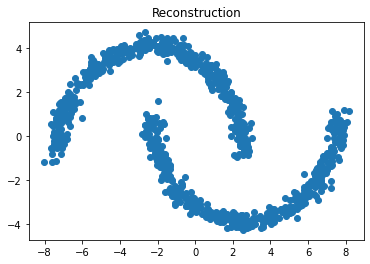

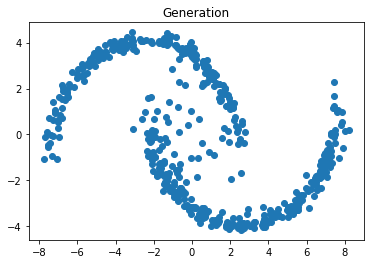

Epoch: 2200 loss: 3.2341 recon_loss: -0.7135 kl_loss: 3.9475 avg mean: -0.0132 avg std: 0.4167


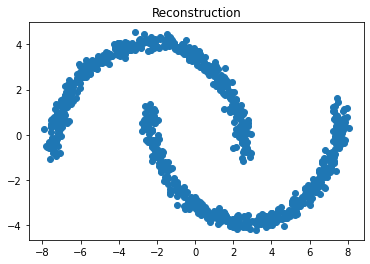

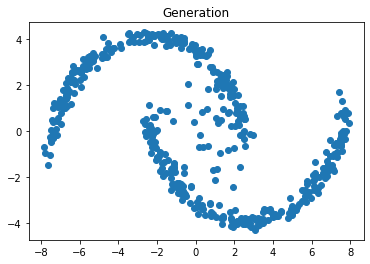

Epoch: 2400 loss: 3.1674 recon_loss: -0.9053 kl_loss: 4.0727 avg mean: 0.0045 avg std: 0.4115


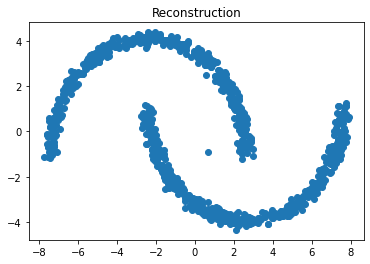

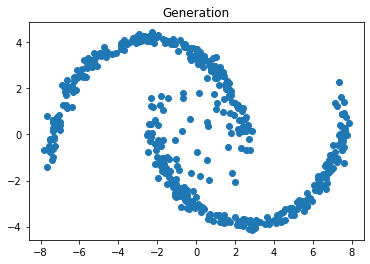

Epoch: 2600 loss: 3.1830 recon_loss: -0.9762 kl_loss: 4.1592 avg mean: -0.0271 avg std: 0.4158


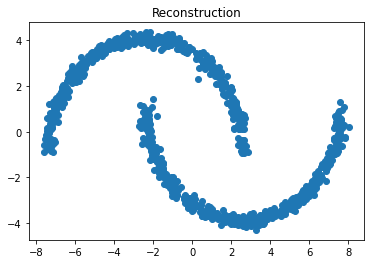

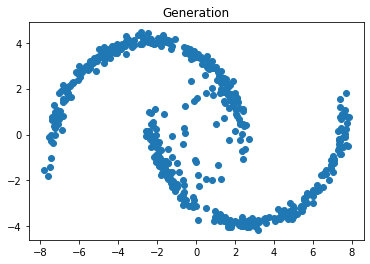

Epoch: 2800 loss: 3.1452 recon_loss: -1.0417 kl_loss: 4.1869 avg mean: -0.0148 avg std: 0.4155


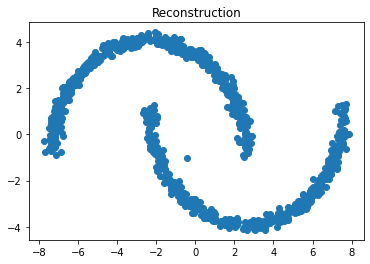

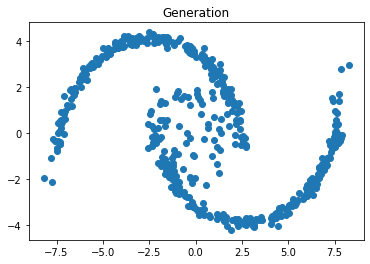

Epoch: 3000 loss: 3.1595 recon_loss: -1.0098 kl_loss: 4.1693 avg mean: -0.0021 avg std: 0.4183


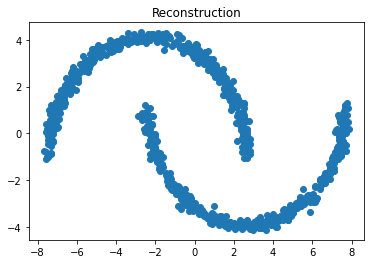

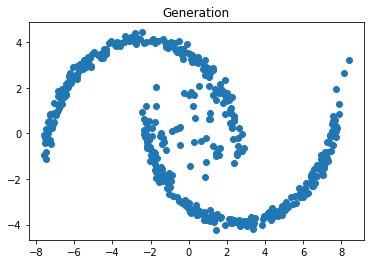

Epoch: 3200 loss: 3.1562 recon_loss: -1.0246 kl_loss: 4.1807 avg mean: 0.0099 avg std: 0.4307


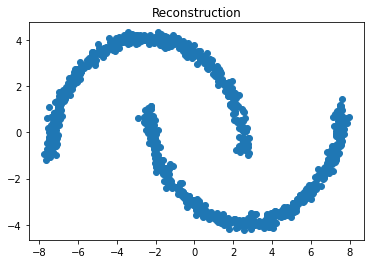

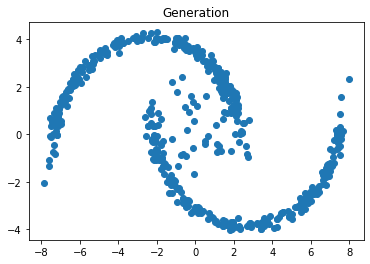

Epoch: 3400 loss: 3.0994 recon_loss: -1.0988 kl_loss: 4.1982 avg mean: -0.0179 avg std: 0.4186


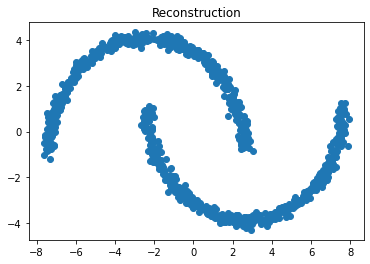

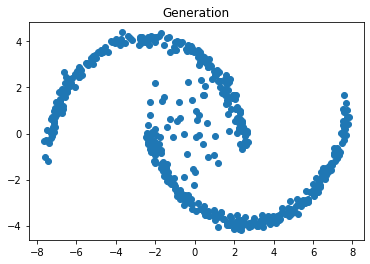

Epoch: 3600 loss: 3.1055 recon_loss: -1.0661 kl_loss: 4.1717 avg mean: 0.0102 avg std: 0.4280


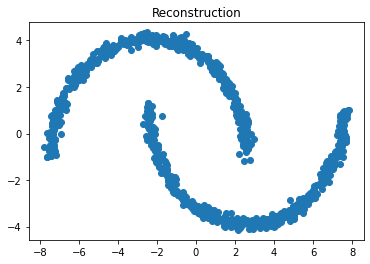

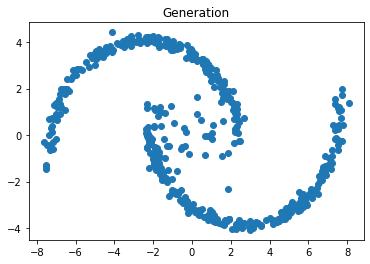

Epoch: 3800 loss: 3.1067 recon_loss: -1.0743 kl_loss: 4.1810 avg mean: 0.0072 avg std: 0.4269


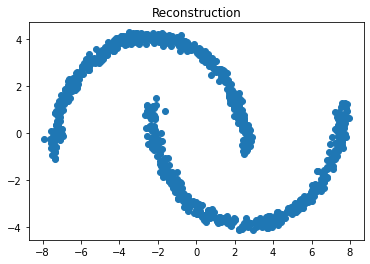

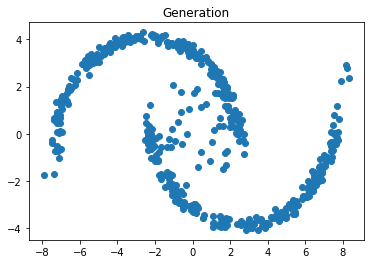

Epoch: 4000 loss: 3.1044 recon_loss: -1.0542 kl_loss: 4.1585 avg mean: 0.0193 avg std: 0.4393


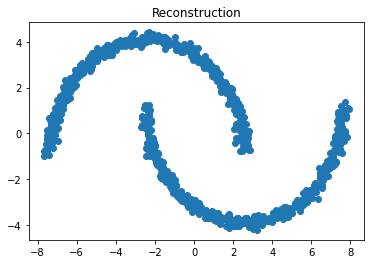

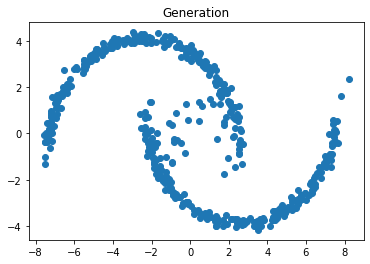

Epoch: 4200 loss: 3.1050 recon_loss: -1.0556 kl_loss: 4.1606 avg mean: -0.0079 avg std: 0.4341


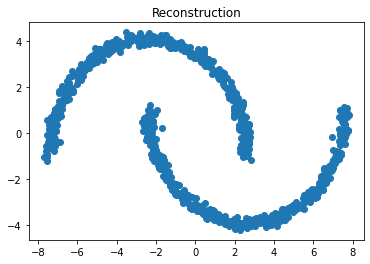

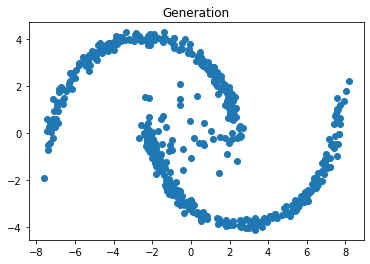

Epoch: 4400 loss: 3.0796 recon_loss: -1.0493 kl_loss: 4.1289 avg mean: -0.0340 avg std: 0.4557


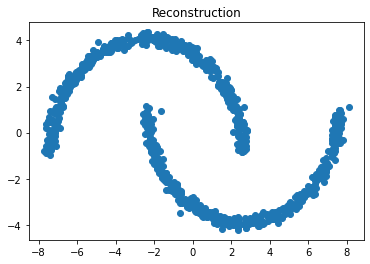

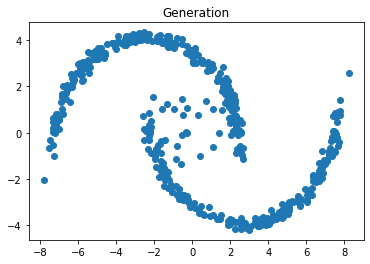

Epoch: 4600 loss: 3.0695 recon_loss: -1.0835 kl_loss: 4.1530 avg mean: -0.0371 avg std: 0.4540


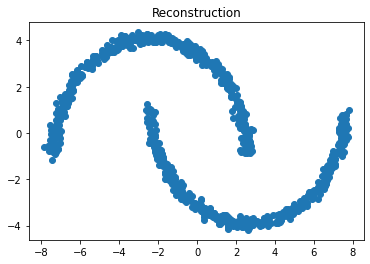

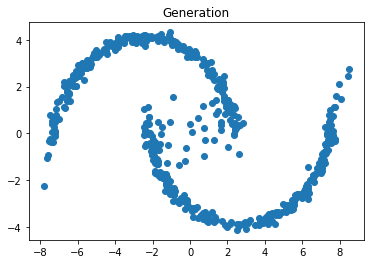

Epoch: 4800 loss: 3.0595 recon_loss: -1.0634 kl_loss: 4.1229 avg mean: -0.0257 avg std: 0.4635


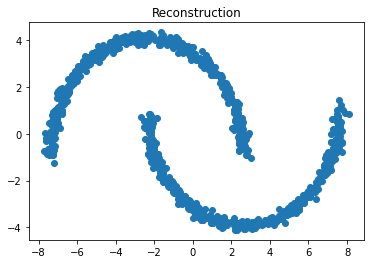

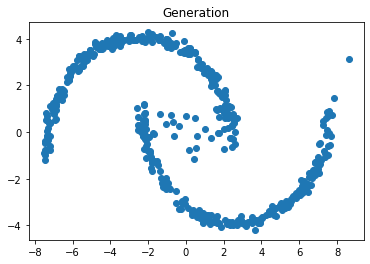

Epoch: 5000 loss: 3.0739 recon_loss: -1.0727 kl_loss: 4.1466 avg mean: -0.0023 avg std: 0.4574


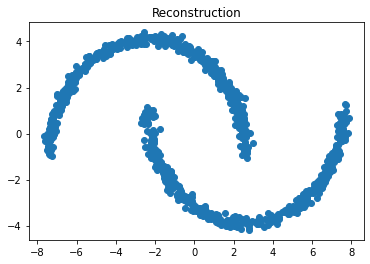

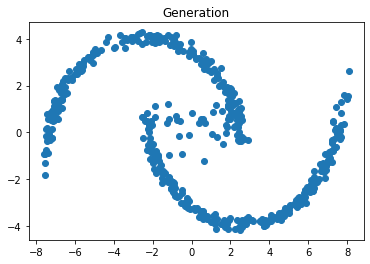

Epoch: 5200 loss: 3.0361 recon_loss: -1.1114 kl_loss: 4.1475 avg mean: -0.0250 avg std: 0.4622


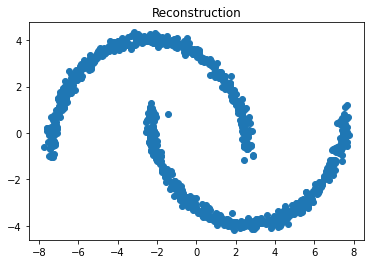

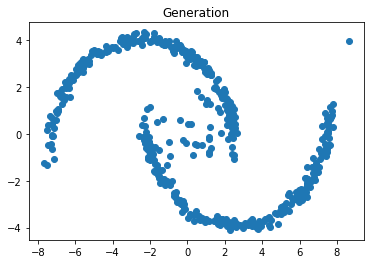

Epoch: 5400 loss: 3.0447 recon_loss: -1.1085 kl_loss: 4.1532 avg mean: -0.0322 avg std: 0.4595


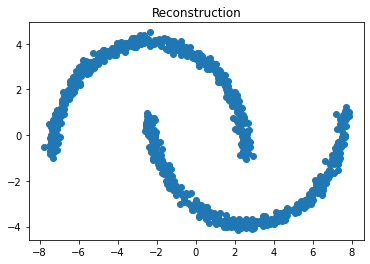

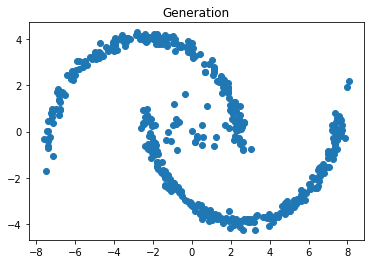

Epoch: 5600 loss: 3.0405 recon_loss: -1.0906 kl_loss: 4.1311 avg mean: 0.0007 avg std: 0.4703


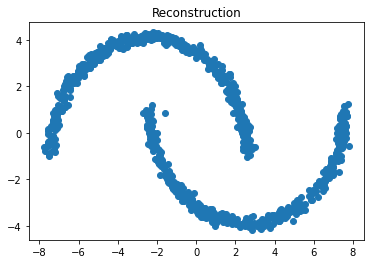

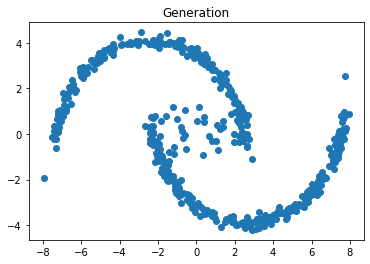

Epoch: 5800 loss: 3.0216 recon_loss: -1.1020 kl_loss: 4.1236 avg mean: 0.0201 avg std: 0.4692


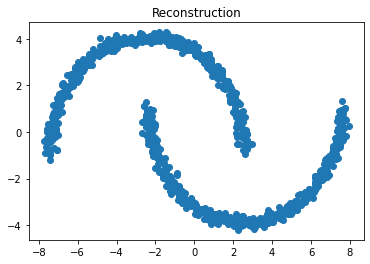

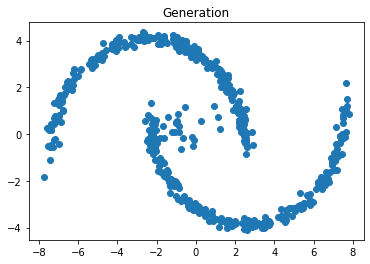

Epoch: 6000 loss: 3.0048 recon_loss: -1.1195 kl_loss: 4.1243 avg mean: 0.0054 avg std: 0.4838


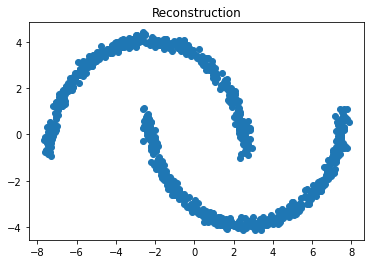

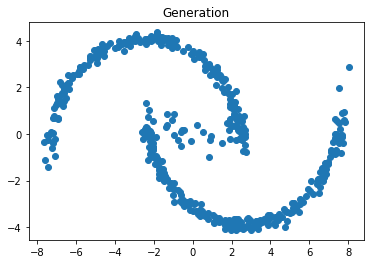

Epoch: 6200 loss: 3.0028 recon_loss: -1.1334 kl_loss: 4.1362 avg mean: 0.0024 avg std: 0.4693


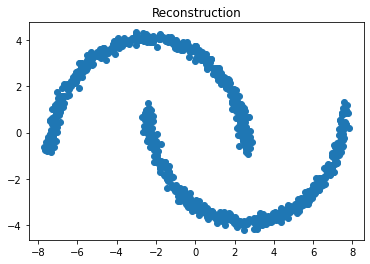

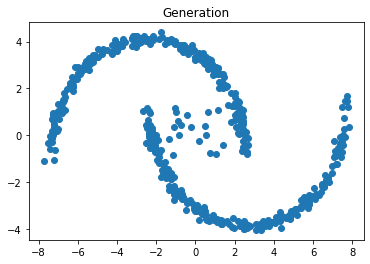

Epoch: 6400 loss: 3.0178 recon_loss: -1.1018 kl_loss: 4.1196 avg mean: -0.0277 avg std: 0.4814


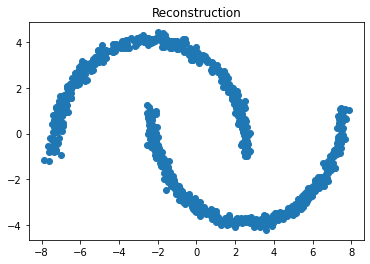

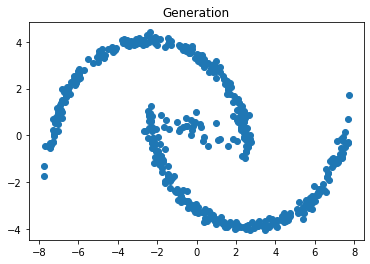

Epoch: 6600 loss: 3.0023 recon_loss: -1.1330 kl_loss: 4.1352 avg mean: -0.0073 avg std: 0.4808


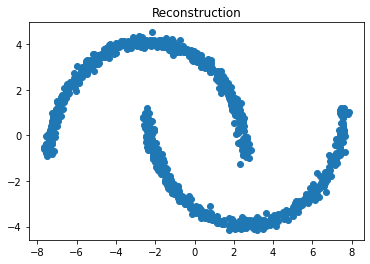

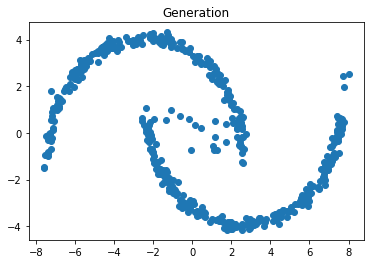

Epoch: 6800 loss: 2.9894 recon_loss: -1.1269 kl_loss: 4.1163 avg mean: 0.0010 avg std: 0.4912


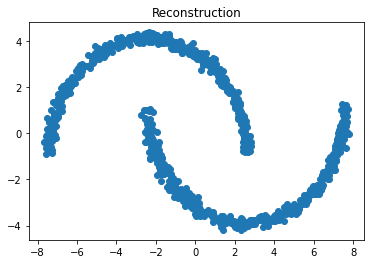

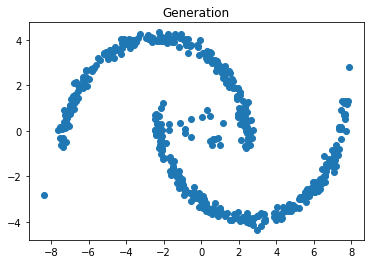

Epoch: 7000 loss: 2.9825 recon_loss: -1.1296 kl_loss: 4.1122 avg mean: 0.0121 avg std: 0.4883


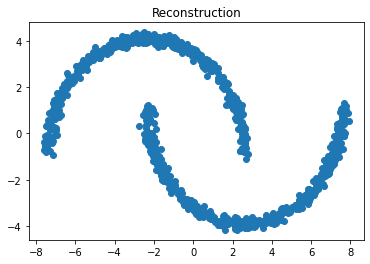

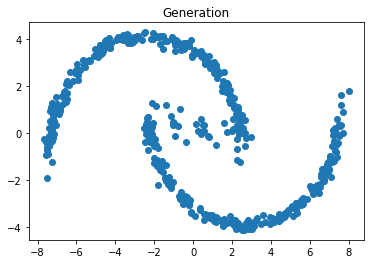

Epoch: 7200 loss: 2.9683 recon_loss: -1.1555 kl_loss: 4.1238 avg mean: 0.0040 avg std: 0.4853


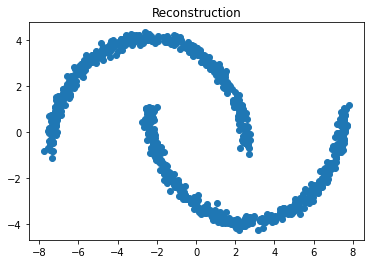

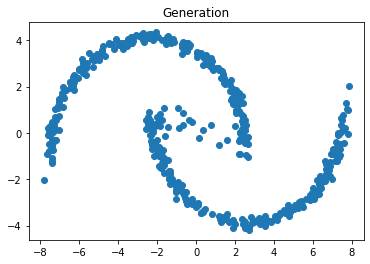

Epoch: 7400 loss: 2.9724 recon_loss: -1.1266 kl_loss: 4.0990 avg mean: 0.0039 avg std: 0.4937


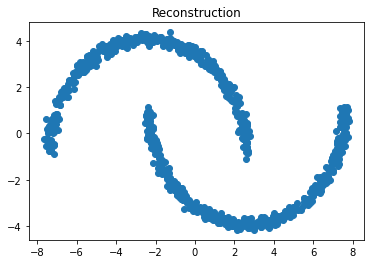

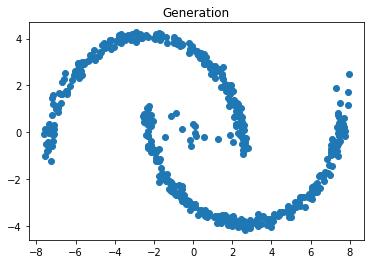

In [ ]:
# Please note: the model should converge faster!
for i in range(7500):
    # print(i)
    recon_loss_acc = 0.0
    kl_acc = 0.0
    vae.train()
    for x, in moons_dl:
        x = x.float().to(device)

        x_mu, x_log_var, z_mu, z_log_var = vae(x)

        optimizer.zero_grad()
        # print(x_mu.shape, x_log_var.shape, z_mu.shape, z_log_var.shape)
        recon_loss = reconstruction_loss(x_mu, x_log_var, x)
        kl = kl_loss(z_mu, z_log_var)
        loss = recon_loss + kl
        loss.backward()
        optimizer.step()

        recon_loss_acc += recon_loss.item() * len(x)
        kl_acc += kl.item() * len(x)

    if i % 200 == 0:
        print(
            f"Epoch: {i} loss: {(recon_loss_acc + kl_acc) / len(moons) :.4f} recon_loss: {recon_loss_acc / len(moons) :.4f} kl_loss: {kl_acc / len(moons) :.4f} avg mean: {z_mu.detach().mean() :.4f} avg std: {torch.exp(z_log_var.detach() / 2).mean() :.4f}"
        )
        vae.eval()
        with torch.no_grad():
            # Reconstruct data
            x_recon = torch.randn(x.shape).to(device) * torch.exp(x_log_var / 2) + x_mu
            x_recon = x_recon.cpu()

            plt.scatter(x_recon[:, 0], x_recon[:, 1])
            plt.title("Reconstruction")
            plt.show()

            # Generate new data
            z = torch.randn(500, z_dim).to(device)
            x_gen_mu, x_gen_log_var = vae.decode(z)
            x_gen = (
                torch.randn(z.shape[0], 2).to(device) * torch.exp(x_gen_log_var / 2)
                + x_gen_mu
            )
            x_gen = x_gen.cpu()

            plt.scatter(x_gen[:, 0], x_gen[:, 1])
            plt.title("Generation")
            plt.show()

Text(0.5, 1.0, 'Data in latent space')

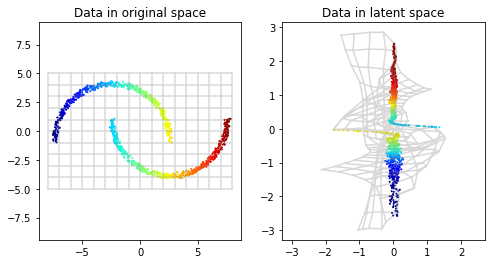

In [ ]:
data = np.array(moons)[np.random.permutation(moons.shape[0])[:1000]]
grid = get_grid(data)

data_colors = (data[:, 0] - min(data[:, 0])) / (max(data[:, 0]) - min(data[:, 0]))
data_colors = plt.cm.jet(data_colors)

plt.figure(figsize=(8, 4))
plt.subplot(1, 2, 1)

plt.plot(grid[:, 0], grid[:, 1], color="gray", alpha=0.3)
plt.scatter(data[:, 0], data[:, 1], color=data_colors, s=1.0)
_ = plt.axis("equal")
plt.title("Data in original space")

vae.eval()

plt.subplot(1, 2, 2)

# TODO: compute the latent encoding of the data nd the grid

sampled_z_grid, z_mu_grid, z_log_var_grid = vae.encode(torch.from_numpy(grid).float().to(device))
enc_grid = z_mu_grid.detach().cpu().numpy()
sampled_z_data, z_mu_data, z_log_var_data = vae.encode(torch.from_numpy(data).float().to(device))
enc_data = z_mu_data.detach().cpu().numpy()

plt.plot(enc_grid[:, 0], enc_grid[:, 1], color="gray", alpha=0.3)
plt.scatter(enc_data[:, 0], enc_data[:, 1], color=data_colors, s=1.0)
_ = plt.axis("equal")
plt.title("Data in latent space")

Text(0.5, 1.0, 'Generated data in original space')

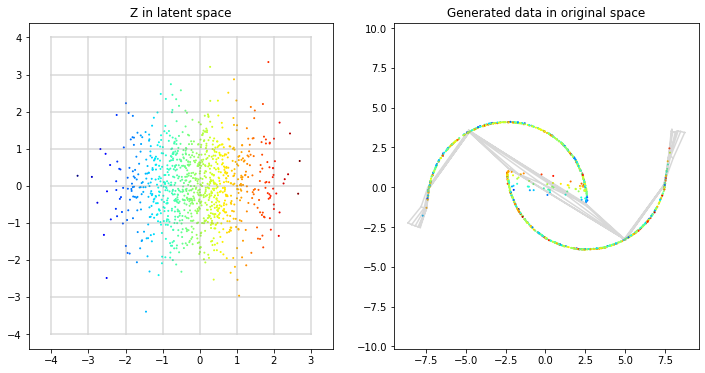

In [ ]:
latent_samples = torch.randn(1000, z_dim)

latent_colors = (latent_samples[:, 0] - min(latent_samples[:, 0])) / (
    max(latent_samples[:, 0]) - min(latent_samples[:, 0])
)
latent_colors = plt.cm.jet(latent_colors.numpy())

latent_grid = get_grid(latent_samples.numpy())

vae.eval()

# TODO: compute the projection into data space of the latent saples and the grid
mu_x_gen, log_var_x_gen = vae.decode(latent_samples.to(device))
x_gen = mu_x_gen.detach().cpu().numpy()
mu_grid_gen, log_var_grid_gen = vae.decode(torch.from_numpy(latent_grid).float().to(device))
grid_gen = mu_grid_gen.detach().cpu().numpy()

plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(latent_grid[:, 0], latent_grid[:, 1], color="gray", alpha=0.3)
plt.scatter(latent_samples[:, 0], latent_samples[:, 1], color=latent_colors, s=1)
_ = plt.axis("equal")
plt.title("Z in latent space")

plt.subplot(1, 2, 2)

plt.plot(grid_gen[:, 0], grid_gen[:, 1], color="gray", alpha=0.3)
plt.scatter(x_gen[:, 0], x_gen[:, 1], color=latent_colors, s=1)
_ = plt.axis("equal")
plt.title("Generated data in original space")

1. Write down the formula for the reconstruction loss. The variance appears in two terms, what is their function?

Negative log likelihood rozkładu normalnego:
$\frac{N}{2} \log ( 2\pi\sigma^{2} ) + \frac{1}{2\sigma^{2}} \sum\limits_{n=1}^{N} (x_{n} - \mu)^{2}$

Pierwsza wariancja pochodzi od stałej znajdującej się przed wykładniczym wyrażeniem z $e$, a druga od wariancji w wykładniku $e$.

2. The reconstruction loss may fall below zero. How is this possible? 

Drugi składnik negative log likelihood jest zawsze dodatni. Pierwszy może być ujemny, gdy sigma jest mała. Całe wyrażenie może być ujemne, gdy sigma jest mała i drugie wyrażenie jest bliskie zeru ($x_n$ bliskie $\mu$).

Compare the operation of the VAE for 2 Moons with a few widths. How is the loss dependent on the width? Why?

* Width: 1.0 Epoch: 7400 loss: 4.5720 recon_loss: -0.5845 kl_loss: 5.1565 avg mean: 0.0508 avg std: 0.0950
* Width: 0.5 Epoch: 7400 loss: 4.0102 recon_loss: -0.6264 kl_loss: 4.6367 avg mean: 0.0143 avg std: 0.1838
* Width: 0.2 Epoch: 7400 loss: 3.3867 recon_loss: -1.0853 kl_loss: 4.4720 avg mean: 0.0058 avg std: 0.2600

Wraz ze zmniejszaniem się width księżyców, spada loss. Z mniejszym widthem łatwiej rozdzielić poszczególne fragmenty danych, co widać na rysunkach przedstawiających zrzutowanie danych i grida na latent space.

## GAN

In [ ]:
class Generator(nn.Module):
    def __init__(self, in_dim=2, hid_dim=128, out_dim=2):
        super(Generator, self).__init__()
        self.in_dim = in_dim
        self.hid_dim = hid_dim
        self.out_dim = out_dim

        self.layers = nn.Sequential(
            nn.Linear(in_dim, hid_dim),
            nn.ReLU(),
            nn.Linear(hid_dim, hid_dim),
            nn.ReLU(),
            nn.Linear(hid_dim, out_dim),
        )

    def forward(self, x):
        return self.layers(x)


class Discriminator(nn.Module):
    def __init__(self, in_dim=2, hid_dim=128, out_dim=1):
        super(Discriminator, self).__init__()
        self.in_dim = in_dim
        self.hid_dim = hid_dim
        self.out_dim = out_dim

        self.layers = nn.Sequential(
            nn.Linear(in_dim, hid_dim),
            nn.ReLU(),
            nn.Linear(hid_dim, hid_dim),
            nn.ReLU(),
            nn.Linear(hid_dim, out_dim),
            nn.Sigmoid(),
        )

    def forward(self, x):
        return self.layers(x)

In [ ]:
def generator_loss(DG, eps=1e-6):
    # Define Generator loss. Use eps for numerical stability of log.
    # loss = - (torch.ones_like(DG) * torch.log2(DG + eps) + (1 - torch.ones_like(DG)) * (torch.log2(1 - DG + eps))).mean()
    # return 0.5 * loss
    loss = - (torch.ones_like(DG) * torch.log2(DG + eps)).mean()
    return 0.5 * loss


def discriminator_loss(DR, DG, eps=1e-6):
    # Define Discriminator loss. Use eps for numerical stability of log.
    # real_loss = - (torch.ones_like(DR) * torch.log2(DR + eps) + (1 - torch.ones_like(DR)) * (torch.log2(1 - DR + eps))).mean()
    # fake_loss = - (torch.ones_like(DG) * torch.log2(1 - DG + eps) + (1 - torch.ones_like(DG)) * (torch.log2(DG + eps))).mean()
    # return 0.5 * real_loss + 0.5 * fake_loss
    real_loss = - (torch.ones_like(DR) * torch.log2(DR + eps)).mean()
    fake_loss = - (torch.ones_like(DG) * torch.log2(1 - DG + eps)).mean()
    return 0.5 * real_loss + 0.5 * fake_loss


In [ ]:
z_dim = 2
hid_dim = 64
lr = 0.0001

G = Generator(in_dim=z_dim, hid_dim=hid_dim).to(device)
D = Discriminator(hid_dim=hid_dim).to(device)
G_optimizer = optim.Adam(G.parameters(), lr=lr)
D_optimizer = optim.Adam(D.parameters(), lr=lr)

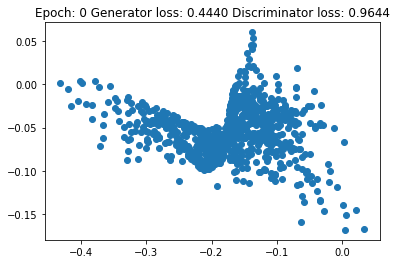

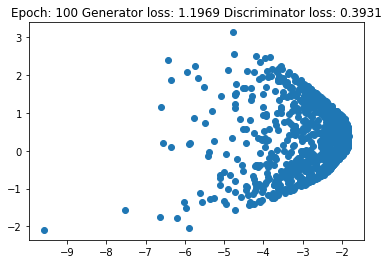

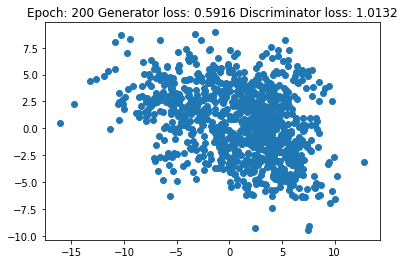

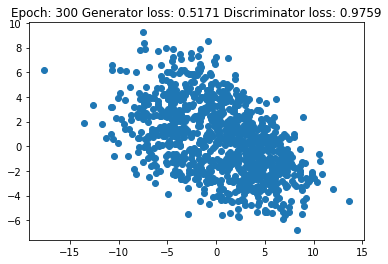

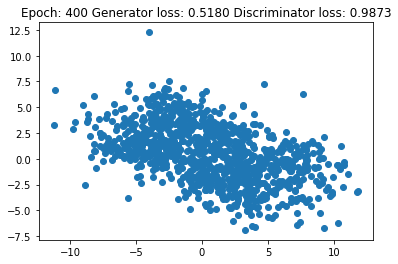

...

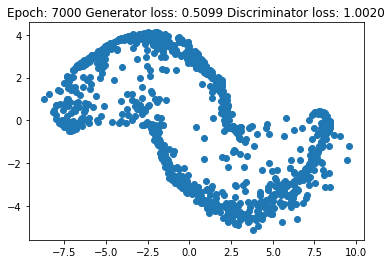

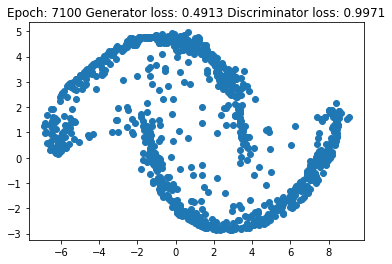

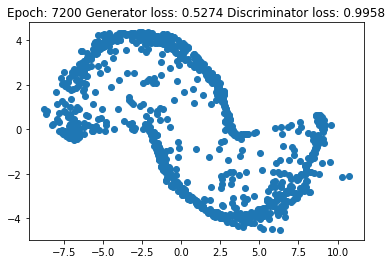

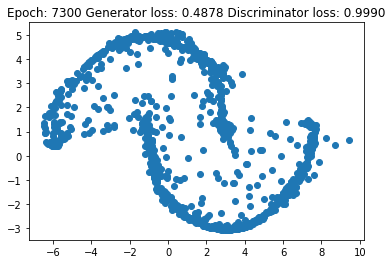

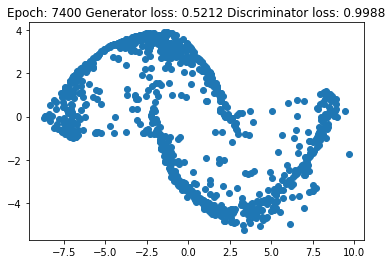

In [ ]:
for i in range(7500):
    G_loss_acc = 0.0
    D_loss_acc = 0.0
    G.train()
    D.train()
    for x, in moons_dl:
        x = x.float().to(device)

        # Generate fake data from z ~ N(0,1).
        # Calculate Generator loss.
        z = torch.randn(x.size(0), z_dim, device=device)
        x_fake = G(z)  # Use the generator to compute x_Fake

        # make a copy of x_fake and detach it, we'll use the copy to train the Discriminator
        x_fake_detached = x_fake.detach()

        G_loss = generator_loss(D(x_fake)) # Now use the discriminator and compute generator loss

        G_optimizer.zero_grad()
        G_loss.backward()
        G_optimizer.step()

        # Calculate Discriminator loss.
        # Remember to use x_fake_detached to prevent backpropagating through generator!
        D_loss = discriminator_loss(D(x), D(x_fake_detached))

        D_optimizer.zero_grad()
        D_loss.backward()
        D_optimizer.step()

        G_loss_acc += G_loss.item() * len(x)
        D_loss_acc += D_loss.item() * len(x)

    if i % 100 == 0:
        G.eval()
        with torch.no_grad():
            z = torch.randn(1000, z_dim, device=device)
            x_gen = G(z).cpu()
            plt.scatter(x_gen[:, 0], x_gen[:, 1])
            plt.title(
                f"Epoch: {i} Generator loss: {G_loss_acc / len(moons) :.4f} Discriminator loss: {D_loss_acc / len(moons) :.4f}"
            )
            plt.show()

Text(0.5, 1.0, 'Generated data in original space')

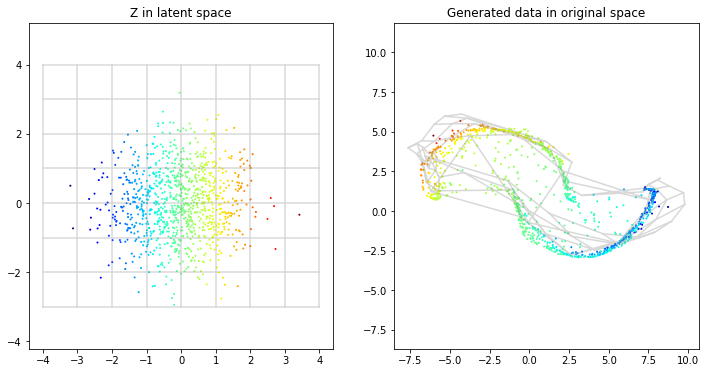

In [ ]:
latent_samples = torch.randn(1000, z_dim)

latent_colors = (latent_samples[:, 0] - min(latent_samples[:, 0])) / (
    max(latent_samples[:, 0]) - min(latent_samples[:, 0])
)
latent_colors = plt.cm.jet(latent_colors.numpy())

latent_grid = get_grid(latent_samples.numpy())

G.eval()
# TODO: compute the projection into data space of the latent saples and the grid
x_gen = G(latent_samples.to(device)).detach().cpu().numpy()
grid_gen = G(torch.from_numpy(latent_grid).float().to(device)).detach().cpu().numpy()

plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(latent_grid[:, 0], latent_grid[:, 1], color="gray", alpha=0.3)
plt.scatter(latent_samples[:, 0], latent_samples[:, 1], color=latent_colors, s=1)
_ = plt.axis("equal")
plt.title("Z in latent space")

plt.subplot(1, 2, 2)

plt.plot(grid_gen[:, 0], grid_gen[:, 1], color="gray", alpha=0.3)
plt.scatter(x_gen[:, 0], x_gen[:, 1], color=latent_colors, s=1)
_ = plt.axis("equal")
plt.title("Generated data in original space")

  **Answer these questions:**
  - Is the GAN generating all possible samples? Is it concentrating more on some regions of the data space?

Gan is not generating all possible samples. We can see some small gaps in some regions of moons. There are also a few regions of high concentration of data.

## Normalizing Flow

UWAGA! Przez outlidery rysunki są często mało przejrzyste. Dopiero po większej liczbie iteracji albo szczczęśliwym starcie problem znika 

In [ ]:
class CouplingLayer(nn.Module):
    def __init__(self, idx, in_dim, hid_dim, out_dim):
        super(CouplingLayer, self).__init__()
        self.in_dim = in_dim // 2
        self.hid_dim = hid_dim
        self.out_dim = out_dim // 2
        self.odd = idx % 2 == 1

        self.s = nn.Sequential(
            nn.Linear(self.in_dim, self.hid_dim),
            nn.ReLU(),
            nn.Linear(self.hid_dim, self.out_dim),
            nn.Tanh(),
        )

        self.t = nn.Sequential(
            nn.Linear(self.in_dim, self.hid_dim),
            nn.ReLU(),
            nn.Linear(self.hid_dim, self.out_dim),
        )

    def forward(self, x, ldetJ):
        # Split x into two halves along dimension axis.
        x1, x2 = x[:, 0, None], x[:, 1, None]  # x1, x2 = TODO
        if self.odd:
            x1, x2 = x2, x1

        s = self.s(x1)
        t = self.t(x1)
        # Transform x2 using s and t.
        # x1 = x1
        x2 = s * x2 + t

        if self.odd:
            x1, x2 = x2, x1

        # Add log determinant of the Jacobian
        # ldetJ += (s.prod().abs()+1e-6).log()
        # ldetJ += (s+1e-6).log().sum()
        ldetJ += (s.abs()+1e-6).log()

        return torch.cat([x1, x2], dim=1), ldetJ

    def invert(self, z):
        z1, z2 = z[:, 0, None], z[:, 1, None]
        if self.odd:
            z1, z2 = z2, z1

        s = self.s(z1)
        t = self.t(z1)
        # Invert the transformation of x2 from the forward step.
        # z1 = z1
        z2 = (z2 - t) / (s +1e-6) 

        if self.odd:
            z1, z2 = z2, z1

        return torch.cat([z1, z2], dim=1)


class RealNVP(nn.Module):
    def __init__(self, n_coupling_layers=4, in_dim=2, hid_dim=128, out_dim=2):
        super(RealNVP, self).__init__()
        assert n_coupling_layers % 2 == 0
        self.in_dim = in_dim
        self.hid_dim = hid_dim
        self.out_dim = out_dim

        self.coupling_layers = nn.ModuleList(
            [
                CouplingLayer(i, in_dim, hid_dim, out_dim)
                for i in range(n_coupling_layers)
            ]
        )

    def forward(self, x):
        ldetJ = 0.0
        for layer in self.coupling_layers:
            x, ldetJ = layer(x, ldetJ)
        return x, ldetJ

    def invert(self, z):
        for layer in reversed(self.coupling_layers):
            z = layer.invert(z)
        return z

In [ ]:
def nll_loss(z, ldetJ, prior_z):
    # print(z.shape)
    # dist = torch.distributions.Normal(loc=0, scale=1)
    # Define negative log-likelihood loss for change of variable formula.
    # Hint: use prior_z.log_prob().
    return -((prior_z.log_prob(z) + ldetJ)).mean()

In [ ]:
n_coupling_layers = 6
hid_dim = 64
lr = 0.003

flow = RealNVP(n_coupling_layers=n_coupling_layers, hid_dim=hid_dim).to(device)
optimizer = optim.Adam(flow.parameters(), lr=lr)
prior_z = MultivariateNormal(torch.zeros(2).to(device), torch.eye(2).to(device))
# prior_z_single = torch.distributions.Normal(loc=0, scale=1)

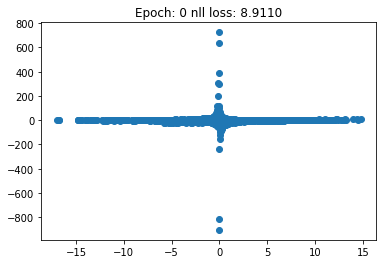

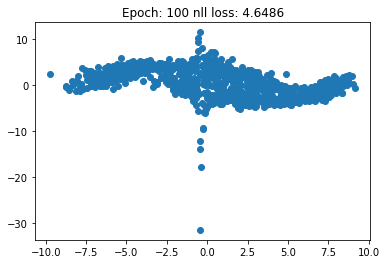

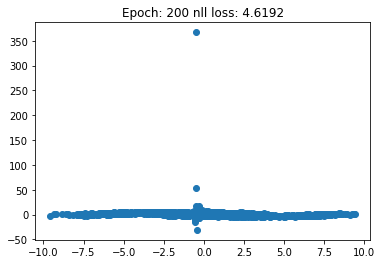

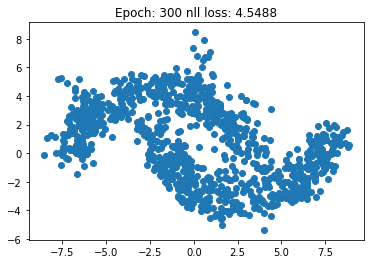

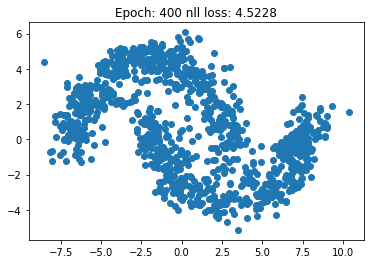

...

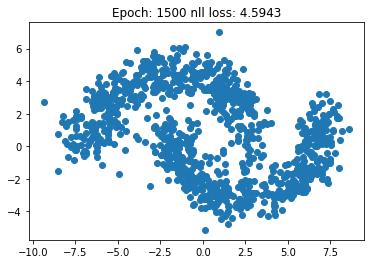

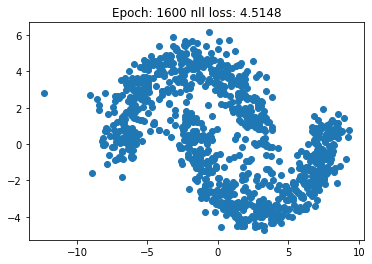

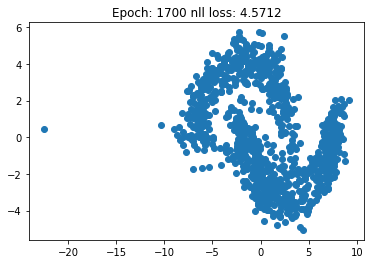

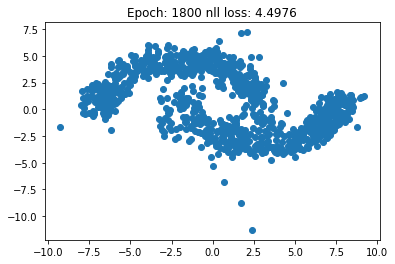

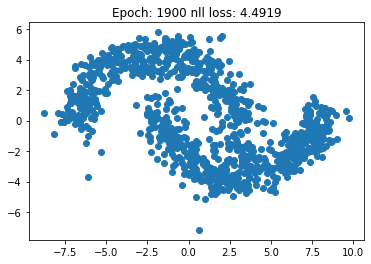

In [ ]:
for i in range(2000):
    loss_acc = 0.0
    flow.train()
    for x, in moons_dl:
        x = x.float().to(device)
        # dequantization - add a little random noise
        x += torch.rand(x.shape, device=device) / 1e2
        z, ldetJ = flow(x)

        loss = nll_loss(z, ldetJ, prior_z)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        loss_acc += loss.item() * len(x)

    if i % 100 == 0:
        flow.eval()
        with torch.no_grad():
            z = prior_z.sample((1000,))
            x = flow.invert(z).cpu()
            plt.scatter(x[:, 0], x[:, 1])
            plt.title(f"Epoch: {i} nll loss: {loss_acc / len(moons) :.4f}")
            plt.show()

(-5.0, 5.0)

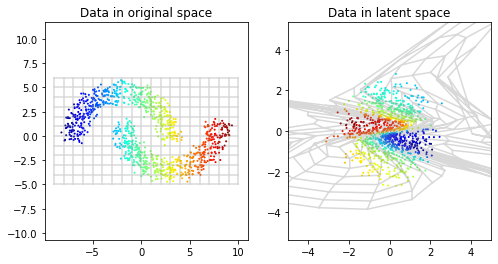

In [ ]:
data = np.array(moons)[np.random.permutation(moons.shape[0])[:1000]]
grid = get_grid(data)

data_colors = (data[:, 0] - min(data[:, 0])) / (max(data[:, 0]) - min(data[:, 0]))
data_colors = plt.cm.jet(data_colors)

plt.figure(figsize=(8, 4))
plt.subplot(1, 2, 1)

plt.plot(grid[:, 0], grid[:, 1], color="gray", alpha=0.3)
plt.scatter(data[:, 0], data[:, 1], color=data_colors, s=1.0)
_ = plt.axis("equal")
plt.title("Data in original space")


plt.subplot(1, 2, 2)

# TODO: compute the latent encoding of the data nd the grid
enc_grid = flow(torch.from_numpy(grid).float().to(device))[0].detach().cpu().numpy()
enc_data = flow(torch.from_numpy(data).float().to(device))[0].detach().cpu().numpy()

plt.plot(enc_grid[:, 0], enc_grid[:, 1], color="gray", alpha=0.3)
plt.scatter(enc_data[:, 0], enc_data[:, 1], color=data_colors, s=1.0)
_ = plt.axis("equal")
plt.title("Data in latent space")
plt.xlim(-5, 5)
plt.ylim(-5, 5)

Text(0.5, 1.0, 'Generated data in original space')

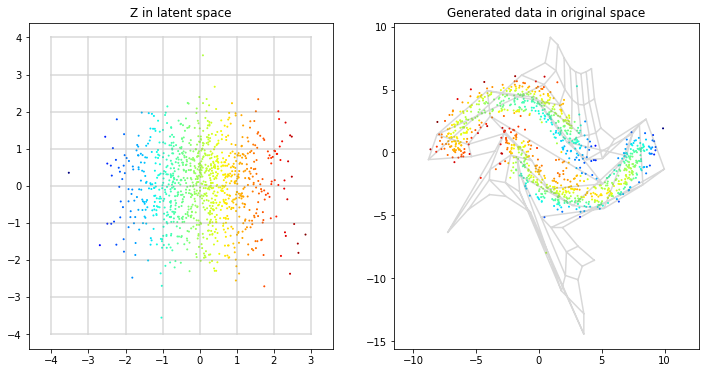

In [ ]:
latent_samples = prior_z.sample((1000,)).cpu()

latent_colors = (latent_samples[:, 0] - min(latent_samples[:, 0])) / (
    max(latent_samples[:, 0]) - min(latent_samples[:, 0])
)
latent_colors = plt.cm.jet(latent_colors.numpy())

latent_grid = get_grid(latent_samples.numpy())

# TODO: compute the projection into data space of the latent saples and the grid
x_gen = flow.invert(latent_samples.float().to(device)).detach().cpu().numpy()
grid_gen = flow.invert(torch.from_numpy(latent_grid).float().to(device)).detach().cpu().numpy()

plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(latent_grid[:, 0], latent_grid[:, 1], color="gray", alpha=0.3)
plt.scatter(latent_samples[:, 0], latent_samples[:, 1], color=latent_colors, s=1)
_ = plt.axis("equal")
plt.title("Z in latent space")

plt.subplot(1, 2, 2)

plt.plot(grid_gen[:, 0], grid_gen[:, 1], color="gray", alpha=0.3)
plt.scatter(x_gen[:, 0], x_gen[:, 1], color=latent_colors, s=1)
_ = plt.axis("equal")
plt.title("Generated data in original space")

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  


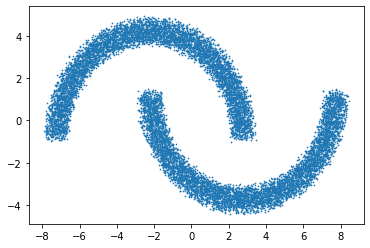

In [ ]:
moons = generate_moons(width=0.5)
moons_dl = InMemDataLoader([moons], batch_size=2048, shuffle=True)
moons_dl.to(device)
plt.scatter(moons[:, 0], moons[:, 1], s=0.5)

In [ ]:
n_coupling_layers = 6
hid_dim = 64
lr = 0.003

flow = RealNVP(n_coupling_layers=n_coupling_layers, hid_dim=hid_dim).to(device)
optimizer = optim.Adam(flow.parameters(), lr=lr)
prior_z = MultivariateNormal(torch.zeros(2).to(device), torch.eye(2).to(device))

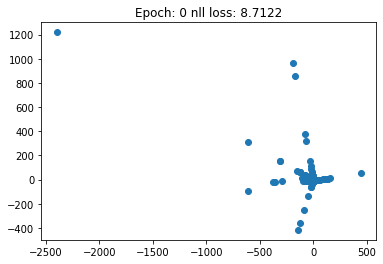

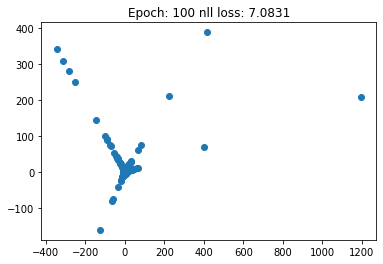

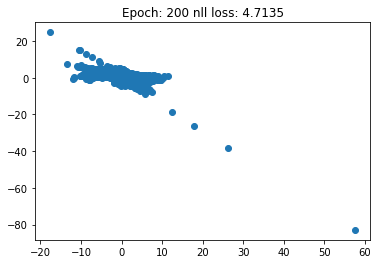

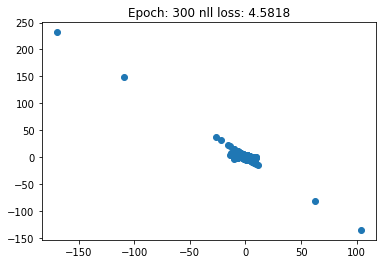

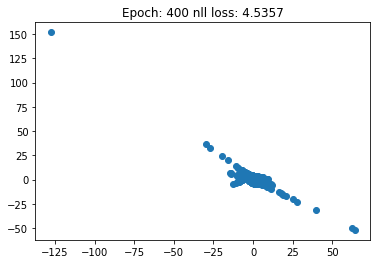

...

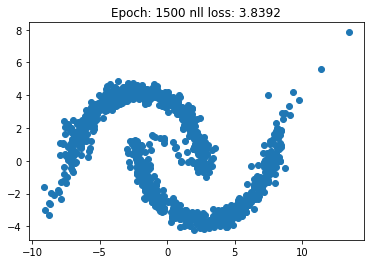

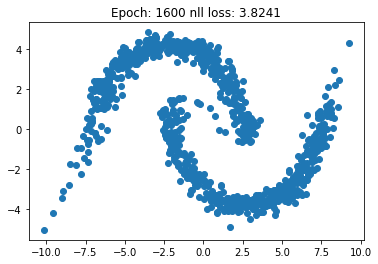

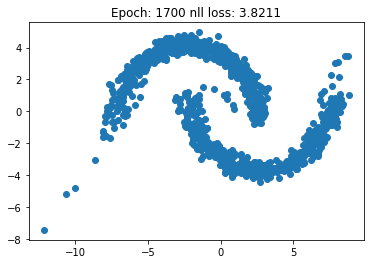

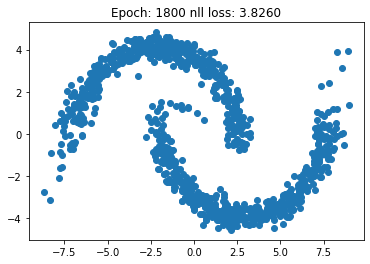

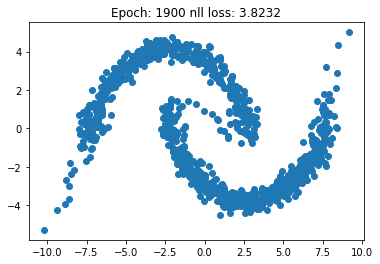

In [ ]:
for i in range(2000):
    loss_acc = 0.0
    flow.train()
    for x, in moons_dl:
        x = x.float().to(device)
        # dequantization - add a little random noise
        x += torch.rand(x.shape, device=device) / 1e2
        z, ldetJ = flow(x)

        loss = nll_loss(z, ldetJ, prior_z)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        loss_acc += loss.item() * len(x)

    if i % 100 == 0:
        flow.eval()
        with torch.no_grad():
            z = prior_z.sample((1000,))
            x = flow.invert(z).cpu()
            plt.scatter(x[:, 0], x[:, 1])
            plt.title(f"Epoch: {i} nll loss: {loss_acc / len(moons) :.4f}")
            plt.show()

(-5.0, 5.0)

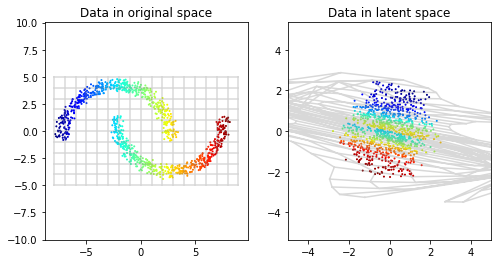

In [ ]:
data = np.array(moons)[np.random.permutation(moons.shape[0])[:1000]]
grid = get_grid(data)

data_colors = (data[:, 0] - min(data[:, 0])) / (max(data[:, 0]) - min(data[:, 0]))
data_colors = plt.cm.jet(data_colors)

plt.figure(figsize=(8, 4))
plt.subplot(1, 2, 1)

plt.plot(grid[:, 0], grid[:, 1], color="gray", alpha=0.3)
plt.scatter(data[:, 0], data[:, 1], color=data_colors, s=1.0)
_ = plt.axis("equal")
plt.title("Data in original space")


plt.subplot(1, 2, 2)

# TODO: compute the latent encoding of the data nd the grid
enc_grid = flow(torch.from_numpy(grid).float().to(device))[0].detach().cpu().numpy()
enc_data = flow(torch.from_numpy(data).float().to(device))[0].detach().cpu().numpy()

plt.plot(enc_grid[:, 0], enc_grid[:, 1], color="gray", alpha=0.3)
plt.scatter(enc_data[:, 0], enc_data[:, 1], color=data_colors, s=1.0)
_ = plt.axis("equal")
plt.title("Data in latent space")
plt.xlim(-5, 5)
plt.ylim(-5, 5)

Text(0.5, 1.0, 'Generated data in original space')

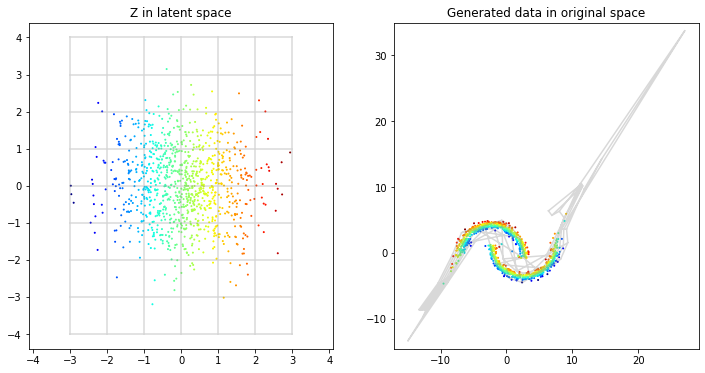

In [ ]:
latent_samples = prior_z.sample((1000,)).cpu()

latent_colors = (latent_samples[:, 0] - min(latent_samples[:, 0])) / (
    max(latent_samples[:, 0]) - min(latent_samples[:, 0])
)
latent_colors = plt.cm.jet(latent_colors.numpy())

latent_grid = get_grid(latent_samples.numpy())

# TODO: compute the projection into data space of the latent saples and the grid
x_gen = flow.invert(latent_samples.float().to(device)).detach().cpu().numpy()
grid_gen = flow.invert(torch.from_numpy(latent_grid).float().to(device)).detach().cpu().numpy()

plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(latent_grid[:, 0], latent_grid[:, 1], color="gray", alpha=0.3)
plt.scatter(latent_samples[:, 0], latent_samples[:, 1], color=latent_colors, s=1)
_ = plt.axis("equal")
plt.title("Z in latent space")

plt.subplot(1, 2, 2)

plt.plot(grid_gen[:, 0], grid_gen[:, 1], color="gray", alpha=0.3)
plt.scatter(x_gen[:, 0], x_gen[:, 1], color=latent_colors, s=1)
_ = plt.axis("equal")
plt.title("Generated data in original space")

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  


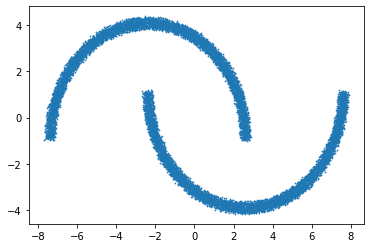

In [ ]:
moons = generate_moons(width=0.2)
moons_dl = InMemDataLoader([moons], batch_size=2048, shuffle=True)
moons_dl.to(device)
plt.scatter(moons[:, 0], moons[:, 1], s=0.5)

In [ ]:
n_coupling_layers = 6
hid_dim = 64
lr = 0.003

flow = RealNVP(n_coupling_layers=n_coupling_layers, hid_dim=hid_dim).to(device)
optimizer = optim.Adam(flow.parameters(), lr=lr)
prior_z = MultivariateNormal(torch.zeros(2).to(device), torch.eye(2).to(device))

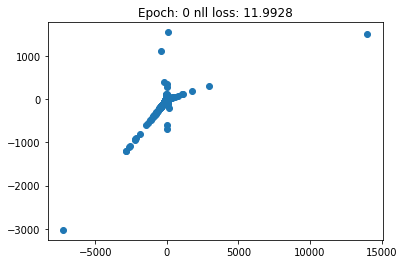

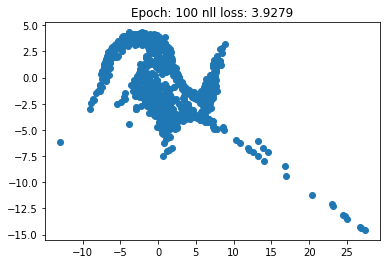

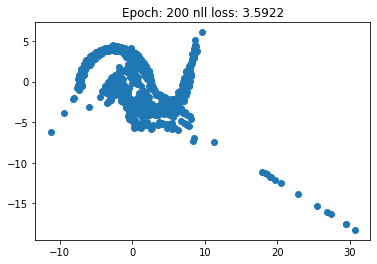

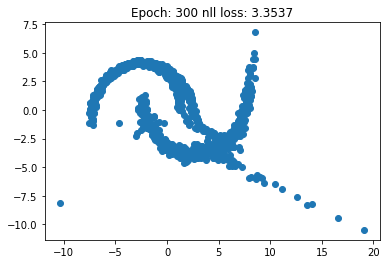

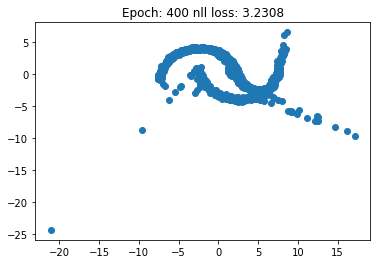

...

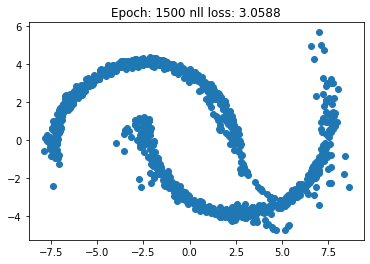

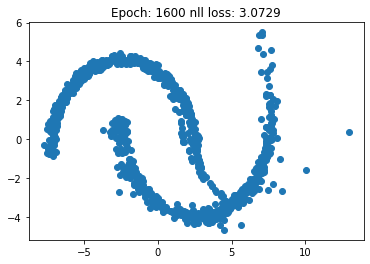

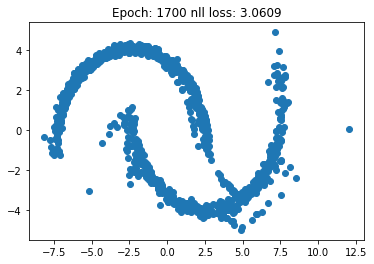

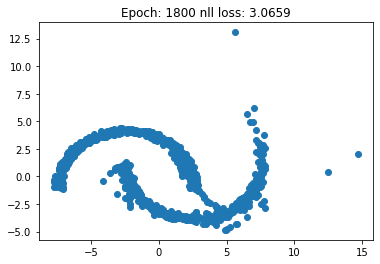

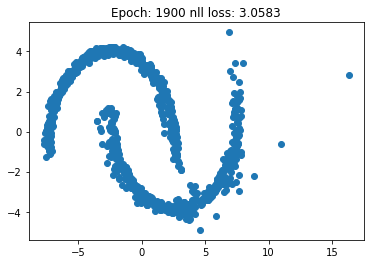

In [ ]:
for i in range(2000):
    loss_acc = 0.0
    flow.train()
    for x, in moons_dl:
        x = x.float().to(device)
        # dequantization - add a little random noise
        x += torch.rand(x.shape, device=device) / 1e2
        z, ldetJ = flow(x)

        loss = nll_loss(z, ldetJ, prior_z)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        loss_acc += loss.item() * len(x)

    if i % 100 == 0:
        flow.eval()
        with torch.no_grad():
            z = prior_z.sample((1000,))
            x = flow.invert(z).cpu()
            plt.scatter(x[:, 0], x[:, 1])
            plt.title(f"Epoch: {i} nll loss: {loss_acc / len(moons) :.4f}")
            plt.show()

(-5.0, 5.0)

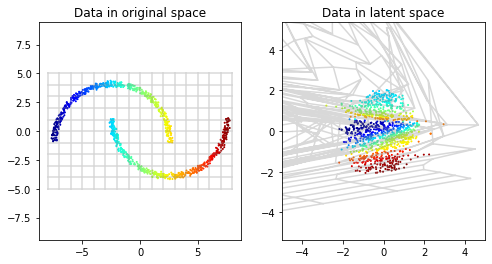

In [ ]:
data = np.array(moons)[np.random.permutation(moons.shape[0])[:1000]]
grid = get_grid(data)

data_colors = (data[:, 0] - min(data[:, 0])) / (max(data[:, 0]) - min(data[:, 0]))
data_colors = plt.cm.jet(data_colors)

plt.figure(figsize=(8, 4))
plt.subplot(1, 2, 1)

plt.plot(grid[:, 0], grid[:, 1], color="gray", alpha=0.3)
plt.scatter(data[:, 0], data[:, 1], color=data_colors, s=1.0)
_ = plt.axis("equal")
plt.title("Data in original space")


plt.subplot(1, 2, 2)

# TODO: compute the latent encoding of the data nd the grid
enc_grid = flow(torch.from_numpy(grid).float().to(device))[0].detach().cpu().numpy()
enc_data = flow(torch.from_numpy(data).float().to(device))[0].detach().cpu().numpy()

plt.plot(enc_grid[:, 0], enc_grid[:, 1], color="gray", alpha=0.3)
plt.scatter(enc_data[:, 0], enc_data[:, 1], color=data_colors, s=1.0)
_ = plt.axis("equal")
plt.title("Data in latent space")
plt.xlim(-5, 5)
plt.ylim(-5, 5)

Text(0.5, 1.0, 'Generated data in original space')

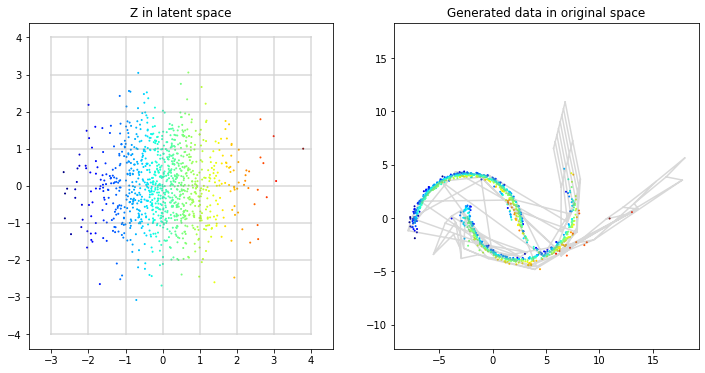

In [ ]:
latent_samples = prior_z.sample((1000,)).cpu()

latent_colors = (latent_samples[:, 0] - min(latent_samples[:, 0])) / (
    max(latent_samples[:, 0]) - min(latent_samples[:, 0])
)
latent_colors = plt.cm.jet(latent_colors.numpy())

latent_grid = get_grid(latent_samples.numpy())

# TODO: compute the projection into data space of the latent saples and the grid
x_gen = flow.invert(latent_samples.float().to(device)).detach().cpu().numpy()
grid_gen = flow.invert(torch.from_numpy(latent_grid).float().to(device)).detach().cpu().numpy()

plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(latent_grid[:, 0], latent_grid[:, 1], color="gray", alpha=0.3)
plt.scatter(latent_samples[:, 0], latent_samples[:, 1], color=latent_colors, s=1)
_ = plt.axis("equal")
plt.title("Z in latent space")

plt.subplot(1, 2, 2)

plt.plot(grid_gen[:, 0], grid_gen[:, 1], color="gray", alpha=0.3)
plt.scatter(x_gen[:, 0], x_gen[:, 1], color=latent_colors, s=1)
_ = plt.axis("equal")
plt.title("Generated data in original space")

    VAE:
        Width: 1.0 Epoch: 7400 loss: 4.5720 recon_loss: -0.5845 kl_loss: 5.1565 avg mean: 0.0508 avg std: 0.0950
        Width: 0.5 Epoch: 7400 loss: 4.0102 recon_loss: -0.6264 kl_loss: 4.6367 avg mean: 0.0143 avg std: 0.1838
        Width: 0.2 Epoch: 7400 loss: 3.3867 recon_loss: -1.0853 kl_loss: 4.4720 avg mean: 0.0058 avg std: 0.2600

    Normalizing Flow:
        Width: 1.0 Epoch: 1900 nll loss: 4.4919
        Width: 0.5 Epoch: 1900 nll loss: 3.8232
        Width: 0.2 Epoch: 1900 nll loss: 3.0583

Reconsturcion loss w VAE jest zdecydowanie mniejszy od nll loss z Normalizing Flow, ale sumaryczny loss jest minimalnie niższy dla Normalizing Flow. 

# MNIST

In [ ]:
def compute_error_rate(model, data_loader, device="cpu"):
    """Evaluate model on all samples from the data loader.
    """
    # Put the model in eval mode, and move to the evaluation device.
    model.eval()
    model.to(device)
    if isinstance(data_loader, InMemDataLoader):
        data_loader.to(device)

    num_errs = 0.0
    num_examples = 0
    # we don't need gradient during eval!
    with torch.no_grad():
        for x, y in data_loader:
            x = x.to(device)
            y = y.to(device)
            outputs = model.forward(x)
            _, predictions = outputs.data.max(dim=1)
            num_errs += (predictions != y.data).sum().item()
            num_examples += x.size(0)
    return num_errs / num_examples


def plot_history(history):
    """Helper to plot the trainig progress over time."""
    plt.figure(figsize=(16, 4))
    plt.subplot(1, 2, 1)
    train_loss = np.array(history["train_losses"])
    plt.semilogy(np.arange(train_loss.shape[0]), train_loss, label="batch train loss")
    plt.legend()

    plt.subplot(1, 2, 2)
    train_errs = np.array(history["train_errs"])
    plt.plot(np.arange(train_errs.shape[0]), train_errs, label="batch train error rate")
    val_errs = np.array(history["val_errs"])
    plt.plot(val_errs[:, 0], val_errs[:, 1], label="validation error rate", color="r")
    plt.ylim(0, 0.20)
    plt.legend()

In [ ]:
class InMemDataLoader(object):
    """
    A data loader that keeps all data in CPU or GPU memory.
    """

    __initialized = False

    def __init__(
        self,
        dataset,
        batch_size=1,
        shuffle=False,
        sampler=None,
        batch_sampler=None,
        drop_last=False,
    ):
        """A torch dataloader that fetches data from memory."""
        batches = []
        for i in tqdm(range(len(dataset))):
            batch = [torch.tensor(t) for t in dataset[i]]
            batches.append(batch)
        tensors = [torch.stack(ts) for ts in zip(*batches)]
        dataset = torch.utils.data.TensorDataset(*tensors)
        self.dataset = dataset
        self.batch_size = batch_size
        self.drop_last = drop_last

        if batch_sampler is not None:
            if batch_size > 1 or shuffle or sampler is not None or drop_last:
                raise ValueError(
                    "batch_sampler option is mutually exclusive "
                    "with batch_size, shuffle, sampler, and "
                    "drop_last"
                )
            self.batch_size = None
            self.drop_last = None

        if sampler is not None and shuffle:
            raise ValueError("sampler option is mutually exclusive with " "shuffle")

        if batch_sampler is None:
            if sampler is None:
                if shuffle:
                    sampler = torch.utils.data.RandomSampler(dataset)
                else:
                    sampler = torch.utils.data.SequentialSampler(dataset)
            batch_sampler = torch.utils.data.BatchSampler(
                sampler, batch_size, drop_last
            )

        self.sampler = sampler
        self.batch_sampler = batch_sampler
        self.__initialized = True

    def __setattr__(self, attr, val):
        if self.__initialized and attr in ("batch_size", "sampler", "drop_last"):
            raise ValueError(
                "{} attribute should not be set after {} is "
                "initialized".format(attr, self.__class__.__name__)
            )

        super(InMemDataLoader, self).__setattr__(attr, val)

    def __iter__(self):
        for batch_indices in self.batch_sampler:
            yield self.dataset[batch_indices]

    def __len__(self):
        return len(self.batch_sampler)

    def to(self, device):
        self.dataset.tensors = tuple(t.to(device) for t in self.dataset.tensors)
        return self

In [ ]:
# Monkey-patch MNIST to use a more robust MIST mirror
torchvision.datasets.MNIST.mirrors = [ 'http://yann.lecun.com/exdb/mnist/',
             'https://ossci-datasets.s3.amazonaws.com/mnist/',
            ] 
torchvision.datasets.MNIST.resources = [ ("train-images-idx3-ubyte.gz", "f68b3c2dcbeaaa9fbdd348bbdeb94873"), 
              ("train-labels-idx1-ubyte.gz", "d53e105ee54ea40749a09fcbcd1e9432"),
              ("t10k-images-idx3-ubyte.gz", "9fb629c4189551a2d022fa330f9573f3"),
              ("t10k-labels-idx1-ubyte.gz", "ec29112dd5afa0611ce80d1b7f02629c")
            ]

In [ ]:
# Load the data

batch_size = 128
data_path = "./data"

transform = torchvision.transforms.Compose(
    [
        torchvision.transforms.ToTensor(),
        torchvision.transforms.Normalize((0.1307,), (0.3081,)),
    ]
)

_test = torchvision.datasets.MNIST(
    data_path, train=False, download=True, transform=transform
)

# Load training data, split into train and valid sets
_train = torchvision.datasets.MNIST(
    data_path, train=True, download=True, transform=transform
)
_train.data = _train.data[:50000]
_train.targets = _train.targets[:50000]

_valid = torchvision.datasets.MNIST(
    data_path, train=True, download=True, transform=transform
)
_valid.data = _valid.data[50000:]
_valid.targets = _valid.targets[50000:]

mnist_loaders = {
    "train": InMemDataLoader(_train, batch_size=batch_size, shuffle=True),
    "valid": InMemDataLoader(_valid, batch_size=batch_size, shuffle=False),
    "test": InMemDataLoader(_test, batch_size=batch_size, shuffle=False),
}

Failed to download (trying next):
HTTP Error 503: Service Unavailable




Extracting ./data/MNIST/raw/train-images-idx3-ubyte.gz to ./data/MNIST/raw

Failed to download (trying next):
HTTP Error 503: Service Unavailable




Extracting ./data/MNIST/raw/train-labels-idx1-ubyte.gz to ./data/MNIST/raw

Failed to download (trying next):
HTTP Error 503: Service Unavailable




Extracting ./data/MNIST/raw/t10k-images-idx3-ubyte.gz to ./data/MNIST/raw




Extracting ./data/MNIST/raw/t10k-labels-idx1-ubyte.gz to ./data/MNIST/raw

Processing...
Done!


/usr/local/lib/python3.7/dist-packages/torchvision/datasets/mnist.py:502: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /pytorch/torch/csrc/utils/tensor_numpy.cpp:143.)
  return torch.from_numpy(parsed.astype(m[2], copy=False)).view(*s)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).


## Problem 2.1

In [ ]:
class Generator(nn.Module):
    def __init__(self, in_dim=2, hid_dim=128, out_dim=2):
        super(Generator, self).__init__()
        self.in_dim = in_dim
        self.hid_dim = hid_dim
        self.out_dim = out_dim

        self.layers = nn.Sequential(
            nn.Linear(in_dim, hid_dim),
            nn.ReLU(),
            nn.Linear(hid_dim, hid_dim),
            nn.ReLU(),
            nn.Linear(hid_dim, out_dim),
        )

    def forward(self, x):
        return self.layers(x)


class Discriminator(nn.Module):
    def __init__(self, in_dim=2, hid_dim=128, out_dim=1):
        super(Discriminator, self).__init__()
        self.in_dim = in_dim
        self.hid_dim = hid_dim
        self.out_dim = out_dim

        self.layers = nn.Sequential(
            nn.Linear(in_dim, hid_dim),
            nn.ReLU(),
            nn.Linear(hid_dim, hid_dim),
            nn.ReLU(),
            nn.Linear(hid_dim, out_dim),
            nn.Sigmoid(),
        )

    def forward(self, x):
        # x = x.view(x.size(0), -1)
        return self.layers(x)

In [ ]:
def generator_loss(DG, eps=1e-6):
    loss = - (torch.ones_like(DG) * torch.log2(DG + eps)).mean()
    return 0.5 * loss

def discriminator_loss(DR, DG, eps=1e-6):
    real_loss = - (torch.ones_like(DR) * torch.log2(DR + eps)).mean()
    fake_loss = - (torch.ones_like(DG) * torch.log2(1 - DG + eps)).mean()
    return 0.5 * real_loss + 0.5 * fake_loss

In [ ]:
z_dim = 64
hid_dim = 256
lr = 0.0001

G = Generator(in_dim=z_dim, hid_dim=hid_dim, out_dim=28*28).to(device)
D = Discriminator(in_dim=28*28, hid_dim=hid_dim, out_dim=1).to(device)
G_optimizer = optim.Adam(G.parameters(), lr=lr)
D_optimizer = optim.Adam(D.parameters(), lr=lr)

In [ ]:
try:
    for i in range(300):
        G_loss_acc = 0.0
        D_loss_acc = 0.0
        G.train()
        D.train()
        for x, y in mnist_loaders["train"]:
            x = x.view(x.size(0), -1)
            x = x.float().to(device)

            # Generate fake data from z ~ N(0,1).
            # Calculate Generator loss.
            z = torch.randn(x.size(0), z_dim, device=device)
            x_fake = G(z)  # Use the generator to compute x_Fake

            # make a copy of x_fake and detach it, we'll use the copy to train the Discriminator
            x_fake_detached = x_fake.detach()

            G_loss = generator_loss(D(x_fake)) # Now use the discriminator and compute generator loss

            G_optimizer.zero_grad()
            G_loss.backward()
            G_optimizer.step()

            
            # Calculate Discriminator loss.
            # Remember to use x_fake_detached to prevent backpropagating through generator!
            D_loss = discriminator_loss(D(x), D(x_fake_detached))

            D_optimizer.zero_grad()
            D_loss.backward()
            D_optimizer.step()

            G_loss_acc += G_loss.item() * len(x)
            D_loss_acc += D_loss.item() * len(x)

        if i % 5 == 0:
            G.eval()
            with torch.no_grad():
                z = torch.randn(1000, z_dim, device=device)
                x_gen = G(z).cpu()
                # plt.scatter(x_gen[:, 0], x_gen[:, 1])
                # plt.title(
                #     f"Epoch: {i} Generator loss: {G_loss_acc / len(mnist_loaders["train"]) :.4f} Discriminator loss: {D_loss_acc / len(mnist_loaders["train"]) :.4f}"
                # )
                # plt.show()
                print(f"Epoch: {i} Generator loss: {G_loss_acc / len(mnist_loaders['train']) :.4f} Discriminator loss: {D_loss_acc / len(mnist_loaders['train']) :.4f}")
except KeyboardInterrupt:
    pass

Epoch: 0 Generator loss: 154.3048 Discriminator loss: 44.9997
Epoch: 5 Generator loss: 534.8664 Discriminator loss: 0.8370
Epoch: 10 Generator loss: 622.8478 Discriminator loss: 0.8511
Epoch: 15 Generator loss: 625.0316 Discriminator loss: 1.1103
Epoch: 20 Generator loss: 655.5880 Discriminator loss: 1.8763
Epoch: 25 Generator loss: 653.5459 Discriminator loss: 2.8608
Epoch: 30 Generator loss: 722.8556 Discriminator loss: 3.4629
Epoch: 35 Generator loss: 637.6324 Discriminator loss: 3.5514
Epoch: 40 Generator loss: 675.0459 Discriminator loss: 5.0975
Epoch: 45 Generator loss: 667.7251 Discriminator loss: 5.7772
Epoch: 50 Generator loss: 611.7349 Discriminator loss: 6.5338
Epoch: 55 Generator loss: 648.1430 Discriminator loss: 6.3139
Epoch: 60 Generator loss: 642.6555 Discriminator loss: 8.4592
Epoch: 65 Generator loss: 627.5358 Discriminator loss: 9.2985
Epoch: 70 Generator loss: 618.4859 Discriminator loss: 8.6437
Epoch: 75 Generator loss: 576.9545 Discriminator loss: 10.7261
Epoch: 8

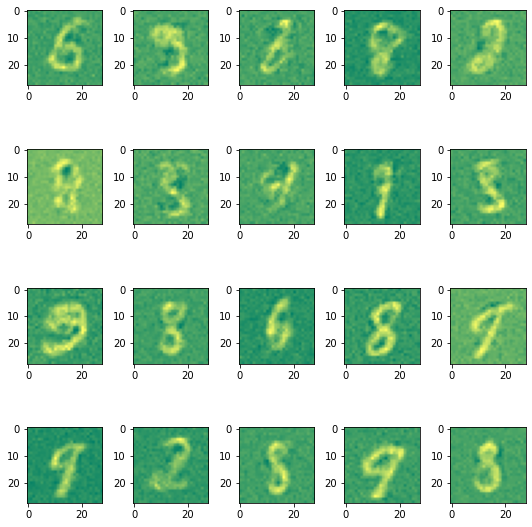

In [ ]:
num = 20
num_row = 4
num_col = 5

fig, axes = plt.subplots(num_row, num_col, figsize=(1.5*num_col,2*num_row))
images = [G(torch.randn(x.size(0), z_dim, device=device))[i].detach().cpu().reshape((28, 28)) for i in range(num)]
for i in range(num):
    ax = axes[i//num_col, i%num_col]
    ax.imshow(images[i], cmap='summer')
plt.tight_layout()
plt.show()

## Problem 2.2

In [ ]:
def interpolate(z1, z2, number_of_points=12):
    zs = torch.zeros((number_of_points, z1.shape[0]), device=device)
    for i in range(0, number_of_points):
        zs[i, :] = z1 * (i/(number_of_points-1)) + (1-i/(number_of_points-1)) * z2
    return zs

def plot_interpolation(zs, num_row, num_col):
    num = num_row * num_col
    fig, axes = plt.subplots(num_row, num_col, figsize=(1.5*num_col,2*num_row))
    generated_xs = G(zs)
    generated_xs = generated_xs.detach().cpu().reshape((num, 28, 28))
    # print(generated_xs.shape)
    # print(generated_xs[0, :, :].shape)
    # images = [G(zs)[i].detach().cpu().reshape((28, 28)) for i in range(num)]
    for i in range(num):
        ax = axes[i//num_col, i%num_col]
        ax.imshow(generated_xs[i, :, :], cmap='summer')
    plt.tight_layout()
    plt.show()

def plot_interpolation_between_random_points():
    z1 = torch.randn(z_dim, device=device)
    z2 = torch.randn(z_dim, device=device)
    zs = interpolate(z1, z2, number_of_points=12)
    plot_interpolation(zs, 3, 4)

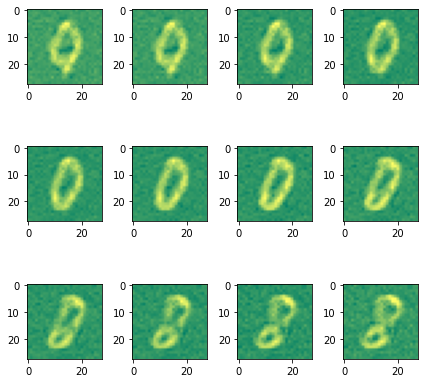

In [ ]:
plot_interpolation_between_random_points()

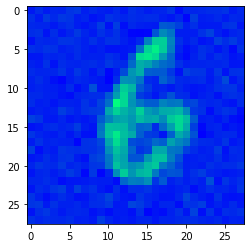

In [ ]:
z1 = torch.randn(z_dim, device=device)
image1 = (G(z1)).detach().cpu().reshape((28, 28))
plt.imshow(image1, cmap='winter')
# plt.show()

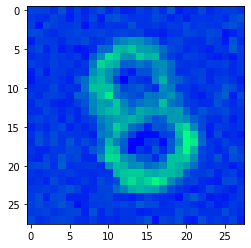

In [ ]:
z2 = torch.randn(z_dim, device=device)
image2 = (G(z2)).detach().cpu().reshape((28, 28))
plt.imshow(image2, cmap='winter')

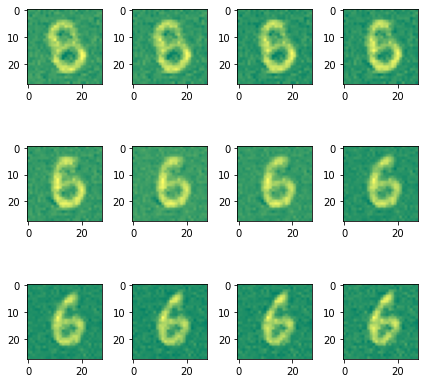

In [ ]:
plot_interpolation(interpolate(z1, z2, number_of_points=12), 3, 4)

## 2.3

In [ ]:
def interpolate_with_circle(z1, z2, number_of_points=12):
    z1_norm = (z1**2).sum().sqrt()
    z2_norm = (z2**2).sum().sqrt()
    z3 = z2 / z2_norm * z1_norm
    # print(z3)
    num_diff = number_of_points//2
    num_eq = number_of_points - num_diff
    zs = torch.zeros((number_of_points, z1.shape[0]), device=device)
    # Droga po łuku l(z1, z3)
    for i in range(0, num_eq):
        zs[i, :] = (z3 * (i/(num_eq-1)) + (1-i/(num_eq-1)) * z1)
        zs[i, :] = zs[i, :] / (zs[i, :]**2).sum().sqrt() * z1_norm
    # Droga po prostej p(z3, z2)
    for i in range(num_eq, num_diff+num_eq):
        zs[i, :] = z2 * ((i-num_eq)/(num_diff-1)) + (1-(i-num_eq)/(num_diff-1)) * z3
    return zs

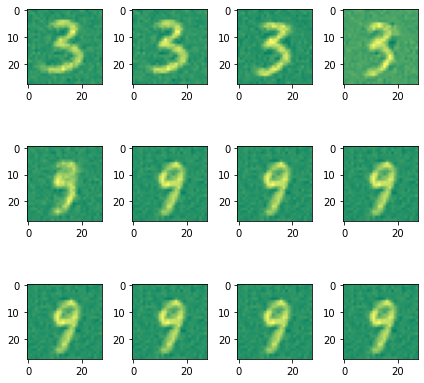

In [ ]:
plot_interpolation(interpolate_with_circle(torch.randn(z_dim, device=device), torch.randn(z_dim, device=device), number_of_points=12), 3, 4)

## 2.4

In [ ]:
# Load the data

batch_size = 128
data_path = "./data"

transform = torchvision.transforms.Compose(
    [
        torchvision.transforms.ToTensor(),
        torchvision.transforms.Normalize((0.1307,), (0.3081,)),
    ]
)

target_transform=torchvision.transforms.Compose([
                    lambda x:torch.LongTensor([x]), # or just torch.tensor
                    lambda x:F.one_hot(x,10)])

# target_transform=torchvision.transforms.Compose(
#     [
#         torchvision.transforms.ToTensor(), # or just torch.tensor
#         lambda x: F.one_hot(x,10)
#     ]
# )
# target_transform = Lambda(lambda y: torch.zeros(10, dtype=torch.float).scatter_(0, torch.tensor(y), value=1))

_test = torchvision.datasets.MNIST(
    data_path, train=False, download=True, transform=transform, target_transform=target_transform
)

# Load training data, split into train and valid sets
_train = torchvision.datasets.MNIST(
    data_path, train=True, download=True, transform=transform, target_transform=target_transform
)
_train.data = _train.data[:50000]
_train.targets = _train.targets[:50000]

_valid = torchvision.datasets.MNIST(
    data_path, train=True, download=True, transform=transform, target_transform=target_transform
)
_valid.data = _valid.data[50000:]
_valid.targets = _valid.targets[50000:]

mnist_loaders = {
    "train": InMemDataLoader(_train, batch_size=batch_size, shuffle=True),
    "valid": InMemDataLoader(_valid, batch_size=batch_size, shuffle=False),
    "test": InMemDataLoader(_test, batch_size=batch_size, shuffle=False),
}

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).


In [ ]:
ttt_max = -1000.0
ttt_min = 1000.0
for x, y in mnist_loaders["train"]:
    if x.max() > ttt_max:
        ttt_max = x.max()
    if x.min() < ttt_min:
        ttt_min = x.min()
ttt_max, ttt_min

(tensor(2.8215), tensor(-0.4242))

In [ ]:
 def generate_examples_cond(G, i=None):
    num = 20
    num_row = 5
    num_col = 4

    fig, axes = plt.subplots(num_row, num_col, figsize=(1.5*num_col,2*num_row))
    latents = torch.randn(num, z_dim, device=device)
    if i is None:
        labels = torch.randint(0, 10, (num,), device=device)
    else:
        labels = torch.ones((num,), dtype=torch.int64, device=device)*i
    labels = F.one_hot(labels, 10).float()
    images = G(latents, labels).detach().cpu().reshape((-1, 28, 28))

    labels_to_print = np.argmax(labels.detach().cpu().numpy(), axis=1)
    for i in range(num):
        ax = axes[i//num_col, i%num_col]
        ax.imshow(images[i], cmap='summer')
        ax.set_title('Label: {}'.format(labels_to_print[i]))
    plt.tight_layout()
    plt.show()

In [ ]:
class Generator(nn.Module):
    def __init__(self, in_dim=2, num_label=10, latent_dim=200, label_dim=1000, out_dim=784):
        super(Generator, self).__init__()
        # self.in_dim = in_dim
        # self.hid_dim = hid_dim
        # self.out_dim = out_dim

        self.layers_latent = nn.Sequential(
            nn.Linear(in_dim, latent_dim),
            nn.ReLU()
        )

        self.layers_label = nn.Sequential(
            nn.Linear(num_label, label_dim),
            nn.ReLU()
        )

        self.layers_head = nn.Sequential(
            nn.Linear(label_dim + latent_dim, label_dim + latent_dim),
            nn.ReLU(),
            nn.Linear(label_dim + latent_dim, out_dim),
        )

    def forward(self, x, y):
        x = self.layers_latent(x)
        y = self.layers_label(y)
        concated = torch.cat((x, y), dim=1)
        return self.layers_head(concated)


class Discriminator(nn.Module):
    def __init__(self, in_dim=784, num_label=10, latent_dim=200, label_dim=1000, out_dim=1):
        super(Discriminator, self).__init__()
        # self.in_dim = in_dim
        # self.hid_dim = hid_dim
        # self.out_dim = out_dim

        self.layers_latent = nn.Sequential(
            nn.Linear(in_dim, latent_dim),
            nn.ReLU()
        )

        self.layers_label = nn.Sequential(
            nn.Linear(num_label, label_dim),
            nn.ReLU()
        )

        self.layers_head = nn.Sequential(
            nn.Linear(label_dim + latent_dim, label_dim + latent_dim),
            nn.ReLU(),
            nn.Linear(label_dim + latent_dim, out_dim),
            nn.Sigmoid(),
        )

    def forward(self, x, y):
        x = self.layers_latent(x)
        y = self.layers_label(y)
        concated = torch.cat((x, y), dim=1)
        return self.layers_head(concated)

In [ ]:
def generator_loss(DG, eps=1e-6):
    loss = - (torch.ones_like(DG) * torch.log2(DG + eps)).mean()
    return 0.5 * loss

def discriminator_loss(DR, DG, eps=1e-6):
    real_loss = - (torch.ones_like(DR) * torch.log2(DR + eps)).mean()
    fake_loss = - (torch.ones_like(DG) * torch.log2(1 - DG + eps)).mean()
    return 0.5 * real_loss + 0.5 * fake_loss

In [ ]:
z_dim = 100
lr = 0.0001

G = Generator(in_dim=z_dim, num_label=10, latent_dim=200, label_dim=1000, out_dim=784).to(device)
D = Discriminator(in_dim=784, num_label=10, latent_dim=200, label_dim=1000, out_dim=1).to(device)
G_optimizer = optim.Adam(G.parameters(), lr=lr)
D_optimizer = optim.Adam(D.parameters(), lr=lr)

Epoch: 0 Generator loss: 170.2162 Discriminator loss: 45.2213


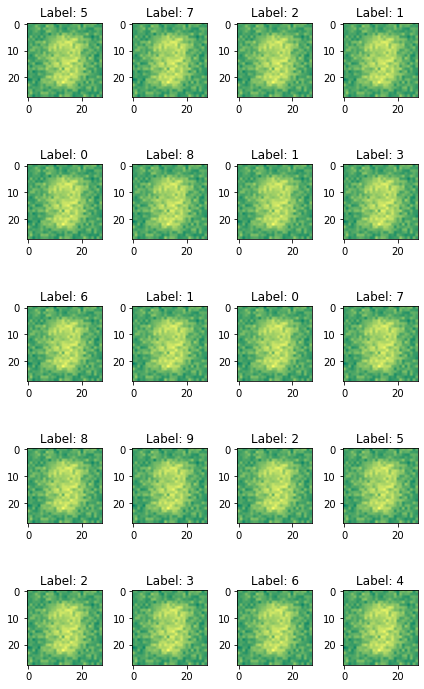

Epoch: 5 Generator loss: 443.4379 Discriminator loss: 11.6179


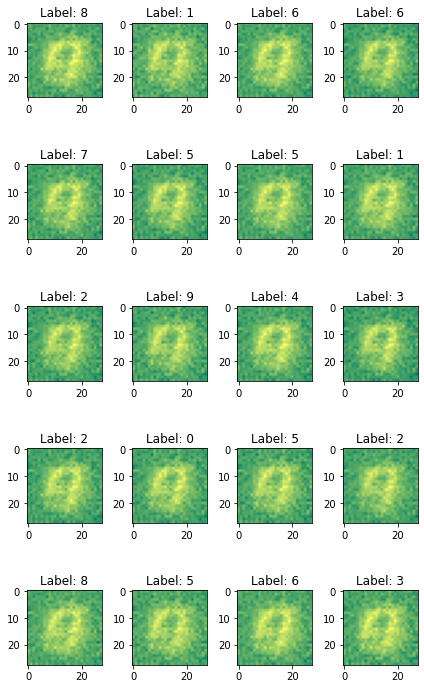

Epoch: 10 Generator loss: 417.3167 Discriminator loss: 13.0868


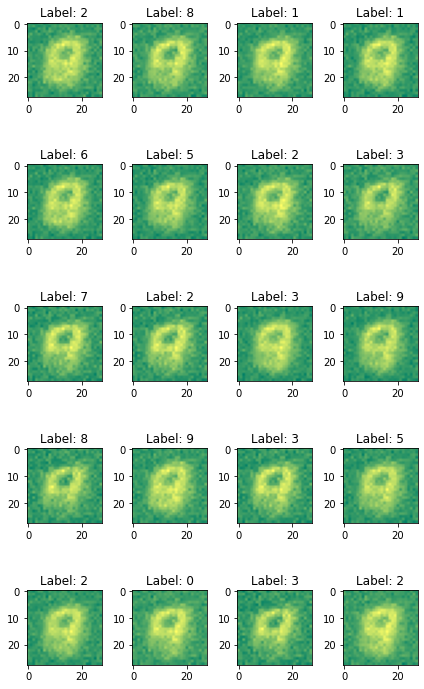

Epoch: 15 Generator loss: 420.4909 Discriminator loss: 18.6729


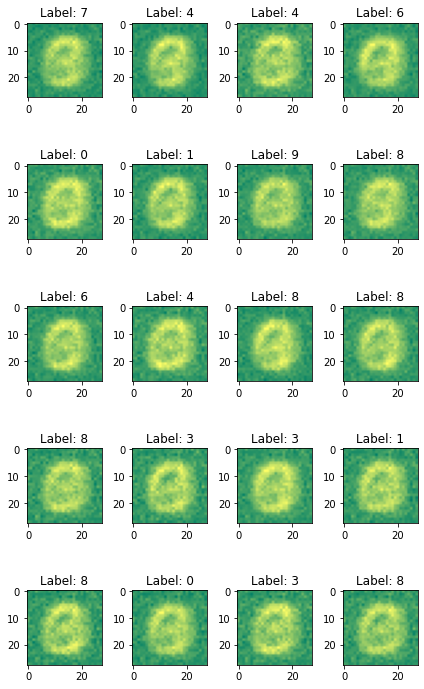

Epoch: 20 Generator loss: 491.4123 Discriminator loss: 8.1687


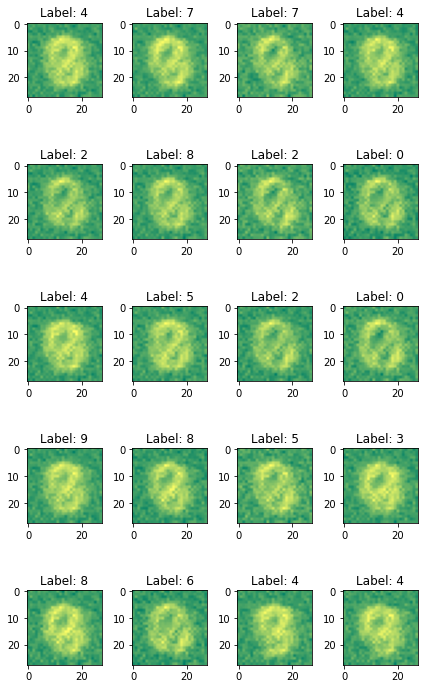

Epoch: 25 Generator loss: 362.4824 Discriminator loss: 12.3429


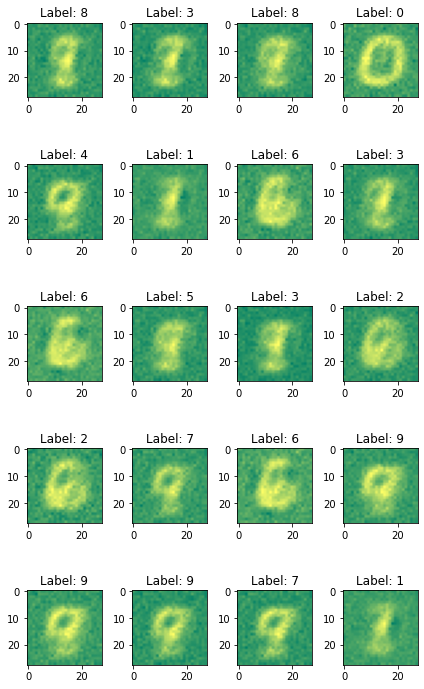

Epoch: 30 Generator loss: 433.5621 Discriminator loss: 11.0545


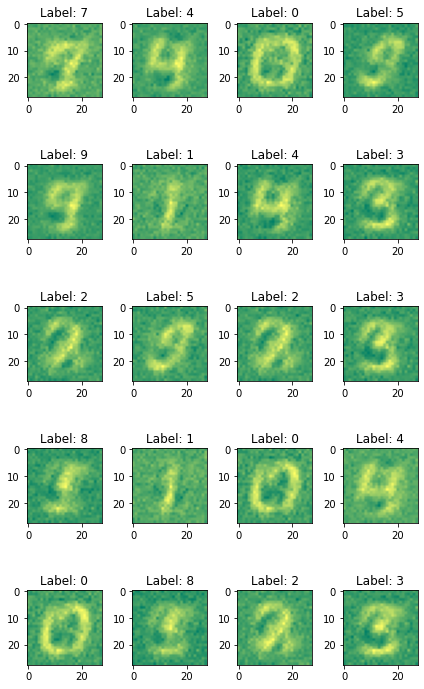

Epoch: 35 Generator loss: 340.7440 Discriminator loss: 11.6844


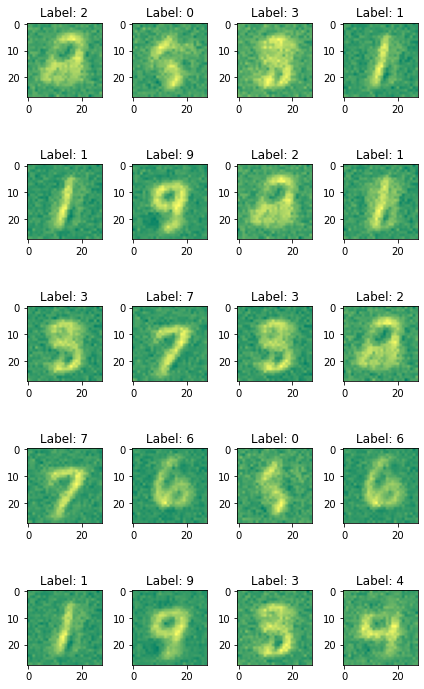

Epoch: 40 Generator loss: 339.1647 Discriminator loss: 13.5183


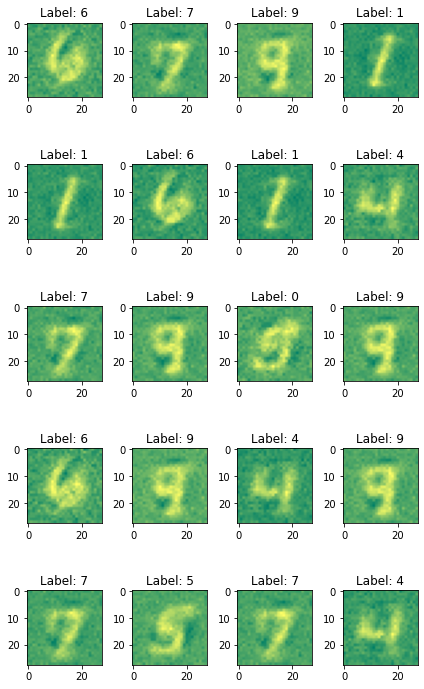

Epoch: 45 Generator loss: 391.1893 Discriminator loss: 11.8826


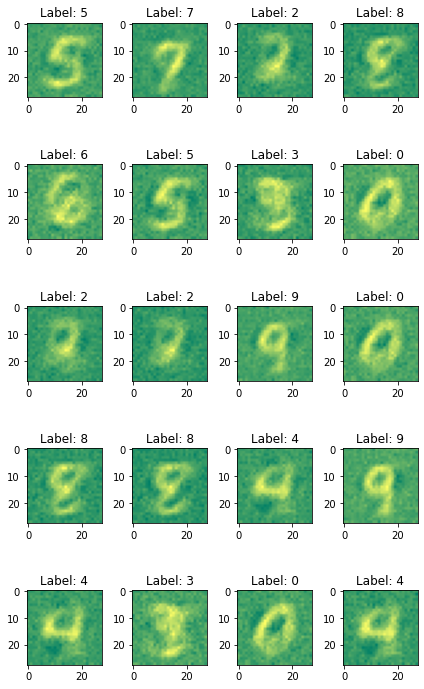

Epoch: 50 Generator loss: 330.6245 Discriminator loss: 13.4896


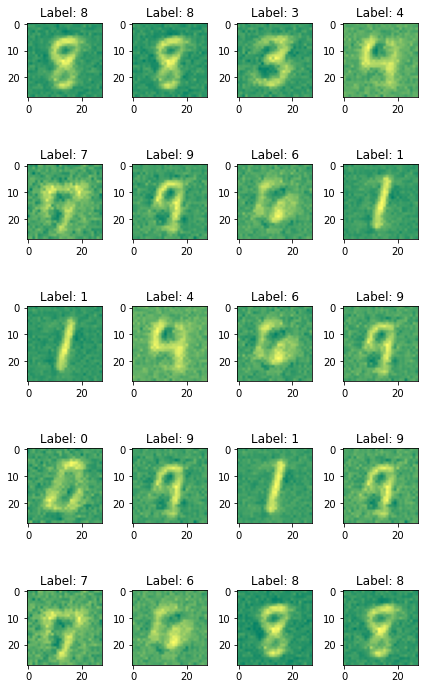

Epoch: 55 Generator loss: 366.6926 Discriminator loss: 14.8153


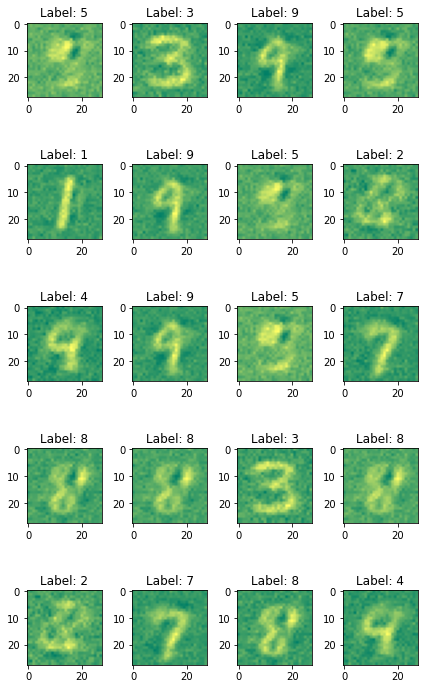

Epoch: 60 Generator loss: 321.5014 Discriminator loss: 21.5293


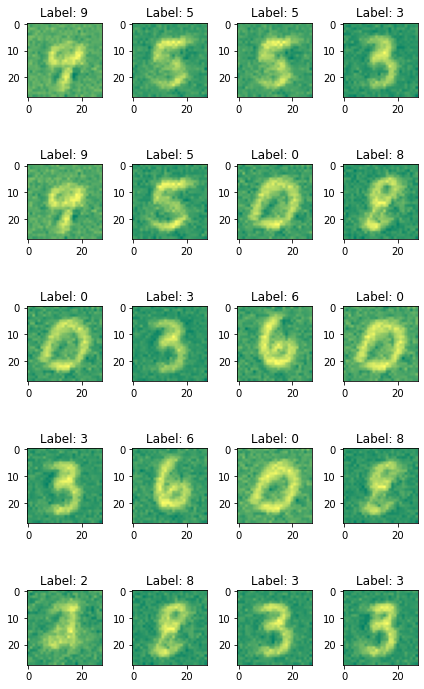

Epoch: 65 Generator loss: 305.5972 Discriminator loss: 23.9874


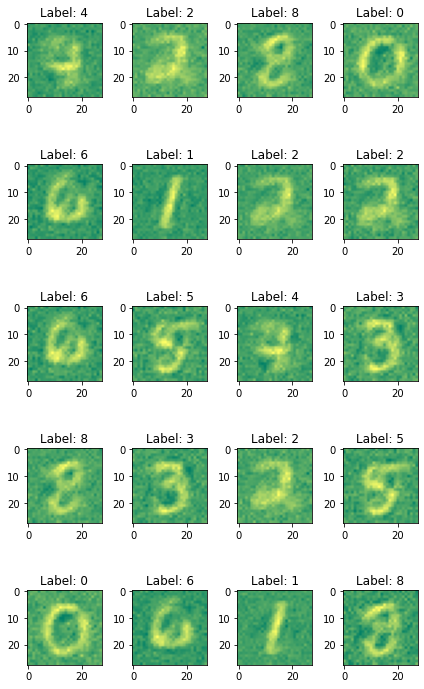

Epoch: 70 Generator loss: 307.6422 Discriminator loss: 21.4736


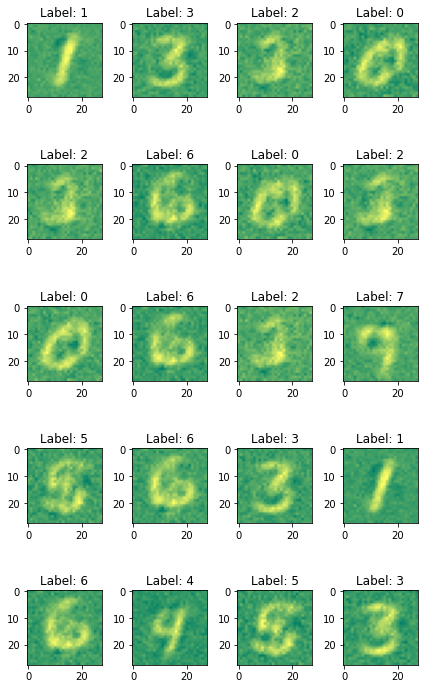

Epoch: 75 Generator loss: 323.6436 Discriminator loss: 20.3066


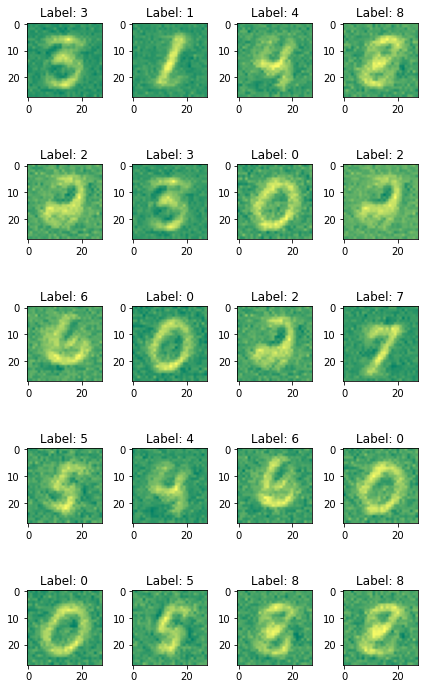

Epoch: 80 Generator loss: 370.3695 Discriminator loss: 19.7348


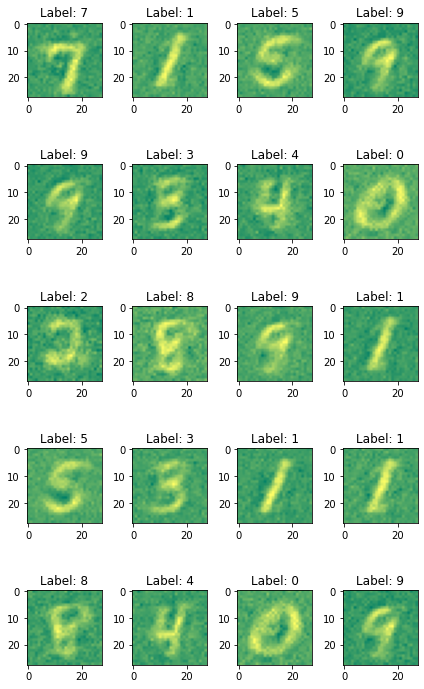

Epoch: 85 Generator loss: 311.6331 Discriminator loss: 22.5593


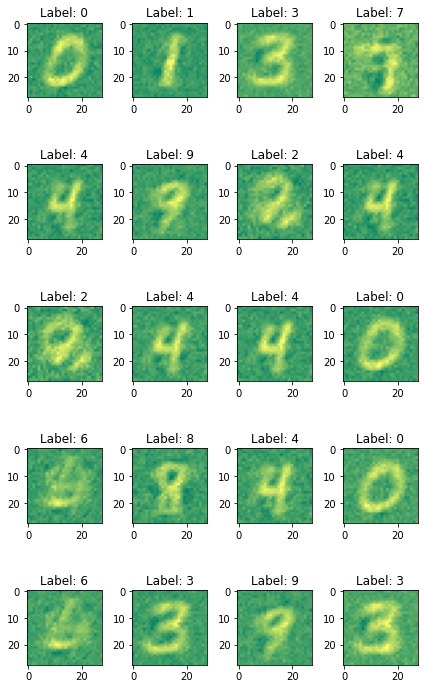

Epoch: 90 Generator loss: 315.9096 Discriminator loss: 20.6362


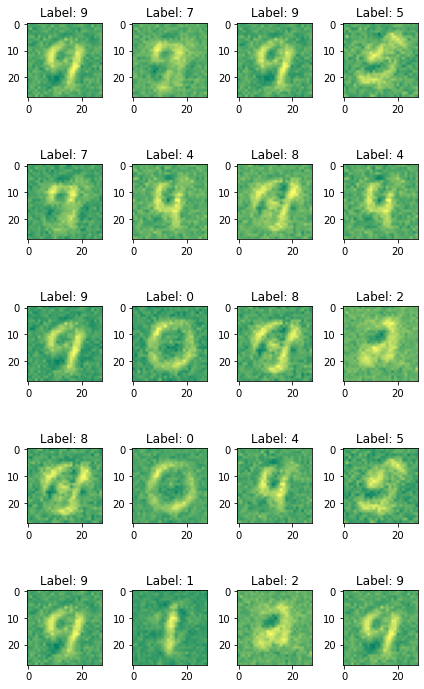

Epoch: 95 Generator loss: 328.5813 Discriminator loss: 28.4519


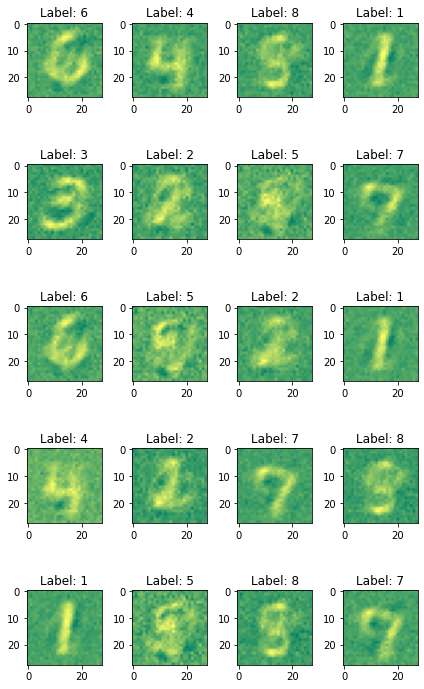

In [ ]:
try:
    for i in range(100):
        G_loss_acc = 0.0
        D_loss_acc = 0.0
        G.train()
        D.train()
        for x, y in mnist_loaders["train"]:
            x = x.view(x.size(0), -1)
            x = x.float().to(device)
            y = y.float().reshape((-1, 10)).to(device)
            y_fake = y.clone()
            y_datached = y.detach()

            # Generate fake data from z ~ N(0,1).
            # Calculate Generator loss.
            # print(y_fake.shape, z.shape)
            z = torch.rand(x.size(0), z_dim, device=device)
            x_fake = G(z, y_fake)  # Use the generator to compute x_Fake

            # make a copy of x_fake and detach it, we'll use the copy to train the Discriminator
            x_fake_detached = x_fake.detach()

            G_loss = generator_loss(D(x_fake, y_fake)) # Now use the discriminator and compute generator loss

            G_optimizer.zero_grad()
            G_loss.backward()
            G_optimizer.step()

            
            # Calculate Discriminator loss.
            # Remember to use x_fake_detached to prevent backpropagating through generator!
            D_loss = discriminator_loss(D(x, y_datached), D(x_fake_detached, y_datached))

            D_optimizer.zero_grad()
            D_loss.backward()
            D_optimizer.step()

            G_loss_acc += G_loss.item() * len(x)
            D_loss_acc += D_loss.item() * len(x)

        if i % 5 == 0:
            G.eval()
            with torch.no_grad():
                z = torch.rand(1000, z_dim, device=device)
                y = torch.randint(0, 10, (1000,), device=device)
                y = F.one_hot(y, 10).float()
                x_gen = G(z, y).cpu()
                # plt.scatter(x_gen[:, 0], x_gen[:, 1])
                # plt.title(
                #     f"Epoch: {i} Generator loss: {G_loss_acc / len(mnist_loaders["train"]) :.4f} Discriminator loss: {D_loss_acc / len(mnist_loaders["train"]) :.4f}"
                # )
                # plt.show()
                print(f"Epoch: {i} Generator loss: {G_loss_acc / len(mnist_loaders['train']) :.4f} Discriminator loss: {D_loss_acc / len(mnist_loaders['train']) :.4f}")
                generate_examples_cond(G)
except KeyboardInterrupt:
    pass